In [205]:
# Standard library imports
import os
import sys
import random

# Data manipulation and visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# External libraries
import wandb
import esm
import gc
from biopandas.pdb import PandasPdb
from Bio.SubsMat import MatrixInfo
from collections import Counter

# PyTorch imports
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader
import torch.optim as optim

# OmegaConf import
from omegaconf import OmegaConf

# PyTorch Lightning imports
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import WandbLogger
from torchmetrics import MeanSquaredError, R2Score, SpearmanCorrCoef

# Custom imports
from protein_mpnn_utils import ProteinMPNN, tied_featurize
from datasets import FireProtDataset, MegaScaleDataset, ComboDataset

# Scientific computing imports
from scipy.special import softmax
from scipy.stats import entropy
from scipy.stats import spearmanr

# Scikit-learn imports
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [327]:
yaml = "config.yaml"
cfg = OmegaConf.load(yaml)
cfg = OmegaConf.merge(cfg, OmegaConf.load("local.yaml"))  
cfg = OmegaConf.merge(cfg, OmegaConf.from_cli())

In [239]:
thermompnn_dir = cfg.platform.thermompnn_dir
sys.path.append(thermompnn_dir)

print(sys.executable)

print(os.getcwd())  # Check current working directory
# os.chdir('/path/to/your/directory')  # Change directory if necessary

c:\Users\karishma\anaconda3\envs\thermoMPNN\python.exe
c:\Users\karishma\OneDrive\Desktop\AI\GTech\DVA\Project\AlgoRxplorers\ThermoMPNN


In [240]:
cuda_available = torch.cuda.is_available()

if cuda_available:
    print(f"Number of GPUs available: {torch.cuda.device_count()}")
    print(f"Name of the GPU: {torch.cuda.get_device_name(0)}")
else:
    print("PyTorch is using CPU")

Number of GPUs available: 1
Name of the GPU: NVIDIA GeForce RTX 3060 Ti


In [209]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [210]:
torch.manual_seed(0)
np.random.seed(0)
random.seed(0)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Data Preprocessing

In [219]:
def load_datasets(cfg):
    # load the specified dataset
    if len(cfg.datasets) == 1:  # one dataset training
        dataset = cfg.datasets[0]
        if dataset == 'fireprot':
            train_dataset = FireProtDataset(cfg, "train")
            val_dataset = FireProtDataset(cfg, "val")
        elif dataset == 'megascale_s669':
            train_dataset = MegaScaleDataset(cfg, "train_s669")
            val_dataset = MegaScaleDataset(cfg, "val")
        elif dataset.startswith('megascale_cv'):
            cv = dataset[-1]
            train_dataset = MegaScaleDataset(cfg, f"cv_train_{cv}")
            val_dataset = MegaScaleDataset(cfg, f"cv_val_{cv}")
        elif dataset == 'megascale':
            train_dataset = MegaScaleDataset(cfg, "train")
            val_dataset = MegaScaleDataset(cfg, "val")
        else:
            raise ValueError("Invalid dataset specified!")
    else:
        train_dataset = ComboDataset(cfg, "train")
        val_dataset = ComboDataset(cfg, "val")
    
    return train_dataset, val_dataset

In [220]:
train_dataset, val_dataset = load_datasets(cfg)

In [221]:
def extract_unique_chain_keys(dataset):
    unique_seq_chain_keys = set()
    unique_coords_chain_keys = set()

    for item in dataset:
        protein_info_list, mutations_list = item  # Already confirmed each item has this structure
        
        for protein_info in protein_info_list:
            # Extract all keys that match 'seq_chain_X' and 'coords_chain_X'
            for key in protein_info.keys():
                if key.startswith('seq_chain_'):
                    unique_seq_chain_keys.add(key)
                elif key.startswith('coords_chain_'):
                    unique_coords_chain_keys.add(key)

    return unique_seq_chain_keys, unique_coords_chain_keys

# Apply the function to your train_dataset and val_dataset
train_seq_keys, train_coords_keys = extract_unique_chain_keys(train_dataset)
val_seq_keys, val_coords_keys = extract_unique_chain_keys(val_dataset)

# Print the results
print("Unique 'seq_chain_[LETTER]' keys in train_dataset:", train_seq_keys)
print("Unique 'coords_chain_[LETTER]' keys in train_dataset:", train_coords_keys)
print("Unique 'seq_chain_[LETTER]' keys in val_dataset:", val_seq_keys)
print("Unique 'coords_chain_[LETTER]' keys in val_dataset:", val_coords_keys)

Unique 'seq_chain_[LETTER]' keys in train_dataset: {'seq_chain_X', 'seq_chain_A'}
Unique 'coords_chain_[LETTER]' keys in train_dataset: {'coords_chain_A', 'coords_chain_X'}
Unique 'seq_chain_[LETTER]' keys in val_dataset: {'seq_chain_A'}
Unique 'coords_chain_[LETTER]' keys in val_dataset: {'coords_chain_A'}


In [222]:
# Extract the protein information and mutations from the dataset
protein_info_list, mutations_list = train_dataset[0]
protein_info = protein_info_list[0]

print("Protein info:", protein_info)

# Dynamically find the sequence and coordinate keys
seq_chain_key = next((key for key in protein_info if key.startswith('seq_chain')), 'seq_chain')
coords_chain_key = next((key for key in protein_info if key.startswith('coords_chain')), 'coords_chain')

# Extract values using dynamic keys
seq_chain = protein_info.get(seq_chain_key)
coords_chain = protein_info.get(coords_chain_key)
name = protein_info.get('name')
num_of_chains = protein_info.get('num_of_chains')
seq = protein_info.get('seq')

print(f"{seq_chain_key}:", seq_chain)
print(f"{coords_chain_key}:", coords_chain)
print("Name:", name)
print("Number of chains:", num_of_chains)
print("Seq:", seq)

# print("Example item in mutations list:", mutations_list[0])
print("Length of mutations list for that specific pdb:", len(mutations_list))

# Iterating through the mutations list to confirm each is PDB specific
for i, mutation in enumerate(mutations_list):
    if i < 5:  # Only print details for the first 5 mutations to limit output
        position = mutation.position
        wildtype = mutation.wildtype
        mutation_aa = mutation.mutation  # Use mutation_aa to avoid conflict with the keyword
        ddG = mutation.ddG
        pdb = mutation.pdb
        print(f"Position: {position}, Wildtype: {wildtype}, Mutation: {mutation_aa}, ΔΔG: {ddG}, PDB: {pdb}")
    else:
        break


Protein info: {'seq_chain_A': 'MTYKLILNGKTLKGETTTEAVDAATAEKVFKQYANDNGVDGEWTYDDATKTFTVTE', 'coords_chain_A': {'N_chain_A': [[26.778, 34.213, 35.88], [27.942, 30.785, 35.765], [27.727, 28.474, 33.178], [27.209, 25.188, 31.822], [27.906, 23.017, 29.076], [26.872, 20.127, 27.677], [27.883, 18.141, 25.16], [26.656, 15.886, 22.895], [27.39, 14.85, 20.248], [27.644, 13.275, 16.967], [30.199, 13.192, 16.095], [31.689, 14.98, 17.82], [32.202, 15.087, 21.265], [31.742, 16.049, 24.564], [32.511, 18.353, 27.246], [31.962, 21.662, 28.166], [32.102, 24.933, 29.549], [30.56, 28.182, 30.238], [30.512, 31.719, 30.863], [27.93, 33.807, 31.698], [25.406, 36.414, 31.687], [22.687, 35.605, 31.888], [20.639, 32.74, 31.269], [19.543, 32.88, 28.616], [21.411, 34.253, 27.198], [23.632, 32.57, 27.51], [22.691, 30.378, 26.13], [22.706, 31.36, 23.469], [25.471, 31.76, 22.968], [26.469, 29.154, 23.332], [25.007, 27.737, 21.289], [26.018, 28.963, 19.088], [28.656, 28.118, 19.451], [28.338, 25.291, 19.178], [27.384,

In [223]:
# Create a list to store the tuples of PDB ID, position, wildtype, mutation, ddG value, name, num_of_chains, seq, and seq_chain_A for each entry in the train_dataset
train_entries = []
for item in train_dataset:
    protein_info_list, mutations_list = item
    protein_info = protein_info_list[0]
    
    # Get the relevant information from the protein_info dictionary
    name = protein_info.get('name', 'N/A')
    num_of_chains = protein_info.get('num_of_chains', 'N/A')
    seq = protein_info.get('seq', 'N/A')
    seq_chain_A = protein_info.get('seq_chain_A', 'N/A')
    
    for mutation in mutations_list:
        entry = (mutation.pdb, mutation.position, mutation.wildtype, mutation.mutation, mutation.ddG.item(), name, num_of_chains, seq, seq_chain_A)
        train_entries.append(entry)

# Count the occurrences of each unique entry
entry_counts = Counter(train_entries)

# Print the entries that appear more than once (duplicates)
print("Duplicate entries in train_dataset (without considering 'CA_chain_A'):")
for entry, count in entry_counts.items():
    if count > 1:
        print(f"PDB ID: {entry[0]}, Position: {entry[1]}, Wildtype: {entry[2]}, Mutation: {entry[3]}, ddG: {entry[4]}")
        print(f" Name: {entry[5]}")
        print(f" Number of Chains: {entry[6]}")
        print(f" Sequence: {entry[7]}")
        print(f" Seq Chain A: {entry[8]}")
        print(f" Count: {count}")
        print()

# Print the total number of duplicates
total_train_duplicates = sum(count - 1 for count in entry_counts.values() if count > 1)
print(f"Total number of duplicates in train_dataset (without considering 'CA_chain_A'): {total_train_duplicates}")

# Print the length of the original train_dataset and the percentage of duplicates
original_train_length = len(train_entries)
unique_train_length = len(entry_counts)
percentage_train_duplicates = (total_train_duplicates / original_train_length) * 100
print(f"Length of original train_dataset: {original_train_length}")
print(f"Length of train_dataset without duplicates: {unique_train_length}")
print(f"Percentage of duplicates in train_dataset: {percentage_train_duplicates:.2f}%")
print()

Duplicate entries in train_dataset (without considering 'CA_chain_A'):
PDB ID: 1ISP, Position: 13, Wildtype: A, Mutation: S, ddG: -0.18000000715255737
 Name: C:\Users\karishma\OneDrive\Desktop\AI\GTech\DVA\Project\ThermoMPNN\fireprot_upload\pdbs\1ISP
 Number of Chains: 1
 Sequence: EHNPVVMVHGIGGASFNFAGIKSYLVSQGWSRDKLYAVDFWDKTGTNYNNGPVLSRFVQKVLDETGAKKVDIVAHSMGGANTLYYIKNLDGGNKVANVVTLGGANRLTTGKALPGTDPNQKILYTSIYSSADMIVMNYLSRLDGARNVQIHGVGHIGLLYSSQVNSLIKEGLNGGGQNT
 Seq Chain A: EHNPVVMVHGIGGASFNFAGIKSYLVSQGWSRDKLYAVDFWDKTGTNYNNGPVLSRFVQKVLDETGAKKVDIVAHSMGGANTLYYIKNLDGGNKVANVVTLGGANRLTTGKALPGTDPNQKILYTSIYSSADMIVMNYLSRLDGARNVQIHGVGHIGLLYSSQVNSLIKEGLNGGGQNT
 Count: 2

PDB ID: 1ISP, Position: 15, Wildtype: F, Mutation: T, ddG: -0.5199999809265137
 Name: C:\Users\karishma\OneDrive\Desktop\AI\GTech\DVA\Project\ThermoMPNN\fireprot_upload\pdbs\1ISP
 Number of Chains: 1
 Sequence: EHNPVVMVHGIGGASFNFAGIKSYLVSQGWSRDKLYAVDFWDKTGTNYNNGPVLSRFVQKVLDETGAKKVDIVAHSMGGANTLYYIKNLDGGNKVANVVTLGGANRLTTGKALPGTDPNQK

In [224]:
# Create a list to store the tuples of PDB ID, position, wildtype, mutation, ddG value, name, num_of_chains, seq, and seq_chain_A for each entry in the val_dataset
val_entries = []
for item in val_dataset:
    protein_info_list, mutations_list = item
    protein_info = protein_info_list[0]
    
    # Get the relevant information from the protein_info dictionary
    name = protein_info.get('name', 'N/A')
    num_of_chains = protein_info.get('num_of_chains', 'N/A')
    seq = protein_info.get('seq', 'N/A')
    seq_chain_A = protein_info.get('seq_chain_A', 'N/A')
    
    for mutation in mutations_list:
        entry = (mutation.pdb, mutation.position, mutation.wildtype, mutation.mutation, mutation.ddG.item(), name, num_of_chains, seq, seq_chain_A)
        val_entries.append(entry)

# Count the occurrences of each unique entry
entry_counts = Counter(val_entries)

# Print the entries that appear more than once (duplicates)
print("Duplicate entries in val_dataset (without considering 'CA_chain_A'):")
for entry, count in entry_counts.items():
    if count > 1:
        print(f"PDB ID: {entry[0]}, Position: {entry[1]}, Wildtype: {entry[2]}, Mutation: {entry[3]}, ddG: {entry[4]}")
        print(f" Name: {entry[5]}")
        print(f" Number of Chains: {entry[6]}")
        print(f" Sequence: {entry[7]}")
        print(f" Seq Chain A: {entry[8]}")
        print(f" Count: {count}")
        print()

# Print the total number of duplicates
total_val_duplicates = sum(count - 1 for count in entry_counts.values() if count > 1)
print(f"Total number of duplicates in val_dataset (without considering 'CA_chain_A'): {total_val_duplicates}")

# Print the length of the original val_dataset and the percentage of duplicates
original_val_length = len(val_entries)
unique_val_length = len(entry_counts)
percentage_val_duplicates = (total_val_duplicates / original_val_length) * 100
print(f"Length of original val_dataset: {original_val_length}")
print(f"Length of val_dataset without duplicates: {unique_val_length}")
print(f"Percentage of duplicates in val_dataset: {percentage_val_duplicates:.2f}%")

Duplicate entries in val_dataset (without considering 'CA_chain_A'):
PDB ID: 5DFR, Position: 114, Wildtype: I, Mutation: A, ddG: 1.0
 Name: C:\Users\karishma\OneDrive\Desktop\AI\GTech\DVA\Project\ThermoMPNN\fireprot_upload\pdbs\5DFR
 Number of Chains: 1
 Sequence: MISLIAALAVDRVIG-----PWNLPADLAWFKRNTLDKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
 Seq Chain A: MISLIAALAVDRVIG-----PWNLPADLAWFKRNTLDKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
 Count: 2

PDB ID: 5DFR, Position: 132, Wildtype: W, Mutation: F, ddG: 0.0
 Name: C:\Users\karishma\OneDrive\Desktop\AI\GTech\DVA\Project\ThermoMPNN\fireprot_upload\pdbs\5DFR
 Number of Chains: 1
 Sequence: MISLIAALAVDRVIG-----PWNLPADLAWFKRNTLDKPVIMGRHTWESIGRPLPGRKNIILSSQPGTDDRVTWVKSVDEAIAACGDVPEIMVIGGGRVYEQFLPKAQKLYLTHIDAEVEGDTHFPDYEPDDWESVFSEFHDADAQNSHSYCFEILERR
 Seq Chain A: MISLIAALAVDRVIG-----

In [225]:
# Remove duplicates from train_dataset
unique_train_entries = set()
updated_train_dataset = []

for item in train_dataset:
    protein_info_list, mutations_list = item
    updated_protein_info_list = []
    updated_mutations_list = []
    
    for protein_info in protein_info_list:
        # Dynamically extract keys for sequence and coordinates using the specific format
        seq_chain_key = next((key for key in protein_info if key.startswith('seq_chain_')), None)
        coords_chain_key = next((key for key in protein_info if key.startswith('coords_chain_')), None)

        if seq_chain_key and coords_chain_key:
            seq_chain = protein_info[seq_chain_key]
            coords_chain = protein_info[coords_chain_key]
            name = protein_info.get('name')
            num_of_chains = protein_info.get('num_of_chains')
            seq = protein_info.get('seq')

            updated_protein_info = {
                seq_chain_key: seq_chain,
                coords_chain_key: coords_chain,
                'name': name,
                'num_of_chains': num_of_chains,
                'seq': seq
            }
            updated_protein_info_list.append(updated_protein_info)

    for mutation in mutations_list:
        entry = (
            mutation.pdb,
            mutation.position,
            mutation.wildtype,
            mutation.mutation,
            mutation.ddG.item() if hasattr(mutation.ddG, 'item') else mutation.ddG,
            name,
            num_of_chains,
            seq,
            seq_chain
        )

        if entry not in unique_train_entries:
            unique_train_entries.add(entry)
            updated_mutations_list.append(mutation)

    updated_train_dataset.append((updated_protein_info_list, updated_mutations_list))

# Similar modifications should be applied to val_dataset processing
unique_val_entries = set()
updated_val_dataset = []

for item in val_dataset:
    protein_info_list, mutations_list = item
    updated_protein_info_list = []
    updated_mutations_list = []
    
    for protein_info in protein_info_list:
        # Dynamically extract keys for sequence and coordinates using the specific format
        seq_chain_key = next((key for key in protein_info if key.startswith('seq_chain_')), None)
        coords_chain_key = next((key for key in protein_info if key.startswith('coords_chain_')), None)

        if seq_chain_key and coords_chain_key:
            seq_chain = protein_info[seq_chain_key]
            coords_chain = protein_info[coords_chain_key]
            name = protein_info.get('name')
            num_of_chains = protein_info.get('num_of_chains')
            seq = protein_info.get('seq')

            updated_protein_info = {
                seq_chain_key: seq_chain,
                coords_chain_key: coords_chain,
                'name': name,
                'num_of_chains': num_of_chains,
                'seq': seq
            }
            updated_protein_info_list.append(updated_protein_info)

    for mutation in mutations_list:
        entry = (
            mutation.pdb,
            mutation.position,
            mutation.wildtype,
            mutation.mutation,
            mutation.ddG.item() if hasattr(mutation.ddG, 'item') else mutation.ddG,
            name,
            num_of_chains,
            seq,
            seq_chain
        )

        if entry not in unique_val_entries:
            unique_val_entries.add(entry)
            updated_mutations_list.append(mutation)

    updated_val_dataset.append((updated_protein_info_list, updated_mutations_list))

# Print statements below can be used to verify the format of the updated datasets

# print("Type of the first item in train_dataset:", type(train_dataset[0]))
# print("Length of the first item in train_dataset:", len(train_dataset[0]))
# print("Type of the first element in the first item of train_dataset:", type(train_dataset[0][0]))
# print("Length of the first element in the first item of train_dataset:", len(train_dataset[0][0]))
# print("Type of the first dictionary in the first element of the first item of train_dataset:", type(train_dataset[0][0][0]))
# print("Length of the first dictionary in the first element of the first item of train_dataset:", len(train_dataset[0][0][0]))
# print("Keys of the first dictionary in the first element of the first item of train_dataset:", train_dataset[0][0][0].keys())
# print("Type of the second element in the first item of train_dataset:", type(train_dataset[0][1]))
# print("Length of the second element in the first item of train_dataset:", len(train_dataset[0][1]))
# print("Type of the first item in the second element of the first item of train_dataset:", type(train_dataset[0][1][0]))

# print("Type of the first item in updated_train_dataset:", type(updated_train_dataset[0]))
# print("Length of the first item in updated_train_dataset:", len(updated_train_dataset[0]))
# print("Type of the first element in the first item of updated_train_dataset:", type(updated_train_dataset[0][0]))
# print("Length of the first element in the first item of updated_train_dataset:", len(updated_train_dataset[0][0]))
# print("Type of the first dictionary in the first element of the first item of updated_train_dataset:", type(updated_train_dataset[0][0][0]))
# print("Length of the first dictionary in the first element of the first item of updated_train_dataset:", len(updated_train_dataset[0][0][0]))
# print("Keys of the first dictionary in the first element of the first item of updated_train_dataset:", updated_train_dataset[0][0][0].keys())
# print("Type of the second element in the first item of updated_train_dataset:", type(updated_train_dataset[0][1]))
# print("Length of the second element in the first item of updated_train_dataset:", len(updated_train_dataset[0][1]))
# print("Type of the first item in the second element of the first item of updated_train_dataset:", type(updated_train_dataset[0][1][0]))

In [226]:
# Extract the protein information and mutations from the dataset
protein_info_list, mutations_list = updated_train_dataset[0]
protein_info = protein_info_list[0]

print("Protein info:", protein_info)

# Dynamically find the sequence and coordinate keys
seq_chain_key = next((key for key in protein_info if key.startswith('seq_chain')), 'seq_chain')
coords_chain_key = next((key for key in protein_info if key.startswith('coords_chain')), 'coords_chain')

# Extract values using dynamic keys
seq_chain = protein_info.get(seq_chain_key)
coords_chain = protein_info.get(coords_chain_key)
name = protein_info.get('name')
num_of_chains = protein_info.get('num_of_chains')
seq = protein_info.get('seq')

print(f"{seq_chain_key}:", seq_chain)
print(f"{coords_chain_key}:", coords_chain)
print("Name:", name)
print("Number of chains:", num_of_chains)
print("Seq:", seq)

# print("Example item in mutations list:", mutations_list[0])
print("Length of mutations list for that specific pdb:", len(mutations_list))

# Iterating through the mutations list to confirm each is PDB specific
for i, mutation in enumerate(mutations_list):
    if i < 5:  # Only print details for the first 5 mutations to limit output
        position = mutation.position
        wildtype = mutation.wildtype
        mutation_aa = mutation.mutation  # Use mutation_aa to avoid conflict with the keyword
        ddG = mutation.ddG
        pdb = mutation.pdb
        print(f"Position: {position}, Wildtype: {wildtype}, Mutation: {mutation_aa}, ΔΔG: {ddG}, PDB: {pdb}")
    else:
        break

Protein info: {'seq_chain_A': 'MTYKLILNGKTLKGETTTEAVDAATAEKVFKQYANDNGVDGEWTYDDATKTFTVTE', 'coords_chain_A': {'N_chain_A': [[26.778, 34.213, 35.88], [27.942, 30.785, 35.765], [27.727, 28.474, 33.178], [27.209, 25.188, 31.822], [27.906, 23.017, 29.076], [26.872, 20.127, 27.677], [27.883, 18.141, 25.16], [26.656, 15.886, 22.895], [27.39, 14.85, 20.248], [27.644, 13.275, 16.967], [30.199, 13.192, 16.095], [31.689, 14.98, 17.82], [32.202, 15.087, 21.265], [31.742, 16.049, 24.564], [32.511, 18.353, 27.246], [31.962, 21.662, 28.166], [32.102, 24.933, 29.549], [30.56, 28.182, 30.238], [30.512, 31.719, 30.863], [27.93, 33.807, 31.698], [25.406, 36.414, 31.687], [22.687, 35.605, 31.888], [20.639, 32.74, 31.269], [19.543, 32.88, 28.616], [21.411, 34.253, 27.198], [23.632, 32.57, 27.51], [22.691, 30.378, 26.13], [22.706, 31.36, 23.469], [25.471, 31.76, 22.968], [26.469, 29.154, 23.332], [25.007, 27.737, 21.289], [26.018, 28.963, 19.088], [28.656, 28.118, 19.451], [28.338, 25.291, 19.178], [27.384,

In [227]:
# Note, if final model is not utilized, then bad process isnt required
bad = [
    '1LVE', '2IMM', '2RPN', '1BKS', '1BLC', '1D5G', '1KDX', '1OTR', '3BN0', '3D3B', '3HHR', '3O39',
    '3BDC', '1AMQ', '1X0J', '1TPK', '1GLM', '1RHG', '3DVI', '1RN1', '1QGV',
    '1SVX', '4E5K', '1THQ', '4BLM'
]
print(f'We will ignore mutations from {len(bad)} PDB files if they are in our data')

# Filter the train_dataset
filtered_train_dataset = []
for item in updated_train_dataset:
    protein_info_list, mutations_list = item
    filtered_mutations_list = [mutation for mutation in mutations_list if mutation.pdb not in bad]
    if filtered_mutations_list:
        filtered_train_dataset.append((protein_info_list, filtered_mutations_list))

# Filter the val_dataset
filtered_val_dataset = []
for item in updated_val_dataset:
    protein_info_list, mutations_list = item
    filtered_mutations_list = [mutation for mutation in mutations_list if mutation.pdb not in bad]
    if filtered_mutations_list:
        filtered_val_dataset.append((protein_info_list, filtered_mutations_list))

print("Length of filtered training dataset:", len(filtered_train_dataset))
print("Length of filtered validation dataset:", len(filtered_val_dataset))

We will ignore mutations from 25 PDB files if they are in our data
Length of filtered training dataset: 54
Length of filtered validation dataset: 15


In [228]:
train_dataset = filtered_train_dataset
val_dataset = filtered_val_dataset

In [229]:
def collate_fn(x):
    return x

In [230]:
def create_data_loaders(cfg, train_dataset, val_dataset):
    if 'num_workers' in cfg.training:
        train_workers, val_workers = int(cfg.training.num_workers * 0.75), int(cfg.training.num_workers * 0.25)
    else:
        train_workers, val_workers = 0, 0

    train_loader = DataLoader(train_dataset, collate_fn=collate_fn, shuffle=True, num_workers=train_workers)
    val_loader = DataLoader(val_dataset, collate_fn=collate_fn, num_workers=val_workers)

    return train_loader, val_loader

In [231]:
train_loader, val_loader = create_data_loaders(cfg, train_dataset, val_dataset)

In [232]:
unique_pdbs_per_batch = []
mutations_count_per_batch = []

for batch in train_loader:
    # Unpack the batch
    batch_data = batch[0]  # Already confirmed each batch is a list containing a single element.
    
    # The mutations are in the second element of the tuple contained in batch_data
    mutations = batch_data[1]
    
    # Extract pdb identifiers from the mutations
    pdbs = [mutation.pdb for mutation in mutations if mutation is not None]
    
    # Convert to set to ensure uniqueness
    unique_pdbs = set(pdbs)
    mutations_count = len(mutations)
    
    # Add the set of unique PDBs for this batch to the list
    unique_pdbs_per_batch.append(unique_pdbs)
    mutations_count_per_batch.append(mutations_count)

# Now `unique_pdbs_per_batch` contains sets of unique PDBs for each batch
for i, (pdbs, count) in enumerate(zip(unique_pdbs_per_batch, mutations_count_per_batch)):
    print(f"Batch {i}: Unique PDBs - {pdbs}, Mutation Count: {count}")

Batch 0: Unique PDBs - {'1YU5'}, Mutation Count: 1
Batch 1: Unique PDBs - {'1EY0'}, Mutation Count: 559
Batch 2: Unique PDBs - {'1IO2'}, Mutation Count: 14
Batch 3: Unique PDBs - {'1W3D'}, Mutation Count: 18
Batch 4: Unique PDBs - {'1C2R'}, Mutation Count: 7
Batch 5: Unique PDBs - {'1A5E'}, Mutation Count: 3
Batch 6: Unique PDBs - {'2DRI'}, Mutation Count: 2
Batch 7: Unique PDBs - {'2LZM'}, Mutation Count: 309
Batch 8: Unique PDBs - {'1UZC'}, Mutation Count: 35
Batch 9: Unique PDBs - {'1HRC'}, Mutation Count: 10
Batch 10: Unique PDBs - {'2OCJ'}, Mutation Count: 48
Batch 11: Unique PDBs - {'1KCQ'}, Mutation Count: 2
Batch 12: Unique PDBs - {'1CSP'}, Mutation Count: 60
Batch 13: Unique PDBs - {'1QLP'}, Mutation Count: 45
Batch 14: Unique PDBs - {'1H7M'}, Mutation Count: 28
Batch 15: Unique PDBs - {'1APS'}, Mutation Count: 27
Batch 16: Unique PDBs - {'1SSO'}, Mutation Count: 1
Batch 17: Unique PDBs - {'3MBP'}, Mutation Count: 28
Batch 18: Unique PDBs - {'1BTA'}, Mutation Count: 16
Batch 1

In [233]:
unique_pdbs_per_batch = []
mutations_count_per_batch = []

for batch in val_loader:
    # Unpack the batch
    batch_data = batch[0]  # Already confirmed each batch is a list containing a single element.
    
    # The mutations are in the second element of the tuple contained in batch_data
    mutations = batch_data[1]
    
    # Extract pdb identifiers from the mutations
    pdbs = [mutation.pdb for mutation in mutations if mutation is not None]
    
    # Convert to set to ensure uniqueness
    unique_pdbs = set(pdbs)
    mutations_count = len(mutations)
    
    # Add the set of unique PDBs for this batch to the list
    unique_pdbs_per_batch.append(unique_pdbs)
    mutations_count_per_batch.append(mutations_count)

# Now `unique_pdbs_per_batch` contains sets of unique PDBs for each batch
for i, (pdbs, count) in enumerate(zip(unique_pdbs_per_batch, mutations_count_per_batch)):
    print(f"Batch {i}: Unique PDBs - {pdbs}, Mutation Count: {count}")

Batch 0: Unique PDBs - {'1OIA'}, Mutation Count: 8
Batch 1: Unique PDBs - {'1IET'}, Mutation Count: 1
Batch 2: Unique PDBs - {'1CYO'}, Mutation Count: 13
Batch 3: Unique PDBs - {'1B5M'}, Mutation Count: 4
Batch 4: Unique PDBs - {'1IFC'}, Mutation Count: 14
Batch 5: Unique PDBs - {'1HMS'}, Mutation Count: 20
Batch 6: Unique PDBs - {'1GV2'}, Mutation Count: 3
Batch 7: Unique PDBs - {'1ONC'}, Mutation Count: 4
Batch 8: Unique PDBs - {'1AEP'}, Mutation Count: 4
Batch 9: Unique PDBs - {'1A2P'}, Mutation Count: 176
Batch 10: Unique PDBs - {'2SIL'}, Mutation Count: 2
Batch 11: Unique PDBs - {'3PGK'}, Mutation Count: 9
Batch 12: Unique PDBs - {'2NVH'}, Mutation Count: 15
Batch 13: Unique PDBs - {'1CHK'}, Mutation Count: 3
Batch 14: Unique PDBs - {'5DFR'}, Mutation Count: 122


In [234]:
# Here we aggregate the number of mutations in each batch to calculate the total number of mutations in the train dataset
# This validates if the mutations in each batch by batch totals to the total number of mutations in the dataset

total_mutations_per_batch = []

for batch in train_loader:
    # Unpack the batch
    batch_data = batch[0]  # Already confirmed each batch is a list containing a single element.
    
    # The mutations are in the second element of the tuple contained in batch_data
    mutations = batch_data[1]
    
    # Count the number of mutations in this batch
    num_mutations = len(mutations)
    
    # Add the count of mutations for this batch to the list
    total_mutations_per_batch.append(num_mutations)

# Calculate the total number of mutations in the dataset
total_mutations = sum(total_mutations_per_batch)

print(f"Total number of mutations in the train dataset: {total_mutations}")

Total number of mutations in the train dataset: 2645


In [235]:
# Here we aggregate the number of mutations in each batch to calculate the total number of mutations in the val dataset
# This validates if the mutations in each batch by batch totals to the total number of mutations in the dataset

total_mutations_per_batch = []

for batch in val_loader:
    # Unpack the batch
    batch_data = batch[0]  # Already confirmed each batch is a list containing a single element.
    
    # The mutations are in the second element of the tuple contained in batch_data
    mutations = batch_data[1]
    
    # Count the number of mutations in this batch
    num_mutations = len(mutations)
    
    # Add the count of mutations for this batch to the list
    total_mutations_per_batch.append(num_mutations)

# Calculate the total number of mutations in the dataset
total_mutations = sum(total_mutations_per_batch)

print(f"Total number of mutations in the val dataset: {total_mutations}")

Total number of mutations in the val dataset: 398


Note data extracted below (i.e., ESM embeddings) is for use at various stages later, namely for model 2

In [170]:
train_data = []

for item in train_dataset:
    protein_info_list, mutations_list = item
    protein_info = protein_info_list[0]
    seq = protein_info['seq']
    
    for mutation in mutations_list:
        pdb = mutation.pdb
        wildtype = mutation.wildtype
        position = mutation.position
        mutation_aa = mutation.mutation
        ddG = mutation.ddG.item()  # Convert tensor to scalar value
        
        mutant_seq = seq[:position-1] + mutation_aa + seq[position:]
        
        train_data.append([pdb, wildtype, position, mutation_aa, ddG, seq, mutant_seq])

In [171]:
train_esm_df = pd.DataFrame(train_data, columns=['PDB', 'wildtype', 'position', 'mutation', 'ddG', 'sequence', 'mutant_seq'])

In [172]:
train_esm_df['PDB'] = train_esm_df['PDB'].astype(str)
train_esm_df['wildtype'] = train_esm_df['wildtype'].astype(str)
train_esm_df['position'] = train_esm_df['position'].astype(int)
train_esm_df['mutation'] = train_esm_df['mutation'].astype(str)
train_esm_df['ddG'] = train_esm_df['ddG'].astype(float)
train_esm_df['sequence'] = train_esm_df['sequence'].astype(str)
train_esm_df['mutant_seq'] = train_esm_df['mutant_seq'].astype(str)

In [173]:
train_esm_df = train_esm_df.sort_values(['PDB', 'position']).reset_index(drop=True)
display(train_esm_df.head())

,PDB,wildtype,position,mutation,ddG,sequence,mutant_seq
0,1A5E,W,14,D,-0.170,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGALPNAPNSYGR...,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGALPNAPNSYGR...
1,1A5E,L,36,S,-0.755,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGALPNAPNSYGR...,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGSLPNAPNSYGR...
2,1A5E,L,120,R,-0.630,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGALPNAPNSYGR...,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGALPNAPNSYGR...
3,1AG2,M,5,V,0.215,GLGGYMLGSAMSRPMIHFGNDWEDRYYRENMYRYPNQVYYRPVDQY...,GLGGVMLGSAMSRPMIHFGNDWEDRYYRENMYRYPNQVYYRPVDQY...
4,1AG2,F,51,W,0.100,GLGGYMLGSAMSRPMIHFGNDWEDRYYRENMYRYPNQVYYRPVDQY...,GLGGYMLGSAMSRPMIHFGNDWEDRYYRENMYRYPNQVYYRPVDQY...


In [174]:
print('There are', train_esm_df.PDB.nunique(), 'PDB files to download')

There are 54 PDB files to download


In [175]:
val_data = []

for item in val_dataset:
    protein_info_list, mutations_list = item
    protein_info = protein_info_list[0]
    seq = protein_info['seq']
    
    for mutation in mutations_list:
        pdb = mutation.pdb
        wildtype = mutation.wildtype
        position = mutation.position
        mutation_aa = mutation.mutation
        ddG = mutation.ddG.item()  # Convert tensor to scalar value
        
        mutant_seq = seq[:position-1] + mutation_aa + seq[position:]
        
        val_data.append([pdb, wildtype, position, mutation_aa, ddG, seq, mutant_seq])

In [176]:
val_esm_df = pd.DataFrame(val_data, columns=['PDB', 'wildtype', 'position', 'mutation', 'ddG', 'sequence', 'mutant_seq'])

In [177]:
val_esm_df['PDB'] = val_esm_df['PDB'].astype(str)
val_esm_df['wildtype'] = val_esm_df['wildtype'].astype(str)
val_esm_df['position'] = val_esm_df['position'].astype(int)
val_esm_df['mutation'] = val_esm_df['mutation'].astype(str)
val_esm_df['ddG'] = val_esm_df['ddG'].astype(float)
val_esm_df['sequence'] = val_esm_df['sequence'].astype(str)
val_esm_df['mutant_seq'] = val_esm_df['mutant_seq'].astype(str)

In [178]:
val_esm_df = val_esm_df.sort_values(['PDB','position']).reset_index(drop=True)
display(val_esm_df.head())

,PDB,wildtype,position,mutation,ddG,sequence,mutant_seq
0,1A2P,I,1,V,0.792500,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...
1,1A2P,I,1,A,1.250000,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...,AINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...
2,1A2P,N,2,A,1.783333,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...,VANTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...
3,1A2P,T,3,G,1.090000,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...,VIGTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...
4,1A2P,T,3,A,2.218333,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...,VIATFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...


In [179]:
print('There are',val_esm_df.PDB.nunique(),'PDB files to download')

There are 15 PDB files to download


In [180]:
aa_map = {'VAL': 'V', 'PRO': 'P', 'ASN': 'N', 'GLU': 'E', 'ASP': 'D', 'ALA': 'A', 'THR': 'T', 'SER': 'S',
          'LEU': 'L', 'LYS': 'K', 'GLY': 'G', 'GLN': 'Q', 'ILE': 'I', 'PHE': 'F', 'CYS': 'C', 'TRP': 'W',
          'ARG': 'R', 'TYR': 'Y', 'HIS': 'H', 'MET': 'M'}
aa_map_2 = {x:y for x,y in zip(np.sort(list(aa_map.values())),np.arange(20))}
aa_map_2['X'] = 20

print(aa_map_2)

{'A': 0, 'C': 1, 'D': 2, 'E': 3, 'F': 4, 'G': 5, 'H': 6, 'I': 7, 'K': 8, 'L': 9, 'M': 10, 'N': 11, 'P': 12, 'Q': 13, 'R': 14, 'S': 15, 'T': 16, 'V': 17, 'W': 18, 'Y': 19, 'X': 20}


In [181]:
# https://www.kaggle.com/datasets/alejopaullier/aminoacids-physical-and-chemical-properties
aa_props = pd.read_csv(r'downloaded_csv\aminoacids.csv').set_index('Letter')
display(aa_props.head())

,Name,Abbr,Molecular Weight,Molecular Formula,Residue Formula,Residue Weight,pKa1,pKb2,pKx3,pl4,...,VSC,P1,P2,SASA,NCISC,carbon,hydrogen,nitrogen,oxygen,sulfur
Letter,,,,,,,,,,,,,,,,,,,,,
A,Alanine,Ala,89.10,C3H7NO2,C3H5NO,71.08,2.34,9.69,NaN,6.00,...,27.5,8.1,0.046,1.181,0.007187,3,7,1,2,0
C,Cysteine,Cys,121.16,C3H7NO2S,C3H5NOS,103.15,1.96,10.28,8.18,5.07,...,44.6,5.5,0.128,1.461,-0.036610,3,7,1,2,1
D,Aspartic acid,Asp,133.11,C4H7NO4,C4H5NO3,115.09,1.88,9.60,3.65,2.77,...,40.0,13.0,0.105,1.587,-0.023820,4,7,1,4,0
E,Glutamic acid,Glu,147.13,C5H9NO4,C5H7NO3,129.12,2.19,9.67,4.25,3.22,...,62.0,12.3,0.151,1.862,0.006802,5,9,1,4,0
F,Phenylalanine,Phe,165.19,C9H11NO2,C9H9NO,147.18,1.83,9.13,NaN,5.48,...,115.5,5.2,0.290,2.228,0.037552,9,11,1,2,0


In [182]:
PROPS = ['Molecular Weight', 'Residue Weight', 'pKa1', 'pKb2', 'pl4', 
         'H', 'VSC', 'P1', 'P2', 'SASA', 'NCISC']
print('Amino Acid properties dataframe. Shape:', aa_props.shape )
aa_props.head()

Amino Acid properties dataframe. Shape: (22, 21)


,Name,Abbr,Molecular Weight,Molecular Formula,Residue Formula,Residue Weight,pKa1,pKb2,pKx3,pl4,...,VSC,P1,P2,SASA,NCISC,carbon,hydrogen,nitrogen,oxygen,sulfur
Letter,,,,,,,,,,,,,,,,,,,,,
A,Alanine,Ala,89.10,C3H7NO2,C3H5NO,71.08,2.34,9.69,NaN,6.00,...,27.5,8.1,0.046,1.181,0.007187,3,7,1,2,0
C,Cysteine,Cys,121.16,C3H7NO2S,C3H5NOS,103.15,1.96,10.28,8.18,5.07,...,44.6,5.5,0.128,1.461,-0.036610,3,7,1,2,1
D,Aspartic acid,Asp,133.11,C4H7NO4,C4H5NO3,115.09,1.88,9.60,3.65,2.77,...,40.0,13.0,0.105,1.587,-0.023820,4,7,1,4,0
E,Glutamic acid,Glu,147.13,C5H9NO4,C5H7NO3,129.12,2.19,9.67,4.25,3.22,...,62.0,12.3,0.151,1.862,0.006802,5,9,1,4,0
F,Phenylalanine,Phe,165.19,C9H11NO2,C9H9NO,147.18,1.83,9.13,NaN,5.48,...,115.5,5.2,0.290,2.228,0.037552,9,11,1,2,0


In [183]:
aa_props.columns

Index(['Name', 'Abbr', 'Molecular Weight', 'Molecular Formula',
       'Residue Formula', 'Residue Weight', 'pKa1', 'pKb2', 'pKx3', 'pl4', 'H',
       'VSC', 'P1', 'P2', 'SASA', 'NCISC', 'carbon', 'hydrogen', 'nitrogen',
       'oxygen', 'sulfur'],
      dtype='object')

In [184]:
# BLOSUM SUBSTITUTION MATRICES
def get_sub_matrix(matrix_name="blosum100"):
    sub_matrix = getattr(MatrixInfo, matrix_name)
    sub_matrix.update({(k[1], k[0]):v for k,v in sub_matrix.items() if (k[1], k[0]) not in list(sub_matrix.keys())})
    return sub_matrix

In [185]:
sub_mat_b100 = get_sub_matrix("blosum100")
sub_mat_b80 = get_sub_matrix("blosum80")
sub_mat_b60 = get_sub_matrix("blosum60")
sub_mat_b40 = get_sub_matrix("blosum40")

# print(sub_mat_b80)

In [186]:
# DEMASK SUBSTITUTION MATRICES
dff = pd.read_csv('downloaded_csv\matrix.txt', sep='\t')
display(dff.head())

,A,C,D,E,F,G,H,I,K,L,M,N,P,Q,R,S,T,V,W,Y
0,0.0000,-0.1841,-0.2911,-0.2723,-0.2497,-0.1756,-0.2551,-0.2360,-0.2784,-0.2422,-0.1882,-0.2523,-0.3431,-0.2490,-0.2924,-0.1379,-0.1457,-0.1418,-0.2640,-0.2748
1,-0.3830,0.0000,-0.5234,-0.5072,-0.3751,-0.3731,-0.5214,-0.4142,-0.5080,-0.4575,-0.4146,-0.4480,-0.5379,-0.4794,-0.4514,-0.3709,-0.4163,-0.4117,-0.3792,-0.3873
2,-0.1947,-0.2490,0.0000,-0.1226,-0.3258,-0.2093,-0.2069,-0.3156,-0.2873,-0.3073,-0.2271,-0.1511,-0.3740,-0.2300,-0.3279,-0.2031,-0.2424,-0.2563,-0.3002,-0.2536
3,-0.1580,-0.2488,-0.1131,0.0000,-0.2195,-0.1917,-0.2081,-0.2265,-0.1868,-0.2293,-0.1623,-0.1923,-0.3635,-0.1220,-0.2660,-0.1756,-0.1964,-0.1753,-0.2327,-0.2206
4,-0.3264,-0.2847,-0.4874,-0.4473,0.0000,-0.3727,-0.3625,-0.2530,-0.4563,-0.2034,-0.2440,-0.3953,-0.4879,-0.3980,-0.4581,-0.2989,-0.3595,-0.2456,-0.2263,-0.1848


In [187]:
letters = list( dff.columns )
l_dict = {x:y for x,y in zip(letters,range(20))}
print(l_dict)

{'A': 0, 'C': 1, 'D': 2, 'E': 3, 'F': 4, 'G': 5, 'H': 6, 'I': 7, 'K': 8, 'L': 9, 'M': 10, 'N': 11, 'P': 12, 'Q': 13, 'R': 14, 'S': 15, 'T': 16, 'V': 17, 'W': 18, 'Y': 19}


In [188]:
sub_mat_demask = {}
for x in letters:
    for y in letters:
        sub_mat_demask[(x,y)] = dff.iloc[l_dict[x],l_dict[y]]

print(sub_mat_demask)

{('A', 'A'): 0.0, ('A', 'C'): -0.1841, ('A', 'D'): -0.2911, ('A', 'E'): -0.2723, ('A', 'F'): -0.2497, ('A', 'G'): -0.1756, ('A', 'H'): -0.2551, ('A', 'I'): -0.236, ('A', 'K'): -0.2784, ('A', 'L'): -0.2422, ('A', 'M'): -0.1882, ('A', 'N'): -0.2523, ('A', 'P'): -0.3431, ('A', 'Q'): -0.249, ('A', 'R'): -0.2924, ('A', 'S'): -0.1379, ('A', 'T'): -0.1457, ('A', 'V'): -0.1418, ('A', 'W'): -0.264, ('A', 'Y'): -0.2748, ('C', 'A'): -0.383, ('C', 'C'): 0.0, ('C', 'D'): -0.5234, ('C', 'E'): -0.5072, ('C', 'F'): -0.3751, ('C', 'G'): -0.3731, ('C', 'H'): -0.5214, ('C', 'I'): -0.4142, ('C', 'K'): -0.508, ('C', 'L'): -0.4575, ('C', 'M'): -0.4146, ('C', 'N'): -0.448, ('C', 'P'): -0.5379, ('C', 'Q'): -0.4794, ('C', 'R'): -0.4514, ('C', 'S'): -0.3709, ('C', 'T'): -0.4163, ('C', 'V'): -0.4117, ('C', 'W'): -0.3792, ('C', 'Y'): -0.3873, ('D', 'A'): -0.1947, ('D', 'C'): -0.249, ('D', 'D'): 0.0, ('D', 'E'): -0.1226, ('D', 'F'): -0.3258, ('D', 'G'): -0.2093, ('D', 'H'): -0.2069, ('D', 'I'): -0.3156, ('D', 'K')

In [189]:
# PLOT MATRICES
AA = np.sort(list(aa_map.values()))
blosum100 = np.zeros((20,20))
demask = np.zeros((20,20))

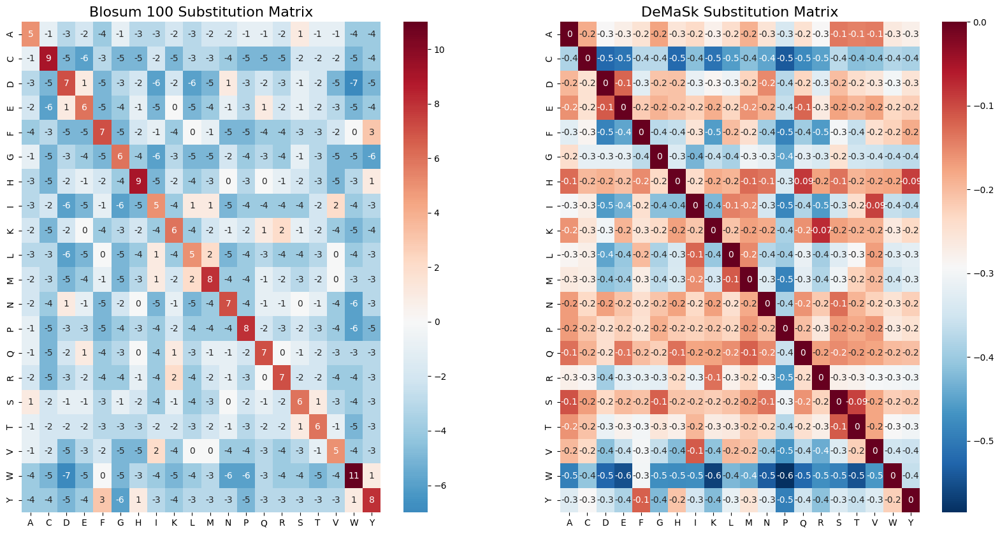

In [190]:
for (k1,k2),v in sub_mat_b100.items():
    if (k1!='Z')&(k2!='Z')&(k1!='B')&(k2!='B')&(k1!='X')&(k2!='X'):
        blosum100[ aa_map_2[k1], aa_map_2[k2] ] = v
for (k1,k2),v in sub_mat_demask.items():
    if (k1!='Z')&(k2!='Z')&(k1!='B')&(k2!='B')&(k1!='X')&(k2!='X'):
        demask[ aa_map_2[k1], aa_map_2[k2] ] = v
        
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
sns.heatmap(blosum100, cmap='RdBu_r', annot=True, center=0.0)
plt.xticks(np.arange(20)+0.5,AA)
plt.yticks(np.arange(20)+0.5,AA)
plt.title('Blosum 100 Substitution Matrix',size=16)
plt.subplot(1,2,2)
sns.heatmap(demask, cmap='RdBu_r', annot=True, fmt='.1g') #, center=0.0)
plt.xticks(np.arange(20)+0.5,AA)
plt.yticks(np.arange(20)+0.5,AA)
plt.title('DeMaSk Substitution Matrix',size=16)
plt.show()

In [191]:
token_map = {'L': 0, 'A': 1, 'G': 2, 'V': 3, 'S': 4, 'E': 5, 'R': 6, 'T': 7, 'I': 8, 'D': 9, 'P': 10, 
         'K': 11, 'Q': 12, 'N': 13, 'F': 14, 'Y': 15, 'M': 16, 'H': 17, 'W': 18, 'C': 19}
t_model, alphabet = esm.pretrained.esm2_t33_650M_UR50D()
batch_converter = alphabet.get_batch_converter()
t_model.eval()  # disables dropout for deterministic results
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
t_model.to(device)

ESM2(
  (embed_tokens): Embedding(33, 1280, padding_idx=1)
  (layers): ModuleList(
    (0-32): 33 x TransformerLayer(
      (self_attn): MultiheadAttention(
        (k_proj): Linear(in_features=1280, out_features=1280, bias=True)
        (v_proj): Linear(in_features=1280, out_features=1280, bias=True)
        (q_proj): Linear(in_features=1280, out_features=1280, bias=True)
        (out_proj): Linear(in_features=1280, out_features=1280, bias=True)
        (rot_emb): RotaryEmbedding()
      )
      (self_attn_layer_norm): LayerNorm((1280,), eps=1e-05, elementwise_affine=True)
      (fc1): Linear(in_features=1280, out_features=5120, bias=True)
      (fc2): Linear(in_features=5120, out_features=1280, bias=True)
      (final_layer_norm): LayerNorm((1280,), eps=1e-05, elementwise_affine=True)
    )
  )
  (contact_head): ContactPredictionHead(
    (regression): Linear(in_features=660, out_features=1, bias=True)
    (activation): Sigmoid()
  )
  (emb_layer_norm_after): LayerNorm((1280,), eps=1

In [192]:
# TRAIN WILDTYPES
all_train_pdb = [f for f in train_esm_df.PDB.unique()]
all_train_pdb_embed_pool = np.zeros((len(all_train_pdb), 1280))
all_train_pdb_embed_local = []
all_train_pdb_embed_tmp = []
all_train_pdb_prob = []

# Create a list to store ESM embeddings data
ESM_train_embeddings_data = []

# EXTRACT TRANSFORMER EMBEDDINGS FOR TRAIN WILDTYPES
print('Extracting embeddings from proteins...')
for i, p in enumerate(all_train_pdb):
    # WILDTYPE SEQUENCE
    # print('PDB:', p)
    seq = train_esm_df.loc[train_esm_df.PDB == p, 'sequence'].iloc[0]
    
    # EXTRACT EMBEDDINGS, MUTATION PROBABILITIES, ENTROPY
    data = [("protein", seq)]
    batch_labels, batch_strs, batch_tokens = batch_converter(data)
    
    batch_tokens = batch_tokens.to(device)
    with torch.no_grad():
        results = t_model(batch_tokens, repr_layers=[33])
    
    # print('Final logits shape:', logits.shape)
        
    logits = (results['logits'].detach().cpu().numpy()[0,].T)[4:24, 1:-1]
    all_train_pdb_prob.append(softmax(logits, axis=0))
    
    results = results["representations"][33].detach().cpu().numpy()
    
    # SAVE EMBEDDINGS
    all_train_pdb_embed_local.append(results)
    all_train_pdb_embed_pool[i, :] = np.mean(results[0, :, :], axis=0)
    
    # SAVE ESM EMBEDDINGS FOR ALL POSITIONS
    positions_data = train_esm_df.loc[train_esm_df.PDB == p, ['position', 'mutation', 'wildtype', 'ddG']]
    
    for _, row in positions_data.iterrows():
        j = row['position']
        mut = row['mutation']
        wt = row['wildtype']
        ddG = row['ddG']
        # unique_identifier = row['ID']
        
        if pd.isna(j):
            continue  # Skip rows with NaN positions
        
        j = int(j)  # Convert position to integer
        
        ESM_train_embedding = results[0, j, :]
        all_train_pdb_embed_tmp.append(ESM_train_embedding)
        
        # Store the ESM embedding data
        ESM_train_embeddings_data.append([p, j, mut, wt, ddG, ESM_train_embedding])
    
    del batch_tokens, results
    gc.collect()
    torch.cuda.empty_cache()

all_train_pdb_embed_tmp = np.stack(all_train_pdb_embed_tmp)
print('Stacked ESM embeddings shape:', all_train_pdb_embed_tmp.shape)
print('Pooled embeddings shape:', all_train_pdb_embed_pool.shape)

# Create a DataFrame from the ESM embeddings data
ESM_train_embeddings_df = pd.DataFrame(ESM_train_embeddings_data, columns=['pdb_id', 'position', 'mutation', 'wildtype','ddG', 'ESM_embedding'])

Extracting embeddings from proteins...
Stacked ESM embeddings shape: (2645, 1280)
Pooled embeddings shape: (54, 1280)


In [193]:
# VAL WILDTYPES
all_val_pdb = [f for f in val_esm_df.PDB.unique()]
all_val_pdb_embed_pool = np.zeros((len(all_val_pdb), 1280))
all_val_pdb_embed_local = []
all_val_pdb_embed_tmp = []
all_val_pdb_prob = []

# Create a list to store ESM embeddings data
ESM_val_embeddings_data = []

# EXTRACT TRANSFORMER EMBEDDINGS FOR VAL WILDTYPES
print('Extracting embeddings from proteins...')
for i, p in enumerate(all_val_pdb):
    # WILDTYPE SEQUENCE
    # print('PDB:', p)
    seq = val_esm_df.loc[val_esm_df.PDB == p, 'sequence'].iloc[0]
    
    # EXTRACT EMBEDDINGS, MUTATION PROBABILITIES, ENTROPY
    data = [("protein", seq)]
    batch_labels, batch_strs, batch_tokens = batch_converter(data)
    
    batch_tokens = batch_tokens.to(device)
    with torch.no_grad():
        results = t_model(batch_tokens, repr_layers=[33])
    
    # print('Final logits shape:', logits.shape)
        
    logits = (results['logits'].detach().cpu().numpy()[0,].T)[4:24, 1:-1]
    all_val_pdb_prob.append(softmax(logits, axis=0))
    
    results = results["representations"][33].detach().cpu().numpy()
    
    # SAVE EMBEDDINGS
    all_val_pdb_embed_local.append(results)
    all_val_pdb_embed_pool[i, :] = np.mean(results[0, :, :], axis=0)
    
    # SAVE ESM EMBEDDINGS FOR ALL POSITIONS
    positions_data = val_esm_df.loc[val_esm_df.PDB == p, ['position', 'mutation', 'wildtype', 'ddG']]
    
    for _, row in positions_data.iterrows():
        j = row['position']
        mut = row['mutation']
        wt = row['wildtype']
        ddG = row['ddG']
        # unique_identifier = row['ID']
        
        if pd.isna(j):
            continue  # Skip rows with NaN positions
        
        j = int(j)  # Convert position to integer
        
        ESM_val_embedding = results[0, j, :]
        all_val_pdb_embed_tmp.append(ESM_val_embedding)
        
        # Store the ESM embedding data
        ESM_val_embeddings_data.append([p, j, mut, wt, ddG, ESM_val_embedding])
    
    del batch_tokens, results
    gc.collect()
    torch.cuda.empty_cache()

all_val_pdb_embed_tmp = np.stack(all_val_pdb_embed_tmp)
print('Stacked ESM embeddings shape:', all_val_pdb_embed_tmp.shape)
print('Pooled embeddings shape:', all_val_pdb_embed_pool.shape)

# Create a DataFrame from the ESM embeddings data
ESM_val_embeddings_df = pd.DataFrame(ESM_val_embeddings_data, columns=['pdb_id', 'position', 'mutation', 'wildtype','ddG', 'ESM_embedding'])

Extracting embeddings from proteins...
Stacked ESM embeddings shape: (398, 1280)
Pooled embeddings shape: (15, 1280)


In [194]:
# Create embeddings_model2 folder if it doesn't exist
os.makedirs('embeddings_model2', exist_ok=True)

# Create embeddings_model3 folder if it doesn't exist
os.makedirs('embeddings_model3', exist_ok=True)

# Save to embeddings_model2 folder
ESM_train_embeddings_df.to_pickle('embeddings_model2/ESM_train_embeddings.pkl')
ESM_val_embeddings_df.to_pickle('embeddings_model2/ESM_val_embeddings.pkl')

# Save to embeddings_model3 folder
ESM_train_embeddings_df.to_pickle('embeddings_model3/ESM_train_embeddings.pkl')
ESM_val_embeddings_df.to_pickle('embeddings_model3/ESM_val_embeddings.pkl')

# Model Pre-Training Specifications

In [213]:
HIDDEN_DIM = 128
EMBED_DIM = 128
VOCAB_DIM = 21
ALPHABET = 'ACDEFGHIKLMNPQRSTVWYX'

MLP = True
SUBTRACT_MUT = True

In [214]:
def get_metrics():
    return {
        "r2": R2Score(),
        "mse": MeanSquaredError(squared=True),
        "rmse": MeanSquaredError(squared=False),
        "spearman": SpearmanCorrCoef(),
    }

In [215]:
def get_protein_mpnn(cfg, version='v_48_020.pt'):
    """Loading Pre-trained ProteinMPNN model for structure embeddings"""
    hidden_dim = 128
    num_layers = 3 

    model_weight_dir = os.path.join(cfg.platform.thermompnn_dir, 'vanilla_model_weights')
    checkpoint_path = os.path.join(model_weight_dir, version)
    # checkpoint_path = "vanilla_model_weights/v_48_020.pt"
    checkpoint = torch.load(checkpoint_path, map_location='cpu') 
    model = ProteinMPNN(ca_only=False, num_letters=21, node_features=hidden_dim, edge_features=hidden_dim, hidden_dim=hidden_dim, 
                        num_encoder_layers=num_layers, num_decoder_layers=num_layers, k_neighbors=checkpoint['num_edges'], augment_eps=0.0)
    if cfg.model.load_pretrained:
        model.load_state_dict(checkpoint['model_state_dict'])
    
    if cfg.model.freeze_weights:
        model.eval()
        # freeze these weights for transfer learning
        for param in model.parameters():
            param.requires_grad = False

    return model

In [216]:
class LightAttention(nn.Module):
    """Source:
    Hannes Stark et al. 2022
    https://github.com/HannesStark/protein-localization/blob/master/models/light_attention.py
    """
    def __init__(self, embeddings_dim=1024, output_dim=11, dropout=0.25, kernel_size=9, conv_dropout: float = 0.25):
        super(LightAttention, self).__init__()

        self.feature_convolution = nn.Conv1d(embeddings_dim, embeddings_dim, kernel_size, stride=1,
                                             padding=kernel_size // 2)
        self.attention_convolution = nn.Conv1d(embeddings_dim, embeddings_dim, kernel_size, stride=1,
                                               padding=kernel_size // 2)

        self.softmax = nn.Softmax(dim=-1)
        self.dropout = nn.Dropout(conv_dropout)

    def forward(self, x: torch.Tensor, mask, **kwargs) -> torch.Tensor:
        """
        Args:
            x: [batch_size, embeddings_dim, sequence_length] embedding tensor that should be classified
            mask: [batch_size, sequence_length] mask corresponding to the zero padding used for the shorter sequecnes in the batch. All values corresponding to padding are False and the rest is True.
        Returns: 
            classification: [batch_size,output_dim] tensor with logits
        """
        o = self.feature_convolution(x)  # [batch_size, embeddings_dim, sequence_length]
        
        o = self.dropout(o)  # [batch_size, embeddings_dim, sequence_length]

        attention = self.attention_convolution(x)  # [batch_size, embeddings_dim, sequence_length]
        
        o1 = o * self.softmax(attention)
        return torch.squeeze(o1)

# MODEL 1: Original ThermoMPNN Model with Duplicates Removed

In [130]:
class TransferModel(nn.Module):

    def __init__(self, cfg):
        super().__init__()
        self.cfg = cfg
        self.hidden_dims = list(cfg.model.hidden_dims)
        self.subtract_mut = cfg.model.subtract_mut
        self.num_final_layers = cfg.model.num_final_layers
        self.lightattn = cfg.model.lightattn if 'lightattn' in cfg.model else False

        if 'decoding_order' not in self.cfg:
            self.cfg.decoding_order = 'left-to-right'
        
        self.prot_mpnn = get_protein_mpnn(cfg)
        EMBED_DIM = 128
        HIDDEN_DIM = 128

        hid_sizes = [ HIDDEN_DIM*self.num_final_layers + EMBED_DIM ]
        hid_sizes += self.hidden_dims
        hid_sizes += [ VOCAB_DIM ]

        if self.lightattn:
            # print('Enabled LightAttention')
            self.light_attention = LightAttention(embeddings_dim=HIDDEN_DIM*self.num_final_layers + EMBED_DIM )

        self.both_out = nn.Sequential()

        for sz1, sz2 in zip(hid_sizes, hid_sizes[1:]):
            self.both_out.append(nn.ReLU())
            self.both_out.append(nn.Linear(sz1, sz2))

        self.ddg_out = nn.Linear(1, 1)

        self.train_lin_input_data = []
        self.val_lin_input_data = []

    def forward(self, pdb, mutations, tied_feat=True):
        device = next(self.parameters()).device

        X, S, mask, lengths, chain_M, chain_encoding_all, chain_list_list, visible_list_list, masked_list_list, masked_chain_length_list_list, chain_M_pos, omit_AA_mask, residue_idx, dihedral_mask, tied_pos_list_of_lists_list, pssm_coef, pssm_bias, pssm_log_odds_all, bias_by_res_all, tied_beta = tied_featurize([pdb[0]], device, None, None, None, None, None, None, ca_only=False)

        all_mpnn_hid, mpnn_embed, _ = self.prot_mpnn(X, S, mask, chain_M, residue_idx, chain_encoding_all, None)

        if self.num_final_layers > 0:
            mpnn_hid = torch.cat(all_mpnn_hid[:self.num_final_layers], -1)

        out = []
        embeddings = []
        
        for mut in mutations:
            inputs = []
            if mut is None:
                out.append(None)
                continue

            aa_index = ALPHABET.index(mut.mutation)
            wt_aa_index = ALPHABET.index(mut.wildtype)

            if self.num_final_layers > 0:
                hid = mpnn_hid[0][mut.position]  # MPNN hidden embeddings at mut position
                inputs.append(hid)
                
            embed = mpnn_embed[0][mut.position]  # MPNN seq embeddings at mut position
            inputs.append(embed)
            
            # concatenating hidden layers and embeddings
            lin_input = torch.cat(inputs, -1)
            pdb_id = mut.pdb
            position = mut.position
            wildtype_aa = mut.wildtype
            mutation_aa = mut.mutation
            ddg = mut.ddG.item()
            lin_input_embedding = lin_input.detach().cpu().numpy()

            prefix = 'train' if self.training else 'val'

            if prefix == 'train':
                self.train_lin_input_data.append([pdb_id, position, wildtype_aa, mutation_aa, ddg, lin_input_embedding])
            else:
                self.val_lin_input_data.append([pdb_id, position, wildtype_aa, mutation_aa, ddg, lin_input_embedding])

            # passing vector through lightattn
            if self.lightattn:
                lin_input = torch.unsqueeze(torch.unsqueeze(lin_input, -1), 0)
                lin_input = self.light_attention(lin_input, mask)
                embeddings.append(lin_input)

            both_input = torch.unsqueeze(self.both_out(lin_input), -1)

            ddg_out = self.ddg_out(both_input)

            if self.subtract_mut:
                ddg = ddg_out[aa_index][0] - ddg_out[wt_aa_index][0]
            else:
                ddg = ddg_out[aa_index][0]
            
            out.append({
                "ddG": torch.unsqueeze(ddg, 0),
            })

        return out, embeddings
    
    def on_epoch_end(self, prefix):
        try:
            if prefix == 'train':
                lin_input_data = self.train_lin_input_data
                # combined_embeddings_data = self.train_combined_embeddings_data
            elif prefix == 'val':
                lin_input_data = self.val_lin_input_data
                # combined_embeddings_data = self.val_combined_embeddings_data
            else:
                raise ValueError(f"Invalid prefix: {prefix}")
            
            embeddings_folder = 'embeddings_model1'
            
            # Create the embeddings folder if it doesn't exist
            os.makedirs(embeddings_folder, exist_ok=True)
            
            lin_input_df = pd.DataFrame(lin_input_data, columns=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG', 'lin_input_embedding'])
            lin_input_df.to_pickle(f'{embeddings_folder}/{prefix}_lin_input_embeddings.pkl')
            lin_input_data.clear()
            
        except Exception as e:
            print(f"Failed to save {prefix}_lin_input_embeddings.pkl: {e}")

In [131]:
class TransferModelPL(pl.LightningModule):
    """Class managing training loop with pytorch lightning"""
    def __init__(self, cfg):
        super().__init__()
        self.model = TransferModel(cfg)
        self.train_embeddings_data = []
        self.val_embeddings_data = []

        self.learn_rate = cfg.training.learn_rate
        self.mpnn_learn_rate = cfg.training.mpnn_learn_rate if 'mpnn_learn_rate' in cfg.training else None
        self.lr_schedule = cfg.training.lr_schedule if 'lr_schedule' in cfg.training else False

        # set up metrics dictionary
        self.metrics = nn.ModuleDict()
        for split in ("train_metrics", "val_metrics"):
            self.metrics[split] = nn.ModuleDict()
            out = "ddG"
            self.metrics[split][out] = nn.ModuleDict()
            for name, metric in get_metrics().items():
                self.metrics[split][out][name] = metric

    def forward(self, *args):
        return self.model(*args)

    def shared_eval(self, batch, batch_idx, prefix):
        assert len(batch) == 1

        mut_pdb, mutations = batch[0]
        
        pred, embeddings = self(mut_pdb, mutations)

        embeddings_data = []
        for mut, embedding in zip(mutations, embeddings):
            pdb_id = mut.pdb
            position = mut.position
            wildtype_aa = mut.wildtype
            mutation_aa = mut.mutation
            ddg = mut.ddG.item()
            thermompnn_embedding = embedding.detach().cpu().numpy()
            
            embeddings_data.append([pdb_id, position, wildtype_aa, mutation_aa, ddg, thermompnn_embedding])
        
        if prefix == 'train':
            self.train_embeddings_data.extend(embeddings_data)
        elif prefix == 'val':
            self.val_embeddings_data.extend(embeddings_data)

        ddg_mses = []
        for mut, out in zip(mutations, pred):
            if mut.ddG is not None:
                ddg_mses.append(F.mse_loss(out["ddG"], mut.ddG))
                for metric in self.metrics[f"{prefix}_metrics"]["ddG"].values():
                    metric.update(out["ddG"], mut.ddG)

        loss = 0.0 if len(ddg_mses) == 0 else torch.stack(ddg_mses).mean()
        on_step = False
        on_epoch = not on_step

        output = "ddG"
        for name, metric in self.metrics[f"{prefix}_metrics"][output].items():
            try:
                metric_value = metric.compute()
            except ValueError:
                continue
            self.log(f"{prefix}_{output}_{name}", metric, prog_bar=True, on_step=on_step, on_epoch=on_epoch,
                        batch_size=len(batch))
        if loss == 0.0:
            return None
        return loss

    def training_step(self, batch, batch_idx):
        return self.shared_eval(batch, batch_idx, 'train')

    def validation_step(self, batch, batch_idx):
        return self.shared_eval(batch, batch_idx, 'val')

    def test_step(self, batch, batch_idx):
        return self.shared_eval(batch, batch_idx, 'test')

    def configure_optimizers(self):
        
        if self.stage == 2: # for second stage, drop LR by factor of 10
            self.learn_rate /= 10.

        if not cfg.model.freeze_weights: # fully unfrozen ProteinMPNN
            param_list = [{"params": self.model.prot_mpnn.parameters(), "lr": self.mpnn_learn_rate}]
        else: # fully frozen MPNN
            param_list = []

        if self.model.lightattn:  # adding light attention parameters
            if self.stage == 2:
                param_list.append({"params": self.model.light_attention.parameters(), "lr": 0.})
            else:
                param_list.append({"params": self.model.light_attention.parameters()})


        mlp_params = [
            {"params": self.model.both_out.parameters()},
            {"params": self.model.ddg_out.parameters()}
            ]

        param_list = param_list + mlp_params
        opt = torch.optim.AdamW(param_list, lr=self.learn_rate)

        if self.lr_schedule: # enable additional lr scheduler conditioned on val ddG mse
            lr_sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, verbose=True, mode='min', factor=0.5)
            return {
                'optimizer': opt,
                'lr_scheduler': lr_sched,
                'monitor': 'val_ddG_mse'
            }
        else:
            return opt

    def on_train_epoch_end(self):
        current_epoch = self.current_epoch  # Get the current epoch
        embeddings_folder = 'embeddings_model1'
        
        # Create the embeddings folder if it doesn't exist
        os.makedirs(embeddings_folder, exist_ok=True)
        
        train_embeddings_df = pd.DataFrame(self.train_embeddings_data, columns=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG', 'thermompnn_embedding'])
        train_embeddings_df.to_pickle(f'{embeddings_folder}/train_embeddings_epoch_{current_epoch}.pkl')  # Save with epoch number in the filename
        self.train_embeddings_data.clear()
        self.model.on_epoch_end(prefix='train')

    def on_validation_epoch_end(self):
        current_epoch = self.current_epoch  # Get the current epoch
        embeddings_folder = 'embeddings_model1'
        
        # Create the embeddings folder if it doesn't exist
        os.makedirs(embeddings_folder, exist_ok=True)
        
        val_embeddings_df = pd.DataFrame(self.val_embeddings_data, columns=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG', 'thermompnn_embedding'])
        val_embeddings_df.to_pickle(f'{embeddings_folder}/val_embeddings_epoch_{current_epoch}.pkl')  # Save with epoch number in the filename
        self.val_embeddings_data.clear()
        self.model.on_epoch_end(prefix='val')

In [132]:
# model_pl = TransferModelPL(cfg)
# print(model_pl)

In [133]:
def train(cfg, train_loader, val_loader):
    if 'project' in cfg:
        wandb.init(project=cfg.project, name=cfg.name)
    else:
        cfg.name = 'test'

    model_pl = TransferModelPL(cfg)
    model_pl.stage = 1

    filename = cfg.name + '_{epoch:02d}_{val_ddG_spearman:.02}'
    monitor = 'val_ddG_spearman'
    checkpoint_callback = ModelCheckpoint(monitor=monitor, mode='max', dirpath='checkpoints', filename=filename)

    logger = WandbLogger(project=cfg.project, name="test", log_model="all") if 'project' in cfg else None

    max_ep = cfg.training.epochs if 'epochs' in cfg.training else 100
    trainer = pl.Trainer(callbacks=[checkpoint_callback], logger=logger, log_every_n_steps=10, max_epochs=max_ep, accelerator=cfg.platform.accel, devices=1)
    trainer.fit(model_pl, train_loader, val_loader)

    # Retrieve the best checkpoint path
    best_checkpoint_path = checkpoint_callback.best_model_path
    print(f"Best checkpoint path: {best_checkpoint_path}")
    
    # Extract the epoch number from the best checkpoint path
    # epoch_number = int(best_checkpoint_path.split('epoch=')[1].split('_')[0])

    if 'two_stage' in cfg.training:
        # sequential combo training
        if cfg.training.two_stage:
            print('Two-stage Training Enabled')
            del trainer, train_dataset, val_dataset, train_loader, val_loader

            # load new datasets for further training
            train_dataset = FireProtDataset(cfg, "train")
            val_dataset = MegaScaleDataset(cfg, "val")
            train_loader, val_loader = create_data_loaders(cfg, train_dataset, val_dataset)

            model_pl.stage = 2

            # re-start training with a new trainer
            trainer = pl.Trainer(callbacks=[checkpoint_callback], logger=logger, log_every_n_steps=10, max_epochs=max_ep * 2, accelerator=cfg.platform.accel, devices=1)
            trainer.fit(model_pl, train_loader, val_loader, ckpt_path=checkpoint_callback.best_model_path)

    return best_checkpoint_path

In [134]:
best_checkpoint_path = train(cfg, train_loader, val_loader)

epoch,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
train_ddG_mse,█▆▅▄▄▄▃▃▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
train_ddG_r2,▁▃▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇▇███████████████
train_ddG_rmse,█▇▅▅▄▄▄▄▃▃▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁
train_ddG_spearman,▁▃▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇██▇████████████████
trainer/global_step,▁▁▁▁▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
val_ddG_mse,█▆▅▄▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_ddG_r2,▁▃▄▅▆▇▇▇▇▇▇▇▇▇▇▇▇▇█▇████████████████████
val_ddG_rmse,█▆▅▄▃▂▃▂▂▂▂▂▂▂▂▂▂▂▁▂▁▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
val_ddG_spearman,▁▃▄▄▄▅▅▅▆▆▇▆▆▇▆▇▆▇▇▇▇▇▇▇███▇████████████
epoch,99


c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\torchmetrics\utilities\prints.py:43: UserWarning: Metric `SpearmanCorrcoef` will save all targets and predictions in the buffer. For large datasets, this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\pytorch_lightning\loggers\wandb.py:389: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:639: Checkpoint directory C:\Users\karishma\OneDrive\Desktop\AI\GTech\DVA\Project\AlgoRxplorers\ThermoMPNN\checkpoints exists and is not empty.
LOCA

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 13.63it/s]

c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 99: 100%|██████████| 54/54 [00:17<00:00,  3.12it/s, v_num=rtzg, val_ddG_r2=0.162, val_ddG_mse=2.140, val_ddG_rmse=1.460, val_ddG_spearman=0.534, train_ddG_r2=0.723, train_ddG_mse=0.868, train_ddG_rmse=0.932, train_ddG_spearman=0.832]  

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 99: 100%|██████████| 54/54 [00:17<00:00,  3.09it/s, v_num=rtzg, val_ddG_r2=0.162, val_ddG_mse=2.140, val_ddG_rmse=1.460, val_ddG_spearman=0.534, train_ddG_r2=0.723, train_ddG_mse=0.868, train_ddG_rmse=0.932, train_ddG_spearman=0.832]
Best checkpoint path: C:\Users\karishma\OneDrive\Desktop\AI\GTech\DVA\Project\AlgoRxplorers\ThermoMPNN\checkpoints\example_training_epoch=49_val_ddG_spearman=0.54.ckpt


In [135]:
# Load the best checkpoint
best_model = TransferModelPL.load_from_checkpoint(best_checkpoint_path, cfg=cfg)

# Extract the epoch number from the best checkpoint path
epoch_number = int(best_checkpoint_path.split('epoch=')[1].split('_')[0])
print(f"Best checkpoint epoch: {epoch_number}")

Best checkpoint epoch: 49


In [136]:
best_model.eval()

# Create a new Trainer for evaluation
eval_trainer = pl.Trainer(devices=1, accelerator=cfg.platform.accel)

# Evaluate the model on the validation dataset
val_results = eval_trainer.validate(best_model, val_loader)

# Print the validation results
print("Best model validation results:")
for metric, value in val_results[0].items():
    print(f"{metric}: {value:.4f}")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation DataLoader 0:   0%|          | 0/15 [00:00<?, ?it/s]

Validation DataLoader 0: 100%|██████████| 15/15 [00:01<00:00,  9.62it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       val_ddG_mse           2.128974437713623
       val_ddG_r2           0.16812241077423096
      val_ddG_rmse           1.459100604057312
    val_ddG_spearman        0.5423222780227661
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Best model validation results:
val_ddG_r2: 0.1681
val_ddG_mse: 2.1290
val_ddG_rmse: 1.4591
val_ddG_spearman: 0.5423


# MODEL 2: Latent Transfusion - Trained ThermoMPNN Embeddings + ESM Embeddings

In [149]:
epoch_number = 49

In [150]:
# Load the embeddings for the best-performing epoch
thermompnn_train_embeddings_df = pd.read_pickle(f'embeddings_model1/train_embeddings_epoch_{epoch_number}.pkl')
thermompnn_val_embeddings_df = pd.read_pickle(f'embeddings_model1/val_embeddings_epoch_{epoch_number}.pkl')
print("Train Embeddings Data Shape:", thermompnn_train_embeddings_df.shape)
print("Val Embeddings Data Shape:", thermompnn_val_embeddings_df.shape)

Train Embeddings Data Shape: (2645, 6)
Val Embeddings Data Shape: (398, 6)


In [151]:
ESM_train_embeddings_df = pd.read_pickle('embeddings_model2/ESM_train_embeddings.pkl')
ESM_val_embeddings_df = pd.read_pickle('embeddings_model2/ESM_val_embeddings.pkl')

In [152]:
# Merge train_embeddings_df and ESM_embeddings_df based on matching columns
merged_df_train = pd.merge(thermompnn_train_embeddings_df, ESM_train_embeddings_df, on=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG'], how='left')

# Concatenate the embeddings
merged_df_train['combined_embedding'] = merged_df_train.apply(lambda row: np.concatenate((row['thermompnn_embedding'], row['ESM_embedding'])), axis=1)

# Drop the individual embedding columns
merged_df_train = merged_df_train.drop(['thermompnn_embedding', 'ESM_embedding'], axis=1)

In [153]:
# Merge train_embeddings_df and ESM_embeddings_df based on matching columns
merged_df_val = pd.merge(thermompnn_val_embeddings_df, ESM_val_embeddings_df, on=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG'], how='left')

# Concatenate the embeddings
merged_df_val['combined_embedding'] = merged_df_val.apply(lambda row: np.concatenate((row['thermompnn_embedding'], row['ESM_embedding'])), axis=1)

# Drop the individual embedding columns
merged_df_val = merged_df_val.drop(['thermompnn_embedding', 'ESM_embedding'], axis=1)

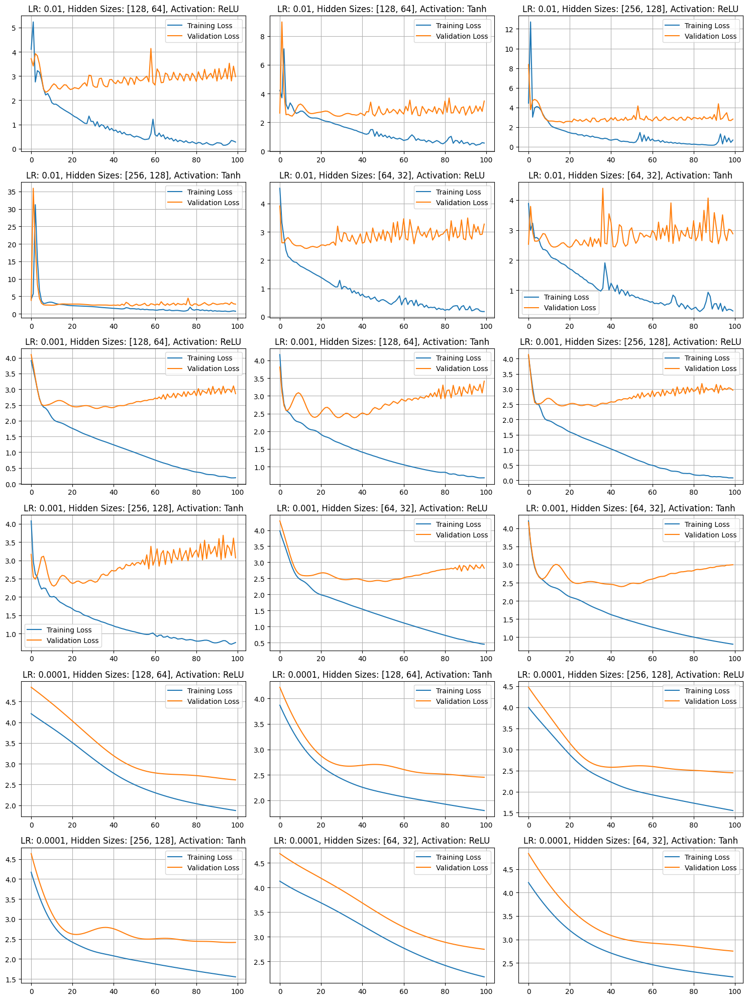

In [139]:
# Load data
X_train = np.stack(merged_df_train['combined_embedding'].values)
y_train = np.stack(merged_df_train['ddG'].values)
X_val = np.stack(merged_df_val['combined_embedding'].values)
y_val = np.stack(merged_df_val['ddG'].values)

# Convert the data to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
X_val = torch.tensor(X_val, dtype=torch.float32)
y_val = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)

# Define models
class MLPRegressor(nn.Module):
    def __init__(self, input_size, output_size, hidden_sizes, activation_fn):
        super(MLPRegressor, self).__init__()
        layers = []
        prev_size = input_size
        for hidden_size in hidden_sizes:
            layers.append(nn.Linear(prev_size, hidden_size))
            layers.append(activation_fn())
            prev_size = hidden_size
        layers.append(nn.Linear(prev_size, output_size))
        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        return self.layers(x)

# Define parameters for grid search
learning_rates = [0.01, 0.001, 0.0001]
hidden_sizes_list = [[128, 64], [256, 128], [64, 32]]
activation_functions = [nn.ReLU, nn.Tanh]
num_epochs = 100

# Grid Search
results = []
for lr in learning_rates:
    for hidden_sizes in hidden_sizes_list:
        for activation_fn in activation_functions:
            model = MLPRegressor(input_size=X_train.shape[1], output_size=1, hidden_sizes=hidden_sizes, activation_fn=activation_fn)
            criterion = nn.MSELoss()
            optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=0.01)
            
            train_losses, val_losses, val_r2_scores = [], [], []
            for epoch in range(num_epochs):
                model.train()
                optimizer.zero_grad()
                outputs = model(X_train)
                loss = criterion(outputs, y_train)
                loss.backward()
                optimizer.step()
                train_losses.append(loss.item())
                
                model.eval()
                with torch.no_grad():
                    val_outputs = model(X_val)
                    val_loss = criterion(val_outputs, y_val)
                    val_losses.append(val_loss.item())
                    val_r2 = r2_score(y_val.numpy(), val_outputs.numpy())
                    val_r2_scores.append(val_r2)
            
            results.append((lr, hidden_sizes, activation_fn.__name__, train_losses, val_losses, val_r2_scores))

# Plotting results
num_rows = len(learning_rates) * len(activation_functions)
num_cols = len(hidden_sizes_list)
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 20))

for idx, result in enumerate(results):
    lr, hidden_sizes, activation_fn, train_losses, val_losses, val_r2_scores = result
    row = idx // num_cols
    col = idx % num_cols
    ax = axs[row][col]
    ax.plot(range(num_epochs), train_losses, label='Training Loss')
    ax.plot(range(num_epochs), val_losses, label='Validation Loss')
    ax.set_title(f'LR: {lr}, Hidden Sizes: {hidden_sizes}, Activation: {activation_fn}')
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

Epoch 10/100, Training Loss: 2.9097, Validation Loss: 3.0953, Validation R^2: -0.2095, Validation Spearman: 0.2273
Epoch 20/100, Training Loss: 2.4210, Validation Loss: 2.5983, Validation R^2: -0.0153, Validation Spearman: 0.2728
Epoch 30/100, Training Loss: 2.1779, Validation Loss: 2.6814, Validation R^2: -0.0477, Validation Spearman: 0.3059
Epoch 40/100, Training Loss: 2.0524, Validation Loss: 2.6931, Validation R^2: -0.0523, Validation Spearman: 0.3363
Epoch 50/100, Training Loss: 1.9429, Validation Loss: 2.4861, Validation R^2: 0.0286, Validation Spearman: 0.3573
Epoch 60/100, Training Loss: 1.8433, Validation Loss: 2.4769, Validation R^2: 0.0322, Validation Spearman: 0.3678
Epoch 70/100, Training Loss: 1.7493, Validation Loss: 2.4459, Validation R^2: 0.0443, Validation Spearman: 0.3741
Epoch 80/100, Training Loss: 1.6609, Validation Loss: 2.4153, Validation R^2: 0.0562, Validation Spearman: 0.3827
Epoch 90/100, Training Loss: 1.5788, Validation Loss: 2.3892, Validation R^2: 0.0664

c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


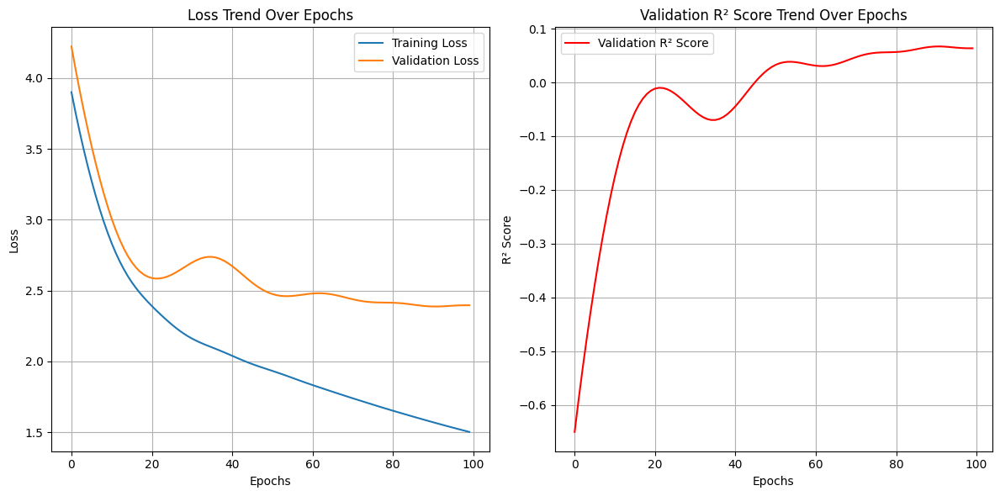

In [154]:
# Load data
X_train = np.stack(merged_df_train['combined_embedding'].values)
y_train = np.stack(merged_df_train['ddG'].values)
X_val = np.stack(merged_df_val['combined_embedding'].values)
y_val = np.stack(merged_df_val['ddG'].values)

# Convert the data to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
X_val = torch.tensor(X_val, dtype=torch.float32)
y_val = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)

class MLPRegressor(nn.Module):
    def __init__(self, input_size, output_size):
        super(MLPRegressor, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(input_size, 256),  # First hidden layer
            nn.Tanh(),
            nn.Linear(256, 128),  # Second hidden layer
            nn.Tanh(),
            nn.Linear(128, output_size)
        )
    
    def forward(self, x):
        embeddings = self.layer[:-1](x)  # Extract embeddings before the output layer
        output = self.layer[-1](embeddings)  # Pass embeddings through the output layer
        return output, embeddings.detach().numpy()

# Model Configuration
input_size = X_train.shape[1]
output_size = 1
learning_rate = 0.0001
num_epochs = 100

# Create an instance of the MLP model
model = MLPRegressor(input_size, output_size)

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=0.01)  # Using weight decay as L2 regularization

# Lists to store loss, R^2, and Spearman correlation coefficient for visualization
train_losses = []
val_losses = []
val_r2_scores = []
val_spearman_scores = []
best_spearman_epoch = 0
best_spearman_score = float('-inf')
best_train_embeddings = None
best_val_embeddings = None

# Training loop
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs, train_embeddings = model(X_train)
    loss = criterion(outputs, y_train)
    loss.backward()
    optimizer.step()
    train_losses.append(loss.item())
    
    # Validate the model
    model.eval()
    
    with torch.no_grad():
        preds, val_embeddings = model(X_val)
        val_loss = criterion(preds, y_val).item()
        val_r2 = r2_score(y_val.numpy(), preds.numpy())
        val_spearman = spearmanr(y_val.numpy().flatten(), preds.numpy().flatten())[0]
        val_losses.append(val_loss)
        val_r2_scores.append(val_r2)
        val_spearman_scores.append(val_spearman)
        
        # Update the best Spearman correlation coefficient, corresponding epoch, and best embeddings
        if val_spearman > best_spearman_score:
            best_spearman_score = val_spearman
            best_spearman_epoch = epoch + 1
            best_train_embeddings = train_embeddings
            best_val_embeddings = val_embeddings
    
    # Print progress
    if (epoch + 1) % 10 == 0:
        print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {loss.item():.4f}, Validation Loss: {val_loss:.4f}, Validation R^2: {val_r2:.4f}, Validation Spearman: {val_spearman:.4f}")

# Create train DataFrame with specified columns and best embeddings
train_data = pd.DataFrame({
    'pdb_id': merged_df_train['pdb_id'],
    'position': merged_df_train['position'],
    'wildtype': merged_df_train['wildtype'],
    'mutation': merged_df_train['mutation'],
    'ddG': merged_df_train['ddG']
}, index=merged_df_train.index)
train_data['trained_embedding'] = pd.Series([embedding.astype('float32') for embedding in best_train_embeddings], index=merged_df_train.index)

# Create validation DataFrame with specified columns and best embeddings
val_data = pd.DataFrame({
    'pdb_id': merged_df_val['pdb_id'],
    'position': merged_df_val['position'],
    'wildtype': merged_df_val['wildtype'],
    'mutation': merged_df_val['mutation'],
    'ddG': merged_df_val['ddG']
}, index=merged_df_val.index)
val_data['trained_embedding'] = pd.Series([embedding.astype('float32') for embedding in best_val_embeddings], index=merged_df_val.index)

embeddings_dir = "embeddings_model2"
if not os.path.exists(embeddings_dir):
    os.makedirs(embeddings_dir)

# Save train DataFrame with embeddings
train_data.to_pickle(os.path.join(embeddings_dir, 'train_data_model2.pkl'))

# Save validation DataFrame with embeddings
val_data.to_pickle(os.path.join(embeddings_dir, 'val_data_model2.pkl'))

# Calculate validation RMSE and MSE for the epoch with the highest Spearman correlation coefficient
best_preds = model(X_val)[0].detach()
best_val_rmse = mean_squared_error(y_val.numpy(), best_preds.numpy(), squared=False)
best_val_mse = mean_squared_error(y_val.numpy(), best_preds.numpy())
best_val_r2 = r2_score(y_val.numpy(), best_preds.numpy())

print(f"Epoch with the highest Spearman correlation coefficient: {best_spearman_epoch}")
print(f"Highest Spearman correlation coefficient: {best_spearman_score:.4f}")
print(f"Validation R^2 (Highest Spearman Epoch): {best_val_r2:.4f}")
print(f"Validation RMSE (Highest Spearman Epoch): {best_val_rmse:.4f}")
print(f"Validation MSE (Highest Spearman Epoch): {best_val_mse:.4f}")

# Plotting the training and validation loss, R^2 Score, and Spearman correlation coefficient
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Trend Over Epochs')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(val_r2_scores, label='Validation R² Score', color='red')
plt.xlabel('Epochs')
plt.ylabel('R² Score')
plt.title('Validation R² Score Trend Over Epochs')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [38]:
# def truncate_and_average_embeddings(row):
#     thermompnn_embedding = row['thermompnn_embedding']
#     esm_embedding = row['ESM_embedding']
    
#     # Truncate the ESM embedding to match the size of the ThermoMPNN embedding
#     truncated_esm_embedding = esm_embedding[:len(thermompnn_embedding)]
    
#     # Calculate the average of the embeddings
#     averaged_embedding = (thermompnn_embedding + truncated_esm_embedding) / 2
    
#     return averaged_embedding

In [39]:
# # Merge train_embeddings_df and ESM_embeddings_df based on matching columns
# merged_df_train = pd.merge(thermompnn_train_embeddings_df, ESM_train_embeddings_df, on=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG'], how='left')

# # Concatenate the embeddings
# merged_df_train['combined_embedding'] = merged_df_train.apply(truncate_and_average_embeddings, axis=1)

# # Drop the individual embedding columns
# merged_df_train = merged_df_train.drop(['thermompnn_embedding', 'ESM_embedding'], axis=1)

In [40]:
# print("Size of the first embedding in thermompnn_train_embeddings_df:")
# print(thermompnn_train_embeddings_df.iloc[0]['thermompnn_embedding'].shape)

# print("Size of the first embedding in ESM_train_embeddings_df:")
# print(ESM_train_embeddings_df.iloc[0]['ESM_embedding'].shape)

# print("Size of the first embedding in merged_df_train:")
# print(merged_df_train.iloc[0]['combined_embedding'].shape)

In [41]:
# len(merged_df_train)

In [42]:
# merged_df_train.head()

In [43]:
# # Merge train_embeddings_df and ESM_embeddings_df based on matching columns
# merged_df_val = pd.merge(thermompnn_val_embeddings_df, ESM_val_embeddings_df, on=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG'], how='left')

# # Concatenate the embeddings
# merged_df_val['combined_embedding'] = merged_df_val.apply(truncate_and_average_embeddings, axis=1)

# # Drop the individual embedding columns
# merged_df_val = merged_df_val.drop(['thermompnn_embedding', 'ESM_embedding'], axis=1)

In [44]:
# # Load data
# X_train = np.stack(merged_df_train['combined_embedding'].values)
# y_train = np.stack(merged_df_train['ddG'].values)
# X_val = np.stack(merged_df_val['combined_embedding'].values)
# y_val = np.stack(merged_df_val['ddG'].values)

# # Convert the data to PyTorch tensors
# X_train = torch.tensor(X_train, dtype=torch.float32)
# y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
# X_val = torch.tensor(X_val, dtype=torch.float32)
# y_val = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)

# # Define models
# class MLPRegressor(nn.Module):
#     def __init__(self, input_size, output_size, hidden_sizes, activation_fn):
#         super(MLPRegressor, self).__init__()
#         layers = []
#         prev_size = input_size
#         for hidden_size in hidden_sizes:
#             layers.append(nn.Linear(prev_size, hidden_size))
#             layers.append(activation_fn())
#             prev_size = hidden_size
#         layers.append(nn.Linear(prev_size, output_size))
#         self.layers = nn.Sequential(*layers)

#     def forward(self, x):
#         return self.layers(x)

# # Define parameters for grid search
# learning_rates = [0.01, 0.001, 0.0001]
# hidden_sizes_list = [[128, 64], [256, 128], [64, 32]]
# activation_functions = [nn.ReLU, nn.Tanh]
# num_epochs = 100

# # Grid Search
# results = []
# for lr in learning_rates:
#     for hidden_sizes in hidden_sizes_list:
#         for activation_fn in activation_functions:
#             model = MLPRegressor(input_size=X_train.shape[1], output_size=1, hidden_sizes=hidden_sizes, activation_fn=activation_fn)
#             criterion = nn.MSELoss()
#             optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=0.01)
            
#             train_losses, val_losses, val_r2_scores = [], [], []
#             for epoch in range(num_epochs):
#                 model.train()
#                 optimizer.zero_grad()
#                 outputs = model(X_train)
#                 loss = criterion(outputs, y_train)
#                 loss.backward()
#                 optimizer.step()
#                 train_losses.append(loss.item())
                
#                 model.eval()
#                 with torch.no_grad():
#                     val_outputs = model(X_val)
#                     val_loss = criterion(val_outputs, y_val)
#                     val_losses.append(val_loss.item())
#                     val_r2 = r2_score(y_val.numpy(), val_outputs.numpy())
#                     val_r2_scores.append(val_r2)
            
#             results.append((lr, hidden_sizes, activation_fn.__name__, train_losses, val_losses, val_r2_scores))

# # Plotting results
# num_rows = len(learning_rates) * len(activation_functions)
# num_cols = len(hidden_sizes_list)
# fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 20))

# for idx, result in enumerate(results):
#     lr, hidden_sizes, activation_fn, train_losses, val_losses, val_r2_scores = result
#     row = idx // num_cols
#     col = idx % num_cols
#     ax = axs[row][col]
#     ax.plot(range(num_epochs), train_losses, label='Training Loss')
#     ax.plot(range(num_epochs), val_losses, label='Validation Loss')
#     ax.set_title(f'LR: {lr}, Hidden Sizes: {hidden_sizes}, Activation: {activation_fn}')
#     ax.legend()
#     ax.grid(True)

# plt.tight_layout()
# plt.show()

In [45]:
# # Load data
# X_train = np.stack(merged_df_train['combined_embedding'].values)
# y_train = np.stack(merged_df_train['ddG'].values)
# X_val = np.stack(merged_df_val['combined_embedding'].values)
# y_val = np.stack(merged_df_val['ddG'].values)

# # Convert the data to PyTorch tensors
# X_train = torch.tensor(X_train, dtype=torch.float32)
# y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
# X_val = torch.tensor(X_val, dtype=torch.float32)
# y_val = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)

# class MLPRegressor(nn.Module):
#     def __init__(self, input_size, output_size):
#         super(MLPRegressor, self).__init__()
#         self.layer = nn.Sequential(
#             nn.Linear(input_size, 256),  # First hidden layer
#             nn.Tanh(),
#             nn.Linear(256, 128),  # Second hidden layer
#             nn.Tanh(),
#             nn.Linear(128, output_size)
#         )
    
#     def forward(self, x):
#         return self.layer(x)

# # Model Configuration
# input_size = X_train.shape[1]
# output_size = 1
# learning_rate = 0.0001
# num_epochs = 100

# # Create an instance of the MLP model
# model = MLPRegressor(input_size, output_size)

# # Define the loss function and optimizer
# criterion = nn.MSELoss()
# optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=0.01)  # Using weight decay as L2 regularization

# # Lists to store loss, R^2, and Spearman correlation coefficient for visualization
# train_losses = []
# val_losses = []
# val_r2_scores = []
# val_spearman_scores = []
# best_spearman_epoch = 0
# best_spearman_score = float('-inf')

# # Training loop
# for epoch in range(num_epochs):
#     model.train()
#     optimizer.zero_grad()
#     outputs = model(X_train)
#     loss = criterion(outputs, y_train)
#     loss.backward()
#     optimizer.step()
#     train_losses.append(loss.item())
    
#     # Validate the model
#     model.eval()
#     with torch.no_grad():
#         preds = model(X_val)
#         val_loss = criterion(preds, y_val).item()
#         val_r2 = r2_score(y_val.numpy(), preds.numpy())
#         val_spearman = spearmanr(y_val.numpy().flatten(), preds.numpy().flatten())[0]
#         val_losses.append(val_loss)
#         val_r2_scores.append(val_r2)
#         val_spearman_scores.append(val_spearman)
        
#         # Update the best Spearman correlation coefficient and corresponding epoch
#         if val_spearman > best_spearman_score:
#             best_spearman_score = val_spearman
#             best_spearman_epoch = epoch + 1
    
#     # Print progress
#     if (epoch + 1) % 10 == 0:
#         print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {loss.item():.4f}, Validation Loss: {val_loss:.4f}, Validation R^2: {val_r2:.4f}, Validation Spearman: {val_spearman:.4f}")

# # Calculate validation RMSE and MSE for the epoch with the highest Spearman correlation coefficient
# best_preds = model(X_val).detach()
# best_val_rmse = mean_squared_error(y_val.numpy(), best_preds.numpy(), squared=False)
# best_val_mse = mean_squared_error(y_val.numpy(), best_preds.numpy())
# best_val_r2 = r2_score(y_val.numpy(), best_preds.numpy())

# print(f"Epoch with the highest Spearman correlation coefficient: {best_spearman_epoch}")
# print(f"Highest Spearman correlation coefficient: {best_spearman_score:.4f}")
# print(f"Validation R^2 (Highest Spearman Epoch): {best_val_r2:.4f}")
# print(f"Validation RMSE (Highest Spearman Epoch): {best_val_rmse:.4f}")
# print(f"Validation MSE (Highest Spearman Epoch): {best_val_mse:.4f}")

# # Plotting the training and validation loss, R^2 Score, and Spearman correlation coefficient
# plt.figure(figsize=(12, 6))
# plt.subplot(1, 2, 1)
# plt.plot(train_losses, label='Training Loss')
# plt.plot(val_losses, label='Validation Loss')
# plt.xlabel('Epochs')
# plt.ylabel('Loss')
# plt.title('Loss Trend Over Epochs')
# plt.legend()
# plt.grid(True)

# plt.subplot(1, 2, 2)
# plt.plot(val_r2_scores, label='Validation R² Score', color='red')
# plt.xlabel('Epochs')
# plt.ylabel('R² Score')
# plt.title('Validation R² Score Trend Over Epochs')
# plt.legend()
# plt.grid(True)

# plt.tight_layout()
# plt.show()

In [46]:
# def predict_ddg(model, embeddings_data):
#     pred_ddgs = []
#     true_ddgs = []
#     device = next(model.parameters()).device  # Get the device of the model
    
#     for _, row in embeddings_data.iterrows():
#         pdb_id = row['pdb_id']
#         position = row['position']
#         wildtype_aa = row['wildtype']
#         mutation_aa = row['mutation']
#         ddg = row['ddG']
#         combined_embedding = torch.tensor(row['combined_embedding'], dtype=torch.float32).unsqueeze(0).to(device)
        
#         # Pass the embedding through the remaining layers of the model
#         both_input = model.model.both_out(combined_embedding)
#         both_input = torch.unsqueeze(both_input, -1)
#         ddg_out = model.model.ddg_out(both_input)
#         ddg_out = ddg_out.squeeze()  # Remove extra dimensions
        
#         if model.model.subtract_mut:
#             pred_ddg = ddg_out[ALPHABET.index(mutation_aa)] - ddg_out[ALPHABET.index(wildtype_aa)]
#         else:
#             pred_ddg = ddg_out[ALPHABET.index(mutation_aa)]
        
#         pred_ddgs.append(pred_ddg.item())
#         true_ddgs.append(ddg)
    
#     return pred_ddgs, true_ddgs

# train_pred_ddgs, train_true_ddgs = predict_ddg(best_model, merged_df_train)
# val_pred_ddgs, val_true_ddgs = predict_ddg(best_model, merged_df_val)

In [47]:
# train_mse = mean_squared_error(train_true_ddgs, train_pred_ddgs)
# train_r2 = r2_score(train_true_ddgs, train_pred_ddgs)
# print(f"Train MSE: {train_mse:.4f}, Train R^2: {train_r2:.4f}")

# val_mse = mean_squared_error(val_true_ddgs, val_pred_ddgs)
# val_r2 = r2_score(val_true_ddgs, val_pred_ddgs)
# print(f"Validation MSE: {val_mse:.4f}, Validation R^2: {val_r2:.4f}")

In [48]:
# plt.figure(figsize=(8, 6))
# plt.scatter(train_true_ddgs, train_pred_ddgs, label='Train')
# plt.scatter(val_true_ddgs, val_pred_ddgs, label='Validation')
# plt.xlabel('True ddG')
# plt.ylabel('Predicted ddG')
# plt.legend()
# plt.show()

# MODEL 3: Latent Transfusion - Retraining ThermoMPNN Embeddings with ESM Embeddings

In [199]:
ESM_train_embeddings_df = pd.read_pickle('embeddings_model3/ESM_train_embeddings.pkl')
ESM_val_embeddings_df = pd.read_pickle('embeddings_model3/ESM_val_embeddings.pkl')

In [331]:
class TransferModel(nn.Module):

    def __init__(self, cfg):
        super().__init__()
        self.cfg = cfg
        self.hidden_dims = list(cfg.model.hidden_dims)
        self.subtract_mut = cfg.model.subtract_mut
        self.num_final_layers = cfg.model.num_final_layers
        self.lightattn = cfg.model.lightattn if 'lightattn' in cfg.model else False

        if 'decoding_order' not in self.cfg:
            self.cfg.decoding_order = 'left-to-right'
        
        self.prot_mpnn = get_protein_mpnn(cfg)
        EMBED_DIM = 128
        HIDDEN_DIM = 128

        hid_sizes = [ HIDDEN_DIM*self.num_final_layers + EMBED_DIM ]
        hid_sizes += self.hidden_dims
        hid_sizes += [ VOCAB_DIM ]

        if self.lightattn:
            self.light_attention = LightAttention(embeddings_dim=HIDDEN_DIM*self.num_final_layers + EMBED_DIM )

        self.both_out = nn.Sequential()

        for sz1, sz2 in zip(hid_sizes, hid_sizes[1:]):
            self.both_out.append(nn.ReLU())
            self.both_out.append(nn.Linear(sz1, sz2))

        self.ddg_out = nn.Linear(1, 1)
        self.train_lin_input_data = []
        self.val_lin_input_data = []
        self.train_combined_embeddings_data = []
        self.val_combined_embeddings_data = []

    def forward(self, pdb, mutations, tied_feat=True):  
        device = next(self.parameters()).device

        X, S, mask, lengths, chain_M, chain_encoding_all, chain_list_list, visible_list_list, masked_list_list, masked_chain_length_list_list, chain_M_pos, omit_AA_mask, residue_idx, dihedral_mask, tied_pos_list_of_lists_list, pssm_coef, pssm_bias, pssm_log_odds_all, bias_by_res_all, tied_beta = tied_featurize([pdb[0]], device, None, None, None, None, None, None, ca_only=False)

        all_mpnn_hid, mpnn_embed, _ = self.prot_mpnn(X, S, mask, chain_M, residue_idx, chain_encoding_all, None)

        if self.num_final_layers > 0:
            mpnn_hid = torch.cat(all_mpnn_hid[:self.num_final_layers], -1)

        out = []
        embeddings = []
        
        for mut in mutations:
            inputs = []
            if mut is None:
                out.append(None)
                continue

            aa_index = ALPHABET.index(mut.mutation)
            wt_aa_index = ALPHABET.index(mut.wildtype)

            if self.num_final_layers > 0:
                hid = mpnn_hid[0][mut.position]  # MPNN hidden embeddings at mut position
                inputs.append(hid)

            embed = mpnn_embed[0][mut.position]  # MPNN seq embeddings at mut position
            inputs.append(embed)

            lin_input = torch.cat(inputs, -1)
            pdb_id = mut.pdb
            position = mut.position
            wildtype_aa = mut.wildtype
            mutation_aa = mut.mutation
            ddg = mut.ddG.item()
            lin_input_embedding = lin_input.detach().cpu().numpy()

            prefix = 'train' if self.training else 'val'

            esm_embedding_row = (ESM_train_embeddings_df if prefix == 'train' else ESM_val_embeddings_df).loc[
                (ESM_train_embeddings_df['pdb_id'] == pdb_id) &
                (ESM_train_embeddings_df['position'] == position) &
                (ESM_train_embeddings_df['wildtype'] == wildtype_aa) &
                (ESM_train_embeddings_df['mutation'] == mutation_aa) &
                (ESM_train_embeddings_df['ddG'] == ddg)
            ]

            if prefix == 'train':
                self.train_lin_input_data.append([pdb_id, position, wildtype_aa, mutation_aa, ddg, lin_input_embedding])
            else:
                self.val_lin_input_data.append([pdb_id, position, wildtype_aa, mutation_aa, ddg, lin_input_embedding])

            if len(esm_embedding_row) > 0:
                esm_embedding = esm_embedding_row['ESM_embedding'].values[0]
                esm_embedding_resized = np.resize(esm_embedding, lin_input_embedding.shape)
                combined_embedding = lin_input_embedding * esm_embedding_resized
            else:
                combined_embedding = lin_input_embedding

            # Convert combined_embedding to tensor
            combined_embedding_tensor = torch.tensor(combined_embedding, dtype=torch.float32, device=lin_input.device)

            if prefix == 'train':
                self.train_combined_embeddings_data.append([pdb_id, position, wildtype_aa, mutation_aa, ddg, combined_embedding])
            else:
                self.val_combined_embeddings_data.append([pdb_id, position, wildtype_aa, mutation_aa, ddg, combined_embedding])

            if self.lightattn:
                combined_embedding_tensor = torch.unsqueeze(torch.unsqueeze(combined_embedding_tensor, -1), 0)
                combined_embedding_tensor = self.light_attention(combined_embedding_tensor, mask)
                embeddings.append(combined_embedding_tensor)

            both_input = torch.unsqueeze(self.both_out(lin_input), -1)

            ddg_out = self.ddg_out(both_input)

            if self.subtract_mut:
                ddg = ddg_out[aa_index][0] - ddg_out[wt_aa_index][0]
            else:
                ddg = ddg_out[aa_index][0]
            
            out.append({
                "ddG": torch.unsqueeze(ddg, 0),
            })

        return out, embeddings

    def on_epoch_end(self, prefix):
        try:
            if prefix == 'train':
                combined_embeddings_data = self.train_combined_embeddings_data
            elif prefix == 'val':
                combined_embeddings_data = self.val_combined_embeddings_data
            else:
                raise ValueError(f"Invalid prefix: {prefix}")

            embeddings_folder = 'embeddings_model3'
            os.makedirs(embeddings_folder, exist_ok=True)

            combined_embeddings_df = pd.DataFrame(combined_embeddings_data, columns=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG', 'combined_embedding'])
            combined_embeddings_df.to_pickle(os.path.join(embeddings_folder, f'{prefix}_combined_embeddings.pkl'))
            combined_embeddings_data.clear()

        except Exception as e:
            print(f"Failed to save {prefix}_combined_embeddings.pkl: {e}")

In [332]:
class TransferModelPL(pl.LightningModule):
    """Class managing training loop with pytorch lightning"""
    def __init__(self, cfg):
        super().__init__()
        self.model = TransferModel(cfg)
        self.train_embeddings_data = []
        self.val_embeddings_data = []

        self.learn_rate = cfg.training.learn_rate
        self.mpnn_learn_rate = cfg.training.mpnn_learn_rate if 'mpnn_learn_rate' in cfg.training else None
        self.lr_schedule = cfg.training.lr_schedule if 'lr_schedule' in cfg.training else False

        self.metrics = nn.ModuleDict()
        for split in ("train_metrics", "val_metrics"):
            self.metrics[split] = nn.ModuleDict()
            out = "ddG"
            self.metrics[split][out] = nn.ModuleDict()
            for name, metric in get_metrics().items():
                self.metrics[split][out][name] = metric

    def forward(self, *args):
        return self.model(*args)

    def shared_eval(self, batch, batch_idx, prefix):
        assert len(batch) == 1

        mut_pdb, mutations = batch[0]
        
        pred, embeddings = self(mut_pdb, mutations)

        embeddings_data = []
        for mut, embedding in zip(mutations, embeddings):
            pdb_id = mut.pdb
            position = mut.position
            wildtype_aa = mut.wildtype
            mutation_aa = mut.mutation
            ddg = mut.ddG.item()
            thermompnn_embedding = embedding.detach().cpu().numpy()
            
            embeddings_data.append([pdb_id, position, wildtype_aa, mutation_aa, ddg, thermompnn_embedding])
        
        if prefix == 'train':
            self.train_embeddings_data.extend(embeddings_data)
        elif prefix == 'val':
            self.val_embeddings_data.extend(embeddings_data)

        ddg_mses = []
        for mut, out in zip(mutations, pred):
            if mut.ddG is not None:
                ddg_mses.append(F.mse_loss(out["ddG"], mut.ddG))
                for metric in self.metrics[f"{prefix}_metrics"]["ddG"].values():
                    metric.update(out["ddG"], mut.ddG)

        loss = 0.0 if len(ddg_mses) == 0 else torch.stack(ddg_mses).mean()

        on_step = False
        on_epoch = not on_step

        output = "ddG"
        for name, metric in self.metrics[f"{prefix}_metrics"][output].items():
            try:
                metric_value = metric.compute()
            except ValueError:
                continue
            self.log(f"{prefix}_{output}_{name}", metric, prog_bar=True, on_step=on_step, on_epoch=on_epoch,
                        batch_size=len(batch))
        if loss == 0.0:
            return None
        return loss

    def training_step(self, batch, batch_idx):
        return self.shared_eval(batch, batch_idx, 'train')

    def validation_step(self, batch, batch_idx):
        return self.shared_eval(batch, batch_idx, 'val')

    def test_step(self, batch, batch_idx):
        return self.shared_eval(batch, batch_idx, 'test')

    def configure_optimizers(self):
        if self.stage == 2: # for second stage, drop LR by factor of 10
            self.learn_rate /= 10.

        if not cfg.model.freeze_weights: # fully unfrozen ProteinMPNN
            param_list = [{"params": self.model.prot_mpnn.parameters(), "lr": self.mpnn_learn_rate}]
        else: # fully frozen MPNN
            param_list = []

        if self.model.lightattn:  # adding light attention parameters
            if self.stage == 2:
                param_list.append({"params": self.model.light_attention.parameters(), "lr": 0.})
            else:
                param_list.append({"params": self.model.light_attention.parameters()})


        mlp_params = [
            {"params": self.model.both_out.parameters()},
            {"params": self.model.ddg_out.parameters()}
            ]

        param_list = param_list + mlp_params
        opt = torch.optim.AdamW(param_list, lr=self.learn_rate)

        if self.lr_schedule: # enable additional lr scheduler conditioned on val ddG mse
            lr_sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer=opt, verbose=True, mode='min', factor=0.5)
            return {
                'optimizer': opt,
                'lr_scheduler': lr_sched,
                'monitor': 'val_ddG_mse'
            }
        else:
            return opt
        
    def on_train_epoch_end(self):
        current_epoch = self.current_epoch  # Get the current epoch
        embeddings_folder = 'embeddings_model3'
        
        # Create the embeddings folder if it doesn't exist
        os.makedirs(embeddings_folder, exist_ok=True)
        
        train_embeddings_df = pd.DataFrame(self.train_embeddings_data, columns=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG', 'thermompnn_embedding'])
        train_embeddings_df.to_pickle(f'{embeddings_folder}/train_embeddings_epoch_{current_epoch}.pkl')  # Save with epoch number in the filename
        self.train_embeddings_data.clear()
        self.model.on_epoch_end(prefix='train')

    def on_validation_epoch_end(self):
        current_epoch = self.current_epoch  # Get the current epoch
        embeddings_folder = 'embeddings_model3'
        
        # Create the embeddings folder if it doesn't exist
        os.makedirs(embeddings_folder, exist_ok=True)
        
        val_embeddings_df = pd.DataFrame(self.val_embeddings_data, columns=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG', 'thermompnn_embedding'])
        val_embeddings_df.to_pickle(f'{embeddings_folder}/val_embeddings_epoch_{current_epoch}.pkl')  # Save with epoch number in the filename
        self.val_embeddings_data.clear()
        self.model.on_epoch_end(prefix='val')

In [333]:
def train(cfg, train_loader, val_loader):
    if 'project' in cfg:
        wandb.init(project=cfg.project, name=cfg.name)
    else:
        cfg.name = 'test'

    model_pl = TransferModelPL(cfg)
    model_pl.stage = 1

    filename = cfg.name + '_{epoch:02d}_{val_ddG_spearman:.02}'
    monitor = 'val_ddG_spearman'
    checkpoint_callback = ModelCheckpoint(monitor=monitor, mode='max', dirpath='checkpoints', filename=filename)

    logger = WandbLogger(project=cfg.project, name="test", log_model="all") if 'project' in cfg else None

    max_ep = cfg.training.epochs if 'epochs' in cfg.training else 100
    trainer = pl.Trainer(callbacks=[checkpoint_callback], logger=logger, log_every_n_steps=10, max_epochs=max_ep, accelerator=cfg.platform.accel, devices=1)
    trainer.fit(model_pl, train_loader, val_loader)

    # Retrieve the best checkpoint path
    best_checkpoint_path = checkpoint_callback.best_model_path
    print(f"Best checkpoint path: {best_checkpoint_path}")

    # Load the best checkpoint
    model_pl.load_state_dict(torch.load(best_checkpoint_path)["state_dict"])

    # Perform interpretability analysis
    # model_pl.model.interpretability_analysis(pdb, mutations)
    
    # Extract the epoch number from the best checkpoint path
    # epoch_number = int(best_checkpoint_path.split('epoch=')[1].split('_')[0])

    if 'two_stage' in cfg.training:
        # sequential combo training
        if cfg.training.two_stage:
            print('Two-stage Training Enabled')
            del trainer, train_dataset, val_dataset, train_loader, val_loader

            # load new datasets for further training
            train_dataset = FireProtDataset(cfg, "train")
            val_dataset = MegaScaleDataset(cfg, "val")
            train_loader, val_loader = create_data_loaders(cfg, train_dataset, val_dataset)

            model_pl.stage = 2

            # re-start training with a new trainer
            trainer = pl.Trainer(callbacks=[checkpoint_callback], logger=logger, log_every_n_steps=10, max_epochs=max_ep * 2, accelerator=cfg.platform.accel, devices=1)
            trainer.fit(model_pl, train_loader, val_loader, ckpt_path=checkpoint_callback.best_model_path)

    return best_checkpoint_path

In [334]:
best_checkpoint_path = train(cfg, train_loader, val_loader)

epoch,▁▁
train_ddG_mse,▁
train_ddG_r2,▁
train_ddG_rmse,▁
train_ddG_spearman,▁
trainer/global_step,▁▁
val_ddG_mse,▁
val_ddG_r2,▁
val_ddG_rmse,▁
val_ddG_spearman,▁
epoch,0


c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\torchmetrics\utilities\prints.py:43: UserWarning: Metric `SpearmanCorrcoef` will save all targets and predictions in the buffer. For large datasets, this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\pytorch_lightning\loggers\wandb.py:389: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:639: Checkpoint directory C:\Users\karishma\OneDrive\Desktop\AI\GTech\DVA\Project\AlgoRxplorers\ThermoMPNN\checkpoints exists and is not empty.
LOCA

Sanity Checking DataLoader 0:  50%|█████     | 1/2 [00:00<00:00, 11.53it/s]

c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Epoch 0: 100%|██████████| 54/54 [00:19<00:00,  2.74it/s, v_num=jbwn, val_ddG_r2=-.849, val_ddG_mse=4.730, val_ddG_rmse=2.180, val_ddG_spearman=0.164, train_ddG_r2=-.321, train_ddG_mse=4.140, train_ddG_rmse=2.040, train_ddG_spearman=0.0388]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 54/54 [00:20<00:00,  2.68it/s, v_num=jbwn, val_ddG_r2=-.849, val_ddG_mse=4.730, val_ddG_rmse=2.180, val_ddG_spearman=0.164, train_ddG_r2=-.321, train_ddG_mse=4.140, train_ddG_rmse=2.040, train_ddG_spearman=0.0388]
Best checkpoint path: C:\Users\karishma\OneDrive\Desktop\AI\GTech\DVA\Project\AlgoRxplorers\ThermoMPNN\checkpoints\example_training_epoch=00_val_ddG_spearman=0.16-v2.ckpt


In [316]:
best_checkpoint_path = r'C:\Users\karishma\OneDrive\Desktop\AI\GTech\DVA\Project\AlgoRxplorers\ThermoMPNN\checkpoints\example_training_epoch=34_val_ddG_spearman=0.55.ckpt'

In [217]:
# Load the best checkpoint
best_model = TransferModelPL.load_from_checkpoint(best_checkpoint_path, cfg=cfg)

# Extract the epoch number from the best checkpoint path
epoch_number = int(best_checkpoint_path.split('epoch=')[1].split('_')[0])
print(f"Best checkpoint epoch: {epoch_number}")

Best checkpoint epoch: 34


c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\torchmetrics\utilities\prints.py:43: UserWarning: Metric `SpearmanCorrcoef` will save all targets and predictions in the buffer. For large datasets, this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)  # noqa: B028


In [236]:
best_model.eval()

# Create a new Trainer for evaluation
eval_trainer = pl.Trainer(devices=1, accelerator=cfg.platform.accel)

# Evaluate the model on the validation dataset
val_results = eval_trainer.validate(best_model, val_loader)

# Print the validation results
print("Best model validation results:")
for metric, value in val_results[0].items():
    print(f"{metric}: {value:.4f}")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
You are using a CUDA device ('NVIDIA GeForce RTX 3060 Ti') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=31` in the `DataLoader` to improve performance.


Validation DataLoader 0: 100%|██████████| 15/15 [00:07<00:00,  2.14it/s]
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
     Validate metric           DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       val_ddG_mse          2.0572280883789062
       val_ddG_r2           0.19615662097930908
      val_ddG_rmse          1.4343039989471436
    val_ddG_spearman         0.551730751991272
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
Best model validation results:
val_ddG_r2: 0.1962
val_ddG_mse: 2.0572
val_ddG_rmse: 1.4343
val_ddG_spearman: 0.5517


In [212]:
model_module = best_model.model

In [213]:
torch.save(model_module.state_dict(), 'best_model.pt')

In [130]:
# # Create a new Trainer for evaluation
# eval_trainer = pl.Trainer(devices=1, accelerator=cfg.platform.accel)

# # Evaluate the model on the validation dataset
# val_results = eval_trainer.validate(best_model, val_loader)

# # Print the validation results
# print("Validation results:")
# for metric, value in val_results[0].items():
#     print(f"{metric}: {value:.4f}")

# # Make predictions on the validation dataset
# all_predictions = []
# best_model.eval()  # Set the model to evaluation mode

# with torch.no_grad():
#     for batch in val_loader:
#         mut_pdb, mutations = batch[0]
#         pred_ddgs, _ = best_model(mut_pdb, mutations)
        
#         protein_info = mut_pdb[0]
#         name = protein_info.get('name')[-4:]
        
#         batch_predictions = []
#         for mut, ddg in zip(mutations, pred_ddgs):
#             batch_predictions.append((name, mut.wildtype, mut.position, mut.mutation, ddg['ddG'].item()))
        
#         all_predictions.extend(batch_predictions)

# # Print the predicted ddGs for all PDBs
# print("Predicted ddGs:")
# for prediction in all_predictions:
#     name, wildtype, position, mutation, ddg = prediction
#     print(f"PDB: {name} | Mutation: {wildtype}{position}{mutation}, Predicted ddG: {ddg:.2f}")

In [131]:
# # Create a new Trainer for evaluation
# eval_trainer = pl.Trainer(devices=1, accelerator=cfg.platform.accel)

# # Evaluate the model on the training dataset
# train_results = eval_trainer.validate(best_model, train_loader)

# # Print the training results
# print("Training results:")
# for metric, value in train_results[0].items():
#     print(f"{metric}: {value:.4f}")

# # Make predictions on the validation dataset
# all_predictions = []
# best_model.eval()  # Set the model to evaluation mode

# with torch.no_grad():
#     for batch in train_loader:
#         mut_pdb, mutations = batch[0]
#         pred_ddgs, _ = best_model(mut_pdb, mutations)
        
#         protein_info = mut_pdb[0]
#         name = protein_info.get('name')[-4:]
        
#         batch_predictions = []
#         for mut, ddg in zip(mutations, pred_ddgs):
#             batch_predictions.append((name, mut.wildtype, mut.position, mut.mutation, ddg['ddG'].item()))
        
#         all_predictions.extend(batch_predictions)

# # Print the predicted ddGs for all PDBs
# print("Predicted ddGs:")
# for prediction in all_predictions:
#     name, wildtype, position, mutation, ddg = prediction
#     print(f"PDB: {name} | Mutation: {wildtype}{position}{mutation}, Predicted ddG: {ddg:.2f}")

# MODEL 4: Latent Transfusion - Trained ThermoMPNN Embeddings with Trained Kaggle Embeddings

In [85]:
# REDUCE EMBEDDING DIM FROM 1280 TO 32 OR 16 WITH PCA (Training)
pca_pool_train = PCA(n_components=4)
pca_embeds_train = pca_pool_train.fit_transform(all_train_pdb_embed_pool.astype('float32'))
pca_local_train = PCA(n_components=16)
pca_local_train.fit(all_train_pdb_embed_tmp.astype('float32'))

PCA(n_components=16)

In [86]:
# REDUCE EMBEDDING DIM FROM 1280 TO 32 OR 16 WITH PCA (Validation)
pca_pool_val = PCA(n_components=4)
pca_embeds_val = pca_pool_val.fit_transform(all_val_pdb_embed_pool.astype('float32'))
pca_local_val = PCA(n_components=16)
pca_local_val.fit(all_val_pdb_embed_tmp.astype('float32'))

PCA(n_components=16)

In [87]:
pdb_map_train = {x:y for x,y in zip(all_train_pdb,range(len(all_train_pdb)))}
# pdb_map_train['kaggle'] = len(all_train_pdb_new)
print("Training PDB Map:", pdb_map_train)
# del all_train_pdb_embed_tmp_new
# _ = gc.collect()

Training PDB Map: {'1A5E': 0, '1AG2': 1, '1APS': 2, '1AQH': 3, '1BCX': 4, '1BTA': 5, '1BVC': 6, '1C2R': 7, '1C5G': 8, '1CEY': 9, '1CSP': 10, '1CYC': 11, '1EL1': 12, '1EY0': 13, '1FMK': 14, '1H7M': 15, '1HGU': 16, '1HK0': 17, '1HME': 18, '1HRC': 19, '1IGV': 20, '1IO2': 21, '1ISP': 22, '1KCQ': 23, '1KFW': 24, '1LZ1': 25, '1MJC': 26, '1MSI': 27, '1PGA': 28, '1POH': 29, '1QJP': 30, '1QLP': 31, '1SSO': 32, '1SUP': 33, '1TEN': 34, '1TTG': 35, '1UZC': 36, '1W3D': 37, '1WQ5': 38, '1YU5': 39, '1ZG4': 40, '2A36': 41, '2ABD': 42, '2CHF': 43, '2DRI': 44, '2HPR': 45, '2LZM': 46, '2OCJ': 47, '2Q98': 48, '2RN2': 49, '3MBP': 50, '451C': 51, '4LYZ': 52, '5PTI': 53}


In [88]:
pdb_map_val = {x:y for x,y in zip(all_val_pdb,range(len(all_val_pdb)))}
# pdb_map_val['kaggle'] = len(all_val_pdb_new)
print("Validation PDB Map:", pdb_map_val)
# del all_val_pdb_embed_pool_new
# _ = gc.collect()

Validation PDB Map: {'1A2P': 0, '1AEP': 1, '1B5M': 2, '1CHK': 3, '1CYO': 4, '1GV2': 5, '1HMS': 6, '1IET': 7, '1IFC': 8, '1OIA': 9, '1ONC': 10, '2NVH': 11, '2SIL': 12, '3PGK': 13, '5DFR': 14}


In [89]:
# FEATURE ENGINEER FUNCTION FOR TRAINING
def get_new_row_train(atom_df, j, row):
    ##################
    # ATOM_DF - IS PDB FILE'S ATOM_DF
    # J - IS RESIDUE NUMBER WHICH IS TRAIN CSV POSITION PLUS OFFSET
    # ROW - IS ROW FROM DOWNLOADED TRAIN CSV
    ##################

    dd = None
    tmp = atom_df.loc[(atom_df.residue_number==j)].reset_index(drop=True)
    prev = atom_df.loc[(atom_df.residue_number==j-1)].reset_index(drop=True)
    post = atom_df.loc[(atom_df.residue_number==j+1)].reset_index(drop=True)
    
    # FEATURE ENGINEER
    if len(tmp)>0:
        
        # GET MUTANT EMBEDDINGS
        data = [("protein1", row.mutant_seq)]
        batch_labels, batch_strs, batch_tokens = batch_converter(data)
        batch_tokens = batch_tokens.to(device)
        with torch.no_grad():
            results = t_model(batch_tokens, repr_layers=[33]) 
        results = results["representations"][33].cpu().numpy()
        mutant_local = pca_local_train.transform(results[:1,row.position,:])[0,]
        mutant_pool = np.mean( results[:1,:,:],axis=1 )
        mutant_pool = pca_pool_train.transform(mutant_pool)[0,]
    
        # MUTATION AND POSITION
        dd = {}
        dd['WT'] = row.wildtype
        dd['WT2'] = tmp.residue_name.map(aa_map)[0]
        dd['MUT'] = row.mutation
        dd['position'] = row.position
        dd['relative_position'] = row.position / len(row.sequence)
        
        # ANIMO ACID PROPERTIES AND DELTAS
        for c in PROPS:
            dd[f'{c}_1'] = aa_props.loc[row.wildtype,c]
            dd[f'{c}_2'] = aa_props.loc[row.mutation,c]
            dd[f'{c}_delta'] = dd[f'{c}_2']-dd[f'{c}_1']
            
        # SUBSTITUTION MATRICES
        dd['blosum100'] = sub_mat_b100[(row.wildtype,row.mutation)]
        dd['blosum80'] = sub_mat_b80[(row.wildtype,row.mutation)]
        dd['blosum60'] = sub_mat_b60[(row.wildtype,row.mutation)]
        dd['blosum40'] = sub_mat_b40[(row.wildtype,row.mutation)]
        dd['demask'] = sub_mat_demask[(row.wildtype,row.mutation)]

        # PREVIOUS AND POST AMINO ACID INFO
        if (len(prev)>0):
            dd['prev'] = prev.residue_name.map(aa_map)[0]
        else:
            dd['prev'] = 'X'
            
        if (len(post)>0):
            dd['post'] = post.residue_name.map(aa_map)[0]
        else:
            dd['post'] = 'X'
            
        # ANGLE BETWEEN MUTATION AND NEIGHBORS
        if (len(prev)>0)&(len(post)>0):
            # BACKBONE ATOMS
            atm = ['N','C','CA','O']
            prev = prev.loc[prev.atom_name.isin(atm)]
            tmp = tmp.loc[tmp.atom_name.isin(atm)]
            post = post.loc[post.atom_name.isin(atm)]
            # VECTORS
            c_prev = np.array( [prev.x_coord.mean(),prev.y_coord.mean(),prev.z_coord.mean()] )
            c_tmp = np.array( [tmp.x_coord.mean(),tmp.y_coord.mean(),tmp.z_coord.mean()] )
            c_post = np.array( [post.x_coord.mean(),post.y_coord.mean(),post.z_coord.mean()] )
            vec_a = c_prev - c_tmp
            vec_b = c_post - c_tmp
            # COMPUTE ANGLE
            norm_a = np.sqrt(vec_a.dot(vec_a))
            norm_b = np.sqrt(vec_b.dot(vec_b))
            dd['cos_angle'] = vec_a.dot(vec_b)/norm_a/norm_b
        else:
            dd['cos_angle'] = -2
            
        # 3D LOCATION OF MUTATION
        atm = ['N','C','CA','O']
        atoms = atom_df.loc[atom_df.atom_name.isin(atm)]
        centroid1 = np.array( [atoms.x_coord.mean(),atoms.y_coord.mean(),atoms.z_coord.mean()] )
        tmp = tmp.loc[tmp.atom_name.isin(atm)]
        centroid2 = np.array( [tmp.x_coord.mean(),tmp.y_coord.mean(),tmp.z_coord.mean()] )
        dist = centroid2 - centroid1
        dd['location3d'] = dist.dot(dist)
        
        # TRANSFORMER ESM EMBEDDINGS
        wt_local = pca_local_train.transform(all_train_pdb_embed_local[pdb_map_train[row.PDB]][:1,row.position,:])[0,]
        wt_pool = pca_embeds_train[pdb_map_train[row.PDB],]
        for kk in range(4):
            dd[f'pca_pool_{kk}'] = mutant_pool[kk] - wt_pool[kk]
            if kk>=16: continue
            dd[f'pca_wt_{kk}'] = wt_local[kk]
            dd[f'pca_mutant_{kk}'] = mutant_local[kk]
            dd[f'pca_local_{kk}'] = mutant_local[kk] - wt_local[kk]
            
        # TRANSFORMER MUTATION PROBS AND ENTROPY
        dd['mut_prob'] = all_train_pdb_prob[pdb_map_train[row.PDB]][token_map[dd['MUT']],dd['position']-1]
        dd['mut_entropy'] = entropy(all_train_pdb_prob[pdb_map_train[row.PDB]][:,dd['position']-1] )
        
        # # SURFACE AREA FEATURES
        # PATH = r'nesp-kaggle-train-surface-area/'
        # if row.PDB!='kaggle': 
        #     PATH = r'nesp-jin-external-surface-area/'
        #     nm = f'{row.PDB}.csv'
        # else: 
        #     nm = 'wildtype_structure_prediction_af2_SASA.csv'
        # try:    
        #     area = pd.read_csv(f'{PATH}{nm}')
        #     rw = area.loc[area.Residue_number==j].iloc[0]
        #     dd['sa_total'] = rw.Total
        #     dd['sa_apolar'] = rw.Apolar
        #     dd['sa_backbone'] = rw.Backbone
        #     dd['sa_sidechain'] = rw.Sidechain
        #     dd['sa_ratio'] = rw.Ratio
        #     dd['sa_in/out'] = -1
        #     if rw['In/Out']=='i': dd['sa_in/out'] = 1
        #     elif rw['In/Out']=='o': dd['sa_in/out'] = 0
        # except:
        #     print('### NEED SURFACE AREA for PDB:',row.PDB,'residue_number:',j)
        #     return None
        
        # LABEL ENCODE AMINO ACIDS
        dd['AA1'] = aa_map_2[dd['WT']]
        dd['AA2'] = aa_map_2[dd['MUT']]
        dd['AA3'] = aa_map_2[dd['prev']]
        dd['AA4'] = aa_map_2[dd['post']]
        
        # TARGETS AND SOURCES
        dd['ddG'] = row.ddG
        # dd['dTm'] = row.dTm
        dd['pdb'] = row.PDB
        # dd['source'] = row.source
        
        del batch_tokens, results, mutant_local, mutant_pool, wt_local, wt_pool
        gc.collect(); torch.cuda.empty_cache()

    return dd

In [90]:
# FEATURE ENGINEER FUNCTION FOR VALIDATION
def get_new_row_val(atom_df, j, row):
    ##################
    # ATOM_DF - IS PDB FILE'S ATOM_DF
    # J - IS RESIDUE NUMBER WHICH IS VAL CSV POSITION PLUS OFFSET
    # ROW - IS ROW FROM DOWNLOADED VAL CSV
    ##################

    dd = None
    tmp = atom_df.loc[(atom_df.residue_number==j)].reset_index(drop=True)
    prev = atom_df.loc[(atom_df.residue_number==j-1)].reset_index(drop=True)
    post = atom_df.loc[(atom_df.residue_number==j+1)].reset_index(drop=True)
    
    # FEATURE ENGINEER
    if len(tmp)>0:
        
        # GET MUTANT EMBEDDINGS
        data = [("protein1", row.mutant_seq)]
        batch_labels, batch_strs, batch_tokens = batch_converter(data)
        batch_tokens = batch_tokens.to(device)
        with torch.no_grad():
            results = t_model(batch_tokens, repr_layers=[33]) 
        results = results["representations"][33].cpu().numpy()
        mutant_local = pca_local_val.transform(results[:1,row.position,:])[0,]
        mutant_pool = np.mean( results[:1,:,:],axis=1 )
        mutant_pool = pca_pool_val.transform(mutant_pool)[0,]
    
        # MUTATION AND POSITION
        dd = {}
        dd['WT'] = row.wildtype
        dd['WT2'] = tmp.residue_name.map(aa_map)[0]
        dd['MUT'] = row.mutation
        dd['position'] = row.position
        dd['relative_position'] = row.position / len(row.sequence)
        
        # ANIMO ACID PROPERTIES AND DELTAS
        for c in PROPS:
            dd[f'{c}_1'] = aa_props.loc[row.wildtype,c]
            dd[f'{c}_2'] = aa_props.loc[row.mutation,c]
            dd[f'{c}_delta'] = dd[f'{c}_2']-dd[f'{c}_1']
            
        # SUBSTITUTION MATRICES
        dd['blosum100'] = sub_mat_b100[(row.wildtype,row.mutation)]
        dd['blosum80'] = sub_mat_b80[(row.wildtype,row.mutation)]
        dd['blosum60'] = sub_mat_b60[(row.wildtype,row.mutation)]
        dd['blosum40'] = sub_mat_b40[(row.wildtype,row.mutation)]
        dd['demask'] = sub_mat_demask[(row.wildtype,row.mutation)]

        # PREVIOUS AND POST AMINO ACID INFO
        if (len(prev)>0):
            dd['prev'] = prev.residue_name.map(aa_map)[0]
        else:
            dd['prev'] = 'X'
            
        if (len(post)>0):
            dd['post'] = post.residue_name.map(aa_map)[0]
        else:
            dd['post'] = 'X'
            
        # ANGLE BETWEEN MUTATION AND NEIGHBORS
        if (len(prev)>0)&(len(post)>0):
            # BACKBONE ATOMS
            atm = ['N','C','CA','O']
            prev = prev.loc[prev.atom_name.isin(atm)]
            tmp = tmp.loc[tmp.atom_name.isin(atm)]
            post = post.loc[post.atom_name.isin(atm)]
            # VECTORS
            c_prev = np.array( [prev.x_coord.mean(),prev.y_coord.mean(),prev.z_coord.mean()] )
            c_tmp = np.array( [tmp.x_coord.mean(),tmp.y_coord.mean(),tmp.z_coord.mean()] )
            c_post = np.array( [post.x_coord.mean(),post.y_coord.mean(),post.z_coord.mean()] )
            vec_a = c_prev - c_tmp
            vec_b = c_post - c_tmp
            # COMPUTE ANGLE
            norm_a = np.sqrt(vec_a.dot(vec_a))
            norm_b = np.sqrt(vec_b.dot(vec_b))
            dd['cos_angle'] = vec_a.dot(vec_b)/norm_a/norm_b
        else:
            dd['cos_angle'] = -2
            
        # 3D LOCATION OF MUTATION
        atm = ['N','C','CA','O']
        atoms = atom_df.loc[atom_df.atom_name.isin(atm)]
        centroid1 = np.array( [atoms.x_coord.mean(),atoms.y_coord.mean(),atoms.z_coord.mean()] )
        tmp = tmp.loc[tmp.atom_name.isin(atm)]
        centroid2 = np.array( [tmp.x_coord.mean(),tmp.y_coord.mean(),tmp.z_coord.mean()] )
        dist = centroid2 - centroid1
        dd['location3d'] = dist.dot(dist)
        
        # TRANSFORMER ESM EMBEDDINGS
        wt_local = pca_local_val.transform(all_val_pdb_embed_local[pdb_map_val[row.PDB]][:1,row.position,:])[0,]
        wt_pool = pca_embeds_val[pdb_map_val[row.PDB],]
        for kk in range(4):
            dd[f'pca_pool_{kk}'] = mutant_pool[kk] - wt_pool[kk]
            if kk>=16: continue
            dd[f'pca_wt_{kk}'] = wt_local[kk]
            dd[f'pca_mutant_{kk}'] = mutant_local[kk]
            dd[f'pca_local_{kk}'] = mutant_local[kk] - wt_local[kk]
            
        # TRANSFORMER MUTATION PROBS AND ENTROPY
        dd['mut_prob'] = all_val_pdb_prob[pdb_map_val[row.PDB]][token_map[dd['MUT']],dd['position']-1]
        dd['mut_entropy'] = entropy(all_val_pdb_prob[pdb_map_val[row.PDB]][:,dd['position']-1] )
        
        # # SURFACE AREA FEATURES
        # PATH = r'nesp-kaggle-train-surface-area/'
        # if row.PDB!='kaggle': 
        #     PATH = r'nesp-jin-external-surface-area/'
        #     nm = f'{row.PDB}.csv'
        # else: 
        #     nm = 'wildtype_structure_prediction_af2_SASA.csv'
        # try:    
        #     area = pd.read_csv(f'{PATH}{nm}')
        #     rw = area.loc[area.Residue_number==j].iloc[0]
        #     dd['sa_total'] = rw.Total
        #     dd['sa_apolar'] = rw.Apolar
        #     dd['sa_backbone'] = rw.Backbone
        #     dd['sa_sidechain'] = rw.Sidechain
        #     dd['sa_ratio'] = rw.Ratio
        #     dd['sa_in/out'] = -1
        #     if rw['In/Out']=='i': dd['sa_in/out'] = 1
        #     elif rw['In/Out']=='o': dd['sa_in/out'] = 0
        # except:
        #     print('### NEED SURFACE AREA for PDB:',row.PDB,'residue_number:',j)
        #     return None
        
        # LABEL ENCODE AMINO ACIDS
        dd['AA1'] = aa_map_2[dd['WT']]
        dd['AA2'] = aa_map_2[dd['MUT']]
        dd['AA3'] = aa_map_2[dd['prev']]
        dd['AA4'] = aa_map_2[dd['post']]
        
        # TARGETS AND SOURCES
        dd['ddG'] = row.ddG
        # dd['dTm'] = row.dTm
        dd['pdb'] = row.PDB
        # dd['source'] = row.source
        
        del batch_tokens, results, mutant_local, mutant_pool, wt_local, wt_pool
        gc.collect(); torch.cuda.empty_cache()

    return dd

In [91]:
print(train_esm_df.shape)
display(train_esm_df.head())
display(train_esm_df['PDB'].nunique())
# display(train_esm_df['CIF'].nunique())

(2645, 7)


,PDB,wildtype,position,mutation,ddG,sequence,mutant_seq
0,1A5E,W,14,D,-0.170,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGALPNAPNSYGR...,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGALPNAPNSYGR...
1,1A5E,L,36,S,-0.755,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGALPNAPNSYGR...,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGSLPNAPNSYGR...
2,1A5E,L,120,R,-0.630,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGALPNAPNSYGR...,MEPAAGSSMEPSADWLATAAARGRVEEVRALLEAGALPNAPNSYGR...
3,1AG2,M,5,V,0.215,GLGGYMLGSAMSRPMIHFGNDWEDRYYRENMYRYPNQVYYRPVDQY...,GLGGVMLGSAMSRPMIHFGNDWEDRYYRENMYRYPNQVYYRPVDQY...
4,1AG2,F,51,W,0.100,GLGGYMLGSAMSRPMIHFGNDWEDRYYRENMYRYPNQVYYRPVDQY...,GLGGYMLGSAMSRPMIHFGNDWEDRYYRENMYRYPNQVYYRPVDQY...


54

In [92]:
print(val_esm_df.shape)
display(val_esm_df.head())
display(val_esm_df['PDB'].nunique())
# display(train_esm_df['CIF'].nunique())

(398, 7)


,PDB,wildtype,position,mutation,ddG,sequence,mutant_seq
0,1A2P,I,1,V,0.792500,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...
1,1A2P,I,1,A,1.250000,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...,AINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...
2,1A2P,N,2,A,1.783333,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...,VANTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...
3,1A2P,T,3,G,1.090000,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...,VIGTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...
4,1A2P,T,3,A,2.218333,VINTFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...,VIATFDGVADYLQTYHKLPDNYITKSEAQALGWVASKGNLADVAPG...


15

In [93]:
fireprot_pdbs_path = cfg["data_loc"]["fireprot_pdbs"]

# Training set
train_pdb = None
train_rows = []

for index, row in train_esm_df.iterrows():
    if row.PDB in bad:
        print(f'Skipping row with PDB: {row.PDB} (in bad list)')
        continue

    first = False
    if row.PDB != train_pdb:
        train_pdb = row.PDB
        atom_df = PandasPdb().read_pdb(f'{fireprot_pdbs_path}/{row.PDB}.pdb')
        atom_df = atom_df.df['ATOM']
        atom_df['residue_number'] = atom_df['residue_number'] - 1  # Adjust residue_number by subtracting 1
        first = True

    tmp = atom_df.drop_duplicates(['residue_name', 'residue_number']).sort_values('residue_number')
    tmp = tmp.iloc[20:36].reset_index(drop=True)
    d = (tmp.residue_number.diff() != 1.0).sum()
    if d > 1:
        print(f'=> ERROR missing consecutive amino acids in PDB file {row.PDB}')
    tmp['letter'] = tmp.residue_name.map(aa_map)
    pdb_seq = (''.join(tmp.letter.values))
    csv_seq = train_esm_df.loc[train_esm_df.PDB == row.PDB, 'sequence'].values[0]
    i = csv_seq.find(pdb_seq)
    if i == -1:
        print(f'Skipping row with PDB: {row.PDB} (PDB sequence not found in CSV sequence)')
        continue
    x = tmp.loc[0, 'residue_number']
    offset = x - i
    if first:
        print(f'{row.PDB} PDB residue_number equals {offset} added to position in CSV')
    j = row.position + offset

    # Check if the wildtype and position match between train_esm_df and atom_df
    if row.wildtype == atom_df[atom_df['residue_number'] == j].residue_name.map(aa_map).values[0]:
        dd = get_new_row_train(atom_df, j, row)
        if dd is None:
            print(f'Skipping row with PDB: {row.PDB}, position: {row.position} (get_new_row_train returned None)')
        else:
            train_rows.append(dd)
    else:
        print(f'Skipping row with PDB: {row.PDB}, position: {row.position} (wildtype mismatch)')
        print(f' row.wildtype: {row.wildtype}')
        print(f' row.position: {row.position}')
        print(f' residue_number: {j}')
        print(f' residue_name: {atom_df[atom_df["residue_number"] == j].residue_name.map(aa_map).values[0]}')

# # Print the resulting train_rows
# print("\nResulting train_rows:")
# for row in train_rows:
#     print(row)

1A5E PDB residue_number equals 0 added to position in CSV


1AG2 PDB residue_number equals 123 added to position in CSV
1APS PDB residue_number equals 0 added to position in CSV
1AQH PDB residue_number equals 0 added to position in CSV
1BCX PDB residue_number equals 0 added to position in CSV
1BTA PDB residue_number equals 0 added to position in CSV
1BVC PDB residue_number equals 0 added to position in CSV
1C2R PDB residue_number equals 0 added to position in CSV
1C5G PDB residue_number equals 23 added to position in CSV
1CEY PDB residue_number equals 1 added to position in CSV
1CSP PDB residue_number equals 0 added to position in CSV
1CYC PDB residue_number equals 0 added to position in CSV
1EL1 PDB residue_number equals -2 added to position in CSV
1EY0 PDB residue_number equals 5 added to position in CSV
1FMK PDB residue_number equals 81 added to position in CSV
1H7M PDB residue_number equals -3 added to position in CSV
1HGU PDB residue_number equals 1 added to position in CSV
1HK0 PDB residue_number equals 0 added to position in CSV
1HME PD

In [94]:
# Validation set
val_pdb = None
val_rows = []

for index, row in val_esm_df.iterrows():
    if row.PDB in bad:
        print(f'Skipping row with PDB: {row.PDB} (in bad list)')
        continue

    first = False
    if row.PDB != val_pdb:
        val_pdb = row.PDB
        atom_df = PandasPdb().read_pdb(f'{fireprot_pdbs_path}/{row.PDB}.pdb')
        atom_df = atom_df.df['ATOM']
        atom_df['residue_number'] = atom_df['residue_number'] - 1  # Adjust residue_number by subtracting 1
        first = True

    tmp = atom_df.drop_duplicates(['residue_name', 'residue_number']).sort_values('residue_number')
    tmp = tmp.iloc[20:36].reset_index(drop=True)
    d = (tmp.residue_number.diff() != 1.0).sum()
    if d > 1:
        print(f'=> ERROR missing consecutive amino acids in PDB file {row.PDB}')
    tmp['letter'] = tmp.residue_name.map(aa_map)
    pdb_seq = (''.join(tmp.letter.values))
    csv_seq = val_esm_df.loc[val_esm_df.PDB == row.PDB, 'sequence'].values[0]
    i = csv_seq.find(pdb_seq)
    if i == -1:
        print(f'Skipping row with PDB: {row.PDB} (PDB sequence not found in CSV sequence)')
        continue
    x = tmp.loc[0, 'residue_number']
    offset = x - i
    if first:
        print(f'{row.PDB} PDB residue_number equals {offset} added to position in CSV')
    j = row.position + offset

    # Check if the wildtype and position match between val_esm_df and atom_df
    if row.wildtype == atom_df[atom_df['residue_number'] == j].residue_name.map(aa_map).values[0]:
        dd = get_new_row_val(atom_df, j, row)
        if dd is None:
            print(f'Skipping row with PDB: {row.PDB}, position: {row.position} (get_new_row_val returned None)')
        else:
            val_rows.append(dd)
    else:
        print(f'Skipping row with PDB: {row.PDB}, position: {row.position} (wildtype mismatch)')
        print(f' row.wildtype: {row.wildtype}')
        print(f' row.position: {row.position}')
        print(f' residue_number: {j}')
        print(f' residue_name: {atom_df[atom_df["residue_number"] == j].residue_name.map(aa_map).values[0]}')

# # Print the resulting val_rows
# print("\nResulting val_rows:")
# for row in val_rows:
#     print(row)

1A2P PDB residue_number equals 2 added to position in CSV
1AEP PDB residue_number equals 5 added to position in CSV
1B5M PDB residue_number equals 2 added to position in CSV
1CHK PDB residue_number equals 0 added to position in CSV
1CYO PDB residue_number equals 0 added to position in CSV
1GV2 PDB residue_number equals 88 added to position in CSV
1HMS PDB residue_number equals 0 added to position in CSV
1IET PDB residue_number equals 0 added to position in CSV
1IFC PDB residue_number equals 0 added to position in CSV
1OIA PDB residue_number equals 2 added to position in CSV
1ONC PDB residue_number equals 1 added to position in CSV
2NVH PDB residue_number equals 0 added to position in CSV
2SIL PDB residue_number equals 1 added to position in CSV
3PGK PDB residue_number equals 0 added to position in CSV
5DFR PDB residue_number equals 0 added to position in CSV


In [95]:
print(f'Length of train_rows: {len(train_rows)}')

Length of train_rows: 2645


In [96]:
print(f'Length of train_rows: {len(val_rows)}')

Length of train_rows: 398


In [97]:
train = pd.DataFrame(train_rows)
holdout = pd.DataFrame(val_rows)

print(train.shape)
display(train.head())

print(holdout.shape)
display(holdout.head())

(2645, 71)


,WT,WT2,MUT,position,relative_position,Molecular Weight_1,Molecular Weight_2,Molecular Weight_delta,Residue Weight_1,Residue Weight_2,...,pca_mutant_3,pca_local_3,mut_prob,mut_entropy,AA1,AA2,AA3,AA4,ddG,pdb
0,W,W,D,14,0.089744,204.23,133.11,-71.12,186.22,115.09,...,-0.529726,0.000000,0.785961,1.034089,18,2,2,9,-0.170,1A5E
1,L,L,S,36,0.230769,131.18,105.09,-26.09,113.16,87.08,...,-0.058783,0.395660,0.000428,0.116395,9,15,0,12,-0.755,1A5E
2,L,L,R,120,0.769231,131.18,174.20,43.02,113.16,156.19,...,0.361027,0.187028,0.011233,0.402309,9,14,3,5,-0.630,1A5E
3,M,M,V,5,0.048544,149.21,117.15,-32.06,131.20,99.13,...,0.408412,-0.114489,0.001431,0.222202,10,17,19,9,0.215,1AG2
4,F,F,W,51,0.495146,165.19,204.23,39.04,147.18,186.22,...,0.333825,-0.054620,0.000003,0.114900,4,18,11,17,0.100,1AG2


(398, 71)


,WT,WT2,MUT,position,relative_position,Molecular Weight_1,Molecular Weight_2,Molecular Weight_delta,Residue Weight_1,Residue Weight_2,...,pca_mutant_3,pca_local_3,mut_prob,mut_entropy,AA1,AA2,AA3,AA4,ddG,pdb
0,I,I,V,1,0.009259,131.18,117.15,-14.03,113.16,99.13,...,-0.271982,0.000000,0.046006,0.428681,7,17,17,11,0.792500,1A2P
1,I,I,A,1,0.009259,131.18,89.10,-42.08,113.16,71.08,...,-0.393050,-0.121069,0.003472,0.428681,7,0,17,11,1.250000,1A2P
2,N,N,A,2,0.018519,132.12,89.10,-43.02,114.11,71.08,...,-0.329575,0.114935,0.042242,1.992234,11,0,7,16,1.783333,1A2P
3,T,T,G,3,0.027778,119.12,75.07,-44.05,101.11,57.05,...,-0.326316,-0.136345,0.024942,1.300397,16,5,11,4,1.090000,1A2P
4,T,T,A,3,0.027778,119.12,89.10,-30.02,101.11,71.08,...,-0.295264,-0.105293,0.019336,1.300397,16,0,11,4,2.218333,1A2P


In [98]:
# CREATE EXTERNAL TRAIN DATAFRAME
# Filter based on 'WT == WT2' removed
print('Train data shape before dropping WT2', train.shape)
train = train.drop(['WT2'], axis=1)  # Dropping 'WT2' column
print('Train data shape after dropping WT2', train.shape)

Train data shape before dropping WT2 (2645, 71)
Train data shape after dropping WT2 (2645, 70)


In [99]:
# CREATE EXTERNAL VALIDATION DATAFRAME
# Filter based on 'WT == WT2' removed
print('Test data shape before dropping WT2', holdout.shape)
holdout = holdout.drop(['WT2'], axis=1)  # Dropping 'WT2' column
print('Test data shape after dropping WT2', holdout.shape)

Test data shape before dropping WT2 (398, 71)
Test data shape after dropping WT2 (398, 70)


In [100]:
# Display rows from the train dataframe that contain at least one NaN value
nan_rows_train = train[train.isna().any(axis=1)]
print("Train rows containing NaNs:")
print(len(nan_rows_train))  # Modify this to display more rows as needed

# # Display rows from the holdout dataframe that contain at least one NaN value
# nan_rows_holdout = holdout[holdout.isna().any(axis=1)]
# print("Holdout rows containing NaNs:")
# print(nan_rows_holdout.head())  # Modify this to display more rows as needed

# print("NaN counts per column in Train DataFrame:")
# train.isna().sum()[train.isna().sum() > 0]

Train rows containing NaNs:
0


In [101]:
train_new = train.copy()
holdout_new = holdout.copy()

In [102]:
train_new.head()

,WT,MUT,position,relative_position,Molecular Weight_1,Molecular Weight_2,Molecular Weight_delta,Residue Weight_1,Residue Weight_2,Residue Weight_delta,...,pca_mutant_3,pca_local_3,mut_prob,mut_entropy,AA1,AA2,AA3,AA4,ddG,pdb
0,W,D,14,0.089744,204.23,133.11,-71.12,186.22,115.09,-71.13,...,-0.529726,0.000000,0.785961,1.034089,18,2,2,9,-0.170,1A5E
1,L,S,36,0.230769,131.18,105.09,-26.09,113.16,87.08,-26.08,...,-0.058783,0.395660,0.000428,0.116395,9,15,0,12,-0.755,1A5E
2,L,R,120,0.769231,131.18,174.20,43.02,113.16,156.19,43.03,...,0.361027,0.187028,0.011233,0.402309,9,14,3,5,-0.630,1A5E
3,M,V,5,0.048544,149.21,117.15,-32.06,131.20,99.13,-32.07,...,0.408412,-0.114489,0.001431,0.222202,10,17,19,9,0.215,1AG2
4,F,W,51,0.495146,165.19,204.23,39.04,147.18,186.22,39.04,...,0.333825,-0.054620,0.000003,0.114900,4,18,11,17,0.100,1AG2


In [103]:
train_new['position_scaled'] = train_new['position']
holdout_new['position_scaled'] = holdout_new['position']

train_new['ddG_scaled'] = train_new['ddG']
holdout_new['ddG_scaled'] = holdout_new['ddG']

In [104]:
print("Columns in train_new before dropping:")
print(train_new.columns)

print("Length of train_new before dropping:")
print(len(train_new.columns))

Columns in train_new before dropping:
Index(['WT', 'MUT', 'position', 'relative_position', 'Molecular Weight_1',
       'Molecular Weight_2', 'Molecular Weight_delta', 'Residue Weight_1',
       'Residue Weight_2', 'Residue Weight_delta', 'pKa1_1', 'pKa1_2',
       'pKa1_delta', 'pKb2_1', 'pKb2_2', 'pKb2_delta', 'pl4_1', 'pl4_2',
       'pl4_delta', 'H_1', 'H_2', 'H_delta', 'VSC_1', 'VSC_2', 'VSC_delta',
       'P1_1', 'P1_2', 'P1_delta', 'P2_1', 'P2_2', 'P2_delta', 'SASA_1',
       'SASA_2', 'SASA_delta', 'NCISC_1', 'NCISC_2', 'NCISC_delta',
       'blosum100', 'blosum80', 'blosum60', 'blosum40', 'demask', 'prev',
       'post', 'cos_angle', 'location3d', 'pca_pool_0', 'pca_wt_0',
       'pca_mutant_0', 'pca_local_0', 'pca_pool_1', 'pca_wt_1', 'pca_mutant_1',
       'pca_local_1', 'pca_pool_2', 'pca_wt_2', 'pca_mutant_2', 'pca_local_2',
       'pca_pool_3', 'pca_wt_3', 'pca_mutant_3', 'pca_local_3', 'mut_prob',
       'mut_entropy', 'AA1', 'AA2', 'AA3', 'AA4', 'ddG', 'pdb',
       'po

In [105]:
numeric_features = [col for col in train_new.select_dtypes(include=['float64', 'int64', 'uint8', 'int8']).columns
                    if col not in ['AA1', 'AA2', 'AA3', 'AA4', 'WT', 'MUT', 'prev', 'post', 'pdb', 'position', 'ddG']]

scaler = StandardScaler()
train_new[numeric_features] = scaler.fit_transform(train_new[numeric_features])
holdout_new[numeric_features] = scaler.transform(holdout_new[numeric_features])

In [106]:
# Standardized data is stored in train_new and holdout_new DataFrames
numeric_features = [col for col in train_new.select_dtypes(include=['float64', 'int64', 'uint8', 'int8']).columns
                    if col not in ['AA1', 'AA2', 'AA3', 'AA4', 'WT', 'MUT', 'prev', 'post', 'pdb', 'position', 'ddG']]

# Concatenate train_new and holdout_new DataFrames vertically
combined_data = pd.concat([train_new, holdout_new], axis=0)

# Calculate mean and standard deviation for each numeric feature
feature_stats = pd.DataFrame({
    'Feature': numeric_features,
    'Mean': combined_data[numeric_features].mean(),
    'Std': combined_data[numeric_features].std()
})

# Display the feature statistics
print("Feature Statistics:")
print(feature_stats)

Feature Statistics:
                                       Feature      Mean       Std
relative_position            relative_position  0.002653  1.011382
Molecular Weight_1          Molecular Weight_1  0.009189  1.026624
Molecular Weight_2          Molecular Weight_2  0.016835  1.004550
Molecular Weight_delta  Molecular Weight_delta  0.006642  1.002526
Residue Weight_1              Residue Weight_1  0.009186  1.026621
Residue Weight_2              Residue Weight_2  0.016836  1.004549
Residue Weight_delta      Residue Weight_delta  0.006643  1.002524
pKa1_1                                  pKa1_1  0.028215  1.048961
pKa1_2                                  pKa1_2 -0.002081  1.007710
pKa1_delta                          pKa1_delta -0.020760  1.036080
pKb2_1                                  pKb2_1 -0.004703  0.986334
pKb2_2                                  pKb2_2 -0.015257  0.996959
pKb2_delta                          pKb2_delta -0.007311  0.990567
pl4_1                                    p

In [107]:
# Calculate mean and standard deviation for each numeric feature in the training data
train_stats = pd.DataFrame({
    'Feature': numeric_features,
    'Mean': train_new[numeric_features].mean(),
    'Std': train_new[numeric_features].std()
})

# Calculate mean and standard deviation for each numeric feature in the holdout data
holdout_stats = pd.DataFrame({
    'Feature': numeric_features,
    'Mean': holdout_new[numeric_features].mean(),
    'Std': holdout_new[numeric_features].std()
})

# Display the feature statistics for both training and holdout datasets
print("Training Data Feature Statistics:")
print(train_stats)
print("\nHoldout Data Feature Statistics:")
print(holdout_stats)

train_all_data = train_new.copy()
holdout_all_data = holdout_new.copy()

Training Data Feature Statistics:
                                       Feature          Mean       Std
relative_position            relative_position  2.149090e-17  1.000189
Molecular Weight_1          Molecular Weight_1  1.181999e-16  1.000189
Molecular Weight_2          Molecular Weight_2 -4.405634e-16  1.000189
Molecular Weight_delta  Molecular Weight_delta -5.372724e-17  1.000189
Residue Weight_1              Residue Weight_1 -3.223634e-17  1.000189
Residue Weight_2              Residue Weight_2  5.909996e-17  1.000189
Residue Weight_delta      Residue Weight_delta  7.521813e-17  1.000189
pKa1_1                                  pKa1_1  1.934181e-16  1.000189
pKa1_2                                  pKa1_2  8.757540e-16  1.000189
pKa1_delta                          pKa1_delta  1.343181e-17  1.000189
pKb2_1                                  pKb2_1  3.169907e-16  1.000189
pKb2_2                                  pKb2_2 -2.783071e-15  1.000189
pKb2_delta                          pKb2_de

torch.Size([2645, 60]) torch.Size([2645, 1]) torch.Size([398, 60]) torch.Size([398, 1])


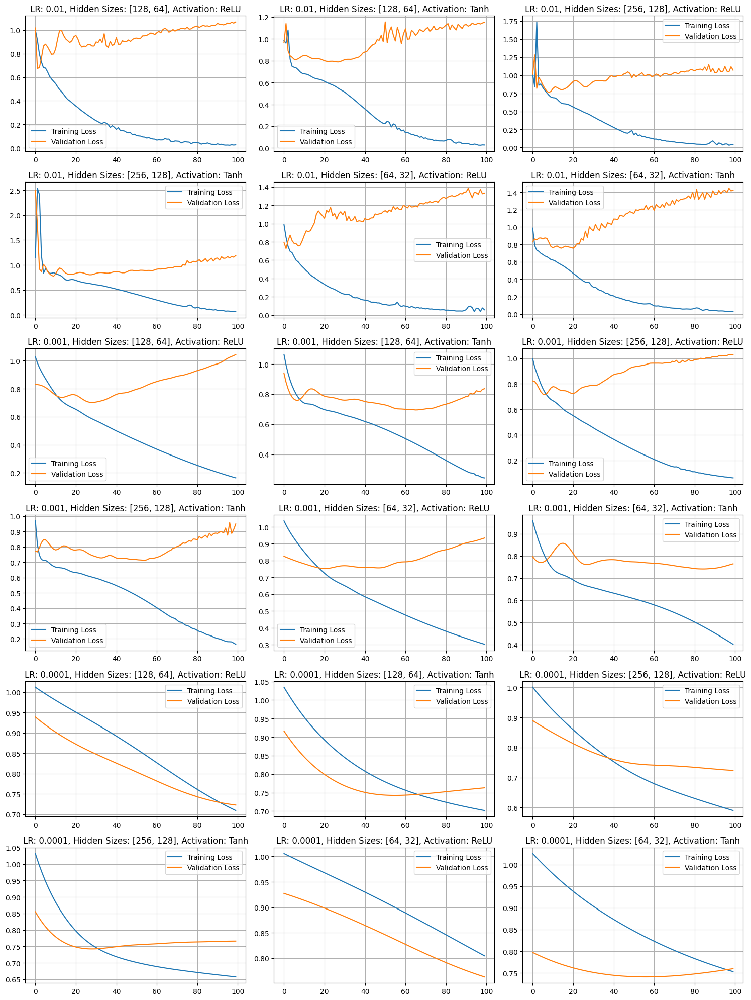

In [109]:
# Prepare the input features and target variable
EXCLUDE = ['ddG_scaled']
NUMERIC_FEATURES = [c for c in train_all_data.columns if c not in EXCLUDE + ['AA1', 'AA2', 'AA3', 'AA4', 'WT', 'MUT', 'prev', 'post', 'pdb', 'position', 'ddG']]
CATEGORICAL_FEATURES = ['AA1', 'AA2', 'AA3', 'AA4']

X_train_numeric = torch.tensor(train_all_data[NUMERIC_FEATURES].values, dtype=torch.float32)
X_train_categorical = {col: torch.tensor(train_all_data[col].values, dtype=torch.long) for col in CATEGORICAL_FEATURES}
y_train = torch.tensor(train_all_data['ddG_scaled'].values, dtype=torch.float32).unsqueeze(1)

X_valid_numeric = torch.tensor(holdout_all_data[NUMERIC_FEATURES].values, dtype=torch.float32)
X_valid_categorical = {col: torch.tensor(holdout_all_data[col].values, dtype=torch.long) for col in CATEGORICAL_FEATURES}
y_valid = torch.tensor(holdout_all_data['ddG_scaled'].values, dtype=torch.float32).unsqueeze(1)

print(X_train_numeric.shape, y_train.shape, X_valid_numeric.shape, y_valid.shape)

# Define the neural network architecture
class DDGPredictor(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size, activation_fn, embedding_dims):
        super(DDGPredictor, self).__init__()
        self.embedding_layers = nn.ModuleDict({
            col: nn.Embedding(int(max(train_all_data[col].max(), holdout_all_data[col].max())) + 1, embedding_dims)
            for col in CATEGORICAL_FEATURES
        })
        
        self.hidden_layers = nn.ModuleList()
        prev_size = input_size + len(CATEGORICAL_FEATURES) * embedding_dims
        for hidden_size in hidden_sizes:
            self.hidden_layers.append(nn.Linear(prev_size, hidden_size))
            self.hidden_layers.append(activation_fn())
            prev_size = hidden_size
        
        self.output_layer = nn.Linear(prev_size, output_size)

    def forward(self, x_numeric, x_categorical):
        embeddings = []
        for col in CATEGORICAL_FEATURES:
            embeddings.append(self.embedding_layers[col](x_categorical[col]).view(x_numeric.shape[0], -1))
        
        x = torch.cat([x_numeric] + embeddings, dim=1)
        
        for layer in self.hidden_layers:
            x = layer(x)
        
        x = self.output_layer(x)
        return x

# Set hyperparameters
input_size = X_train_numeric.shape[1]
output_size = 1
learning_rates = [0.01, 0.001, 0.0001]
hidden_sizes_list = [[128, 64], [256, 128], [64, 32]]
activation_functions = [nn.ReLU, nn.Tanh]
embedding_dims = 8
num_epochs = 100

# Create a list to store the results
results = []

# Grid search
for lr in learning_rates:
    for hidden_sizes in hidden_sizes_list:
        for activation_fn in activation_functions:
            model = DDGPredictor(input_size, hidden_sizes, output_size, activation_fn, embedding_dims)
            criterion = nn.MSELoss()
            optimizer = optim.Adam(model.parameters(), lr=lr)
            
            train_losses, val_losses, val_r2_scores = [], [], []
            
            for epoch in range(num_epochs):
                outputs = model(X_train_numeric, X_train_categorical)
                loss = criterion(outputs, y_train)
                
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                
                train_losses.append(loss.item())
                
                with torch.no_grad():
                    val_outputs = model(X_valid_numeric, X_valid_categorical)
                    val_loss = criterion(val_outputs, y_valid)
                    val_r2 = r2_score(y_valid.numpy(), val_outputs.numpy())
                    val_losses.append(val_loss.item())
                    val_r2_scores.append(val_r2)
            
            results.append((lr, hidden_sizes, activation_fn.__name__, train_losses, val_losses, val_r2_scores))

# Plotting the results
num_rows = len(learning_rates) * len(activation_functions)
num_cols = len(hidden_sizes_list)
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 20))

for idx, result in enumerate(results):
    lr, hidden_sizes, activation_fn, train_losses, val_losses, val_r2_scores = result
    row = idx // num_cols
    col = idx % num_cols
    ax = axs[row][col]
    ax.plot(range(num_epochs), train_losses, label='Training Loss')
    ax.plot(range(num_epochs), val_losses, label='Validation Loss')
    ax.set_title(f'LR: {lr}, Hidden Sizes: {hidden_sizes}, Activation: {activation_fn}')
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

torch.Size([2645, 60]) torch.Size([2645, 1]) torch.Size([398, 60]) torch.Size([398, 1])
Epoch [10/100], Loss: 0.9802, Validation Loss: 0.8570, Validation R^2: -0.0503, Validation Spearman: 0.2325
Epoch [20/100], Loss: 0.9496, Validation Loss: 0.8435, Validation R^2: -0.0337, Validation Spearman: 0.3189
Epoch [30/100], Loss: 0.9195, Validation Loss: 0.8298, Validation R^2: -0.0169, Validation Spearman: 0.3512
Epoch [40/100], Loss: 0.8892, Validation Loss: 0.8152, Validation R^2: 0.0010, Validation Spearman: 0.3553
Epoch [50/100], Loss: 0.8585, Validation Loss: 0.8000, Validation R^2: 0.0196, Validation Spearman: 0.3542
Epoch [60/100], Loss: 0.8278, Validation Loss: 0.7852, Validation R^2: 0.0377, Validation Spearman: 0.3537
Epoch [70/100], Loss: 0.7978, Validation Loss: 0.7710, Validation R^2: 0.0552, Validation Spearman: 0.3555
Epoch [80/100], Loss: 0.7691, Validation Loss: 0.7585, Validation R^2: 0.0705, Validation Spearman: 0.3603
Epoch [90/100], Loss: 0.7426, Validation Loss: 0.7484

c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


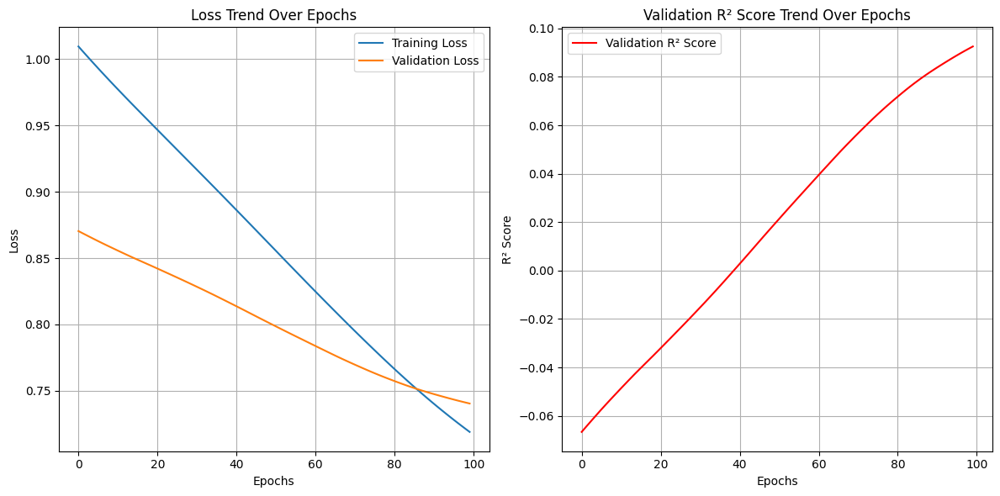

In [110]:
# Prepare the input features and target variable
EXCLUDE = ['ddG_scaled']
NUMERIC_FEATURES = [c for c in train_all_data.columns if c not in EXCLUDE + ['AA1', 'AA2', 'AA3', 'AA4', 'WT', 'MUT', 'prev', 'post', 'pdb', 'position', 'ddG']]
CATEGORICAL_FEATURES = ['AA1', 'AA2', 'AA3', 'AA4']

X_train_numeric = torch.tensor(train_all_data[NUMERIC_FEATURES].values, dtype=torch.float32)
X_train_categorical = {col: torch.tensor(train_all_data[col].values, dtype=torch.long) for col in CATEGORICAL_FEATURES}
y_train = torch.tensor(train_all_data['ddG_scaled'].values, dtype=torch.float32).unsqueeze(1)

X_valid_numeric = torch.tensor(holdout_all_data[NUMERIC_FEATURES].values, dtype=torch.float32)
X_valid_categorical = {col: torch.tensor(holdout_all_data[col].values, dtype=torch.long) for col in CATEGORICAL_FEATURES}
y_valid = torch.tensor(holdout_all_data['ddG_scaled'].values, dtype=torch.float32).unsqueeze(1)

print(X_train_numeric.shape, y_train.shape, X_valid_numeric.shape, y_valid.shape)

# Define the neural network architecture
class DDGPredictor(nn.Module):
    def __init__(self, input_size, hidden_sizes, output_size, embedding_dims):
        super(DDGPredictor, self).__init__()
        self.embedding_layers = nn.ModuleDict({
            col: nn.Embedding(int(max(train_all_data[col].max(), holdout_all_data[col].max())) + 1, embedding_dims)
            for col in CATEGORICAL_FEATURES
        })
        
        self.hidden_layers = nn.ModuleList()
        prev_size = input_size + len(CATEGORICAL_FEATURES) * embedding_dims
        for hidden_size in hidden_sizes:
            self.hidden_layers.append(nn.Linear(prev_size, hidden_size))
            self.hidden_layers.append(nn.ReLU())
            prev_size = hidden_size
        
        self.output_layer = nn.Linear(prev_size, output_size)

    def forward(self, x_numeric, x_categorical):
        embeddings = []
        for col in CATEGORICAL_FEATURES:
            embeddings.append(self.embedding_layers[col](x_categorical[col]).view(x_numeric.shape[0], -1))
        
        x = torch.cat([x_numeric] + embeddings, dim=1)
        
        for layer in self.hidden_layers:
            x = layer(x)
        
        embeddings = x.detach().numpy()  # Extract embeddings before the output layer
        
        x = self.output_layer(x)
        return x, embeddings

# Set hyperparameters
input_size = X_train_numeric.shape[1]
hidden_sizes = [128, 64]
output_size = 1
learning_rate = 0.0001
embedding_dims = 8
num_epochs = 100

# Create an instance of the model
model = DDGPredictor(input_size, hidden_sizes, output_size, embedding_dims)

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Lists to store loss, R^2, and Spearman correlation coefficient for visualization
train_losses = []
val_losses = []
val_r2_scores = []
val_spearman_scores = []
best_spearman_epoch = 0
best_spearman_score = float('-inf')
best_train_embeddings = None
best_val_embeddings = None

# Training loop
for epoch in range(num_epochs):
    # Forward pass
    outputs, embeddings = model(X_train_numeric, X_train_categorical)
    loss = criterion(outputs, y_train)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    train_losses.append(loss.item())
    
    # Evaluate the model on the validation set
    with torch.no_grad():
        val_outputs, val_embeddings = model(X_valid_numeric, X_valid_categorical)
        val_loss = criterion(val_outputs, y_valid)
        val_r2 = r2_score(y_valid.numpy(), val_outputs.numpy())
        val_spearman = spearmanr(y_valid.numpy().flatten(), val_outputs.numpy().flatten())[0]
        val_losses.append(val_loss.item())
        val_r2_scores.append(val_r2)
        val_spearman_scores.append(val_spearman)
        
        # Update the best Spearman correlation coefficient, corresponding epoch, and embeddings
        if val_spearman > best_spearman_score:
            best_spearman_score = val_spearman
            best_spearman_epoch = epoch + 1
            best_train_embeddings = embeddings
            best_val_embeddings = val_embeddings
    
    # Print the loss and validation metrics for every 10 epochs
    if (epoch + 1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item():.4f}, Validation Loss: {val_loss.item():.4f}, Validation R^2: {val_r2:.4f}, Validation Spearman: {val_spearman:.4f}")

# Create train DataFrame with specified columns and best embeddings
train_data = pd.DataFrame({
    'pdb_id': train_all_data['pdb'],
    'position': train_all_data['position'],
    'wildtype': train_all_data['WT'],
    'mutation': train_all_data['MUT'],
    'ddG': train_all_data['ddG']
}, index=train_all_data.index)
train_data['trained_embedding'] = pd.Series([embedding.astype('float32') for embedding in best_train_embeddings], index=train_all_data.index)

# Create validation DataFrame with specified columns and best embeddings
val_data = pd.DataFrame({
    'pdb_id': holdout_all_data['pdb'],
    'position': holdout_all_data['position'],
    'wildtype': holdout_all_data['WT'],
    'mutation': holdout_all_data['MUT'],
    'ddG': holdout_all_data['ddG']
}, index=holdout_all_data.index)
val_data['trained_embedding'] = pd.Series([embedding.astype('float32') for embedding in best_val_embeddings], index=holdout_all_data.index)

embeddings_dir = "embeddings_model4"
if not os.path.exists(embeddings_dir):
    os.makedirs(embeddings_dir)

# Save train DataFrame with embeddings
train_data.to_pickle(os.path.join(embeddings_dir, 'train_data_model4.pkl'))

# Save validation DataFrame with embeddings
val_data.to_pickle(os.path.join(embeddings_dir, 'val_data_model4.pkl'))

# Calculate validation RMSE, MSE, and R^2 for the epoch with the highest Spearman correlation coefficient
best_preds = model(X_valid_numeric, X_valid_categorical)[0].detach()
best_val_rmse = mean_squared_error(y_valid.numpy(), best_preds.numpy(), squared=False)
best_val_mse = mean_squared_error(y_valid.numpy(), best_preds.numpy())
best_val_r2 = r2_score(y_valid.numpy(), best_preds.numpy())

print(f"Epoch with the highest Spearman correlation coefficient: {best_spearman_epoch}")
print(f"Highest Spearman correlation coefficient: {best_spearman_score:.4f}")
print(f"Validation R^2 (Highest Spearman Epoch): {best_val_r2:.4f}")
print(f"Validation RMSE (Highest Spearman Epoch): {best_val_rmse:.4f}")
print(f"Validation MSE (Highest Spearman Epoch): {best_val_mse:.4f}")

# Plotting the training and validation loss and R^2 Score
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Trend Over Epochs')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(val_r2_scores, label='Validation R² Score', color='red')
plt.xlabel('Epochs')
plt.ylabel('R² Score')
plt.title('Validation R² Score Trend Over Epochs')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

In [166]:
# Read train embeddings DataFrame from the "embeddings_model4" directory
train_embeddings_df_model4 = pd.read_pickle(os.path.join("embeddings_model4", 'train_data_model4.pkl'))

# Read validation embeddings DataFrame from the "embeddings_model4" directory
val_embeddings_df_model4 = pd.read_pickle(os.path.join("embeddings_model4", 'val_data_model4.pkl'))

In [169]:
# Load the embeddings for the best-performing epoch
epoch_number = 49
thermompnn_train_embeddings_df = pd.read_pickle(f'embeddings_model1/train_embeddings_epoch_{epoch_number}.pkl')
thermompnn_val_embeddings_df = pd.read_pickle(f'embeddings_model1/val_embeddings_epoch_{epoch_number}.pkl')
print("Train Embeddings Data Shape:", thermompnn_train_embeddings_df.shape)
print("Val Embeddings Data Shape:", thermompnn_val_embeddings_df.shape)

Train Embeddings Data Shape: (2645, 6)
Val Embeddings Data Shape: (398, 6)


In [171]:
# Merge train_embeddings_df and ESM_embeddings_df based on matching columns
merged_df_train = pd.merge(thermompnn_train_embeddings_df, train_embeddings_df_model4, on=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG'], how='left')

# Concatenate the embeddings
merged_df_train['combined_embedding'] = merged_df_train.apply(lambda row: np.concatenate((row['thermompnn_embedding'], row['trained_embedding'])), axis=1)

# Drop the individual embedding columns
merged_df_train = merged_df_train.drop(['thermompnn_embedding', 'trained_embedding'], axis=1)

In [172]:
# Merge train_embeddings_df and ESM_embeddings_df based on matching columns
merged_df_val = pd.merge(thermompnn_val_embeddings_df, val_embeddings_df_model4, on=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG'], how='left')

# Concatenate the embeddings
merged_df_val['combined_embedding'] = merged_df_val.apply(lambda row: np.concatenate((row['thermompnn_embedding'], row['trained_embedding'])), axis=1)

# Drop the individual embedding columns
merged_df_val = merged_df_val.drop(['thermompnn_embedding', 'trained_embedding'], axis=1)

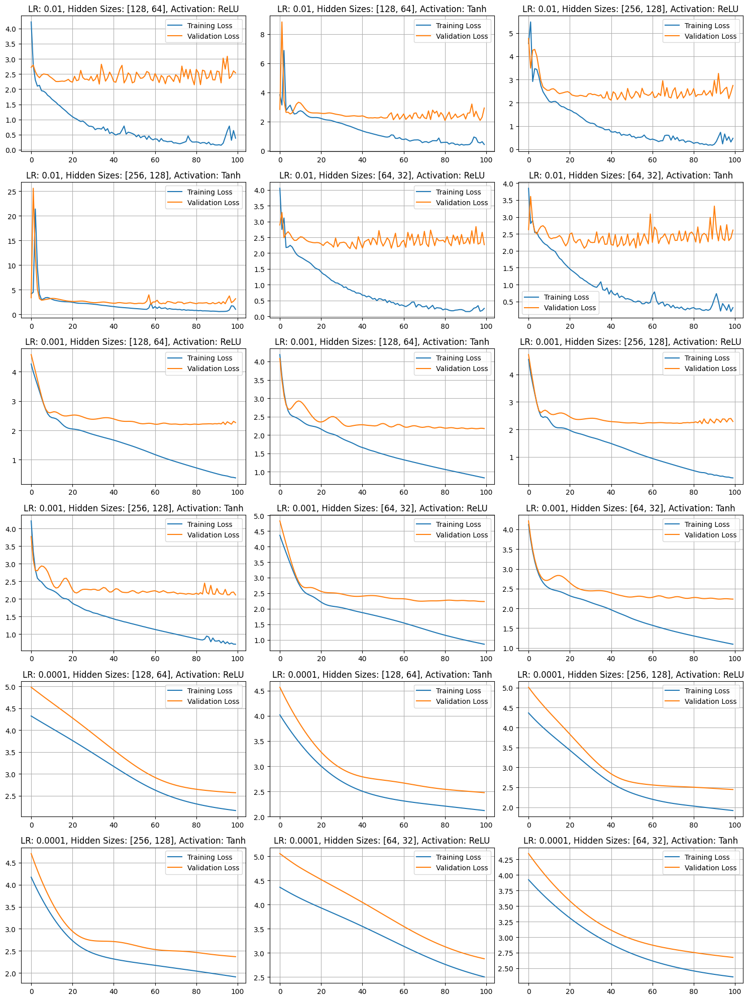

In [129]:
# Load data
X_train = np.stack(merged_df_train['combined_embedding'].values)
y_train = np.stack(merged_df_train['ddG'].values)
X_val = np.stack(merged_df_val['combined_embedding'].values)
y_val = np.stack(merged_df_val['ddG'].values)

# Convert the data to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
X_val = torch.tensor(X_val, dtype=torch.float32)
y_val = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)

# Define models
class MLPRegressor(nn.Module):
    def __init__(self, input_size, output_size, hidden_sizes, activation_fn):
        super(MLPRegressor, self).__init__()
        layers = []
        prev_size = input_size
        for hidden_size in hidden_sizes:
            layers.append(nn.Linear(prev_size, hidden_size))
            layers.append(activation_fn())
            prev_size = hidden_size
        layers.append(nn.Linear(prev_size, output_size))
        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        return self.layers(x)

# Define parameters for grid search
learning_rates = [0.01, 0.001, 0.0001]
hidden_sizes_list = [[128, 64], [256, 128], [64, 32]]
activation_functions = [nn.ReLU, nn.Tanh]
num_epochs = 100

# Grid Search
results = []
for lr in learning_rates:
    for hidden_sizes in hidden_sizes_list:
        for activation_fn in activation_functions:
            model = MLPRegressor(input_size=X_train.shape[1], output_size=1, hidden_sizes=hidden_sizes, activation_fn=activation_fn)
            criterion = nn.MSELoss()
            optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=0.01)
            
            train_losses, val_losses, val_r2_scores = [], [], []
            for epoch in range(num_epochs):
                model.train()
                optimizer.zero_grad()
                outputs = model(X_train)
                loss = criterion(outputs, y_train)
                loss.backward()
                optimizer.step()
                train_losses.append(loss.item())
                
                model.eval()
                with torch.no_grad():
                    val_outputs = model(X_val)
                    val_loss = criterion(val_outputs, y_val)
                    val_losses.append(val_loss.item())
                    val_r2 = r2_score(y_val.numpy(), val_outputs.numpy())
                    val_r2_scores.append(val_r2)
            
            results.append((lr, hidden_sizes, activation_fn.__name__, train_losses, val_losses, val_r2_scores))

# Plotting results
num_rows = len(learning_rates) * len(activation_functions)
num_cols = len(hidden_sizes_list)
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 20))

for idx, result in enumerate(results):
    lr, hidden_sizes, activation_fn, train_losses, val_losses, val_r2_scores = result
    row = idx // num_cols
    col = idx % num_cols
    ax = axs[row][col]
    ax.plot(range(num_epochs), train_losses, label='Training Loss')
    ax.plot(range(num_epochs), val_losses, label='Validation Loss')
    ax.set_title(f'LR: {lr}, Hidden Sizes: {hidden_sizes}, Activation: {activation_fn}')
    ax.legend()
    ax.grid(True)

plt.tight_layout()
plt.show()

Epoch 10/100, Training Loss: 3.5886, Validation Loss: 4.0480, Validation R^2: -0.5817, Validation Spearman: 0.2550
Epoch 20/100, Training Loss: 3.0428, Validation Loss: 3.3777, Validation R^2: -0.3198, Validation Spearman: 0.2729
Epoch 30/100, Training Loss: 2.5544, Validation Loss: 2.8296, Validation R^2: -0.1056, Validation Spearman: 0.2792
Epoch 40/100, Training Loss: 2.2477, Validation Loss: 2.5786, Validation R^2: -0.0076, Validation Spearman: 0.2945
Epoch 50/100, Training Loss: 2.1263, Validation Loss: 2.5548, Validation R^2: 0.0017, Validation Spearman: 0.3081
Epoch 60/100, Training Loss: 2.0504, Validation Loss: 2.5514, Validation R^2: 0.0030, Validation Spearman: 0.3173
Epoch 70/100, Training Loss: 2.0089, Validation Loss: 2.5446, Validation R^2: 0.0057, Validation Spearman: 0.3313
Epoch 80/100, Training Loss: 1.9691, Validation Loss: 2.5115, Validation R^2: 0.0186, Validation Spearman: 0.3387
Epoch 90/100, Training Loss: 1.9302, Validation Loss: 2.4909, Validation R^2: 0.0267

c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


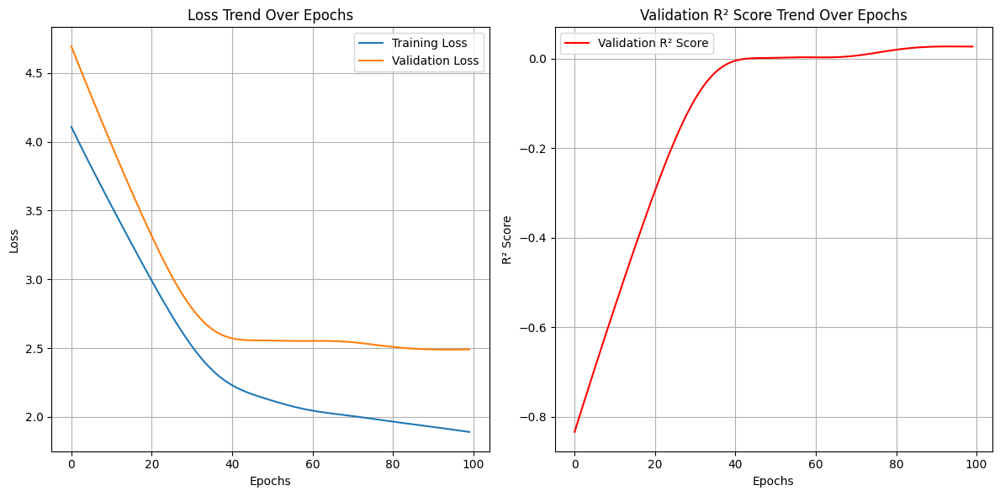

In [175]:
# Load data
X_train = np.stack(merged_df_train['combined_embedding'].values)
y_train = np.stack(merged_df_train['ddG'].values)
X_val = np.stack(merged_df_val['combined_embedding'].values)
y_val = np.stack(merged_df_val['ddG'].values)

# Convert the data to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(1)
X_val = torch.tensor(X_val, dtype=torch.float32)
y_val = torch.tensor(y_val, dtype=torch.float32).unsqueeze(1)

class MLPRegressor(nn.Module):
    def __init__(self, input_size, output_size):
        super(MLPRegressor, self).__init__()
        self.layer = nn.Sequential(
            nn.Linear(input_size, 256),  # First hidden layer
            nn.ReLU(),
            nn.Linear(256, 128),  # Second hidden layer
            nn.ReLU(),
            nn.Linear(128, output_size)
        )
    
    def forward(self, x):
        embeddings = self.layer[:-1](x)  # Extract embeddings before the output layer
        output = self.layer[-1](embeddings)  # Pass embeddings through the output layer
        return output, embeddings.detach().numpy()

# Model Configuration
input_size = X_train.shape[1]
output_size = 1
learning_rate = 0.0001
num_epochs = 100

# Create an instance of the MLP model
model = MLPRegressor(input_size, output_size)

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=0.01)  # Using weight decay as L2 regularization

# Lists to store loss, R^2, and Spearman correlation coefficient for visualization
train_losses = []
val_losses = []
val_r2_scores = []
val_spearman_scores = []
best_spearman_epoch = 0
best_spearman_score = float('-inf')
best_train_embeddings = None
best_val_embeddings = None

# Training loop
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs, train_embeddings = model(X_train)
    loss = criterion(outputs, y_train)
    loss.backward()
    optimizer.step()
    train_losses.append(loss.item())
    
    # Validate the model
    model.eval()
    
    with torch.no_grad():
        preds, val_embeddings = model(X_val)
        val_loss = criterion(preds, y_val).item()
        val_r2 = r2_score(y_val.numpy(), preds.numpy())
        val_spearman = spearmanr(y_val.numpy().flatten(), preds.numpy().flatten())[0]
        val_losses.append(val_loss)
        val_r2_scores.append(val_r2)
        val_spearman_scores.append(val_spearman)
        
        # Update the best Spearman correlation coefficient, corresponding epoch, and best embeddings
        if val_spearman > best_spearman_score:
            best_spearman_score = val_spearman
            best_spearman_epoch = epoch + 1
            best_train_embeddings = train_embeddings
            best_val_embeddings = val_embeddings
    
    # Print progress
    if (epoch + 1) % 10 == 0:
        print(f"Epoch {epoch+1}/{num_epochs}, Training Loss: {loss.item():.4f}, Validation Loss: {val_loss:.4f}, Validation R^2: {val_r2:.4f}, Validation Spearman: {val_spearman:.4f}")

# Create train DataFrame with specified columns and best embeddings
train_data = pd.DataFrame({
    'pdb_id': merged_df_train['pdb_id'],
    'position': merged_df_train['position'],
    'wildtype': merged_df_train['wildtype'],
    'mutation': merged_df_train['mutation'],
    'ddG': merged_df_train['ddG']
}, index=merged_df_train.index)
train_data['trained_embedding'] = pd.Series([embedding.astype('float32') for embedding in best_train_embeddings], index=merged_df_train.index)

# Create validation DataFrame with specified columns and best embeddings
val_data = pd.DataFrame({
    'pdb_id': merged_df_val['pdb_id'],
    'position': merged_df_val['position'],
    'wildtype': merged_df_val['wildtype'],
    'mutation': merged_df_val['mutation'],
    'ddG': merged_df_val['ddG']
}, index=merged_df_val.index)
val_data['trained_embedding'] = pd.Series([embedding.astype('float32') for embedding in best_val_embeddings], index=merged_df_val.index)

embeddings_dir = "embeddings_model4"
if not os.path.exists(embeddings_dir):
    os.makedirs(embeddings_dir)

# Save train DataFrame with embeddings
train_data.to_pickle(os.path.join(embeddings_dir, 'train_data_model4_COMBINED.pkl'))

# Save validation DataFrame with embeddings
val_data.to_pickle(os.path.join(embeddings_dir, 'val_data_model4_COMBINED.pkl'))

# Calculate validation RMSE and MSE for the epoch with the highest Spearman correlation coefficient
best_preds = model(X_val)[0].detach()
best_val_rmse = mean_squared_error(y_val.numpy(), best_preds.numpy(), squared=False)
best_val_mse = mean_squared_error(y_val.numpy(), best_preds.numpy())
best_val_r2 = r2_score(y_val.numpy(), best_preds.numpy())

print(f"Epoch with the highest Spearman correlation coefficient: {best_spearman_epoch}")
print(f"Highest Spearman correlation coefficient: {best_spearman_score:.4f}")
print(f"Validation R^2 (Highest Spearman Epoch): {best_val_r2:.4f}")
print(f"Validation RMSE (Highest Spearman Epoch): {best_val_rmse:.4f}")
print(f"Validation MSE (Highest Spearman Epoch): {best_val_mse:.4f}")

# Plotting the training and validation loss, R^2 Score, and Spearman correlation coefficient
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Trend Over Epochs')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(val_r2_scores, label='Validation R² Score', color='red')
plt.xlabel('Epochs')
plt.ylabel('R² Score')
plt.title('Validation R² Score Trend Over Epochs')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Visualizing embeddings

MODEL 1

In [387]:
train_lin_input_embeddings_df = pd.read_pickle('embeddings_model1/train_lin_input_embeddings.pkl')
val_lin_input_embeddings_df = pd.read_pickle('embeddings_model1/val_lin_input_embeddings.pkl')

print("Train Lin Input Embeddings Data Shape:", train_lin_input_embeddings_df.shape)
print("Val Lin Input Embeddings Data Shape:", val_lin_input_embeddings_df.shape)

Train Lin Input Embeddings Data Shape: (2645, 6)
Val Lin Input Embeddings Data Shape: (398, 6)


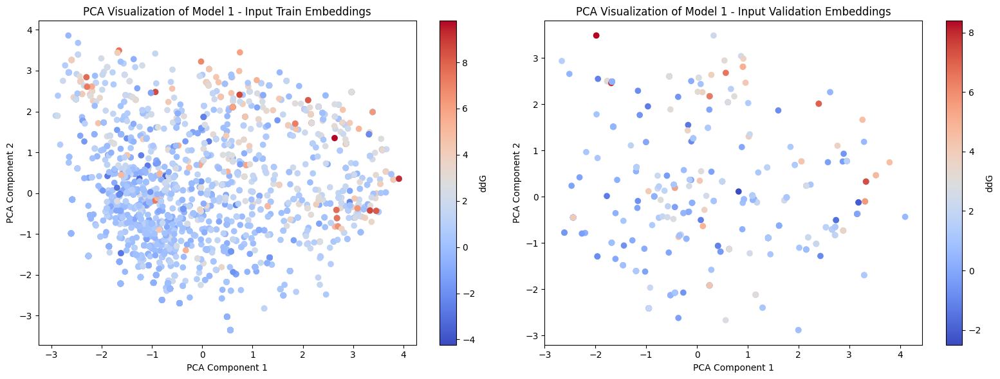

In [388]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train_lin_input_embeddings_df['lin_input_embedding'].tolist())
train_ddG_values = train_lin_input_embeddings_df['ddG'].values
val_embeddings = np.array(val_lin_input_embeddings_df['lin_input_embedding'].tolist())
val_ddG_values = val_lin_input_embeddings_df['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 1 - Input Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 1 - Input Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

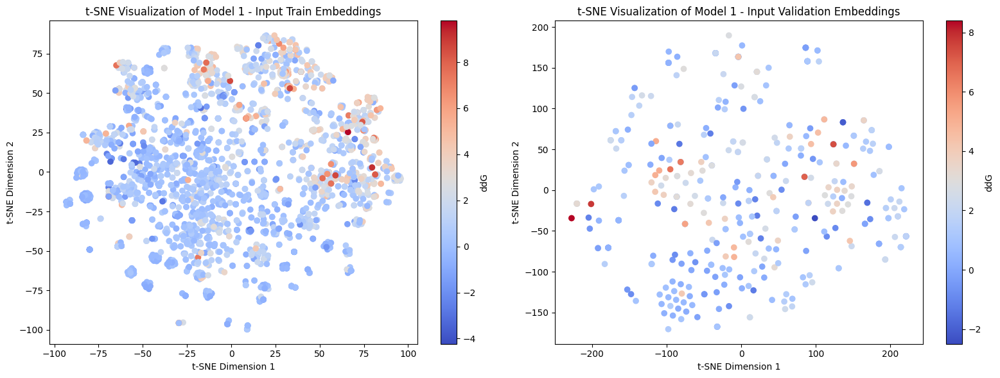

In [389]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train_lin_input_embeddings_df['lin_input_embedding'].tolist())
train_ddG_values = train_lin_input_embeddings_df['ddG'].values
val_embeddings = np.array(val_lin_input_embeddings_df['lin_input_embedding'].tolist())
val_ddG_values = val_lin_input_embeddings_df['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 1 - Input Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 1 - Input Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [390]:
epoch_number = 49

In [391]:
model1_best_train_embeddings_df = pd.read_pickle(f'embeddings_model1/train_embeddings_epoch_{epoch_number}.pkl')
model1_best_val_embeddings_df = pd.read_pickle(f'embeddings_model1/val_embeddings_epoch_{epoch_number}.pkl')

print("Train Embeddings Data Shape:", model1_best_train_embeddings_df.shape)
print("Val Embeddings Data Shape:", model1_best_val_embeddings_df.shape)

Train Embeddings Data Shape: (2645, 6)
Val Embeddings Data Shape: (398, 6)


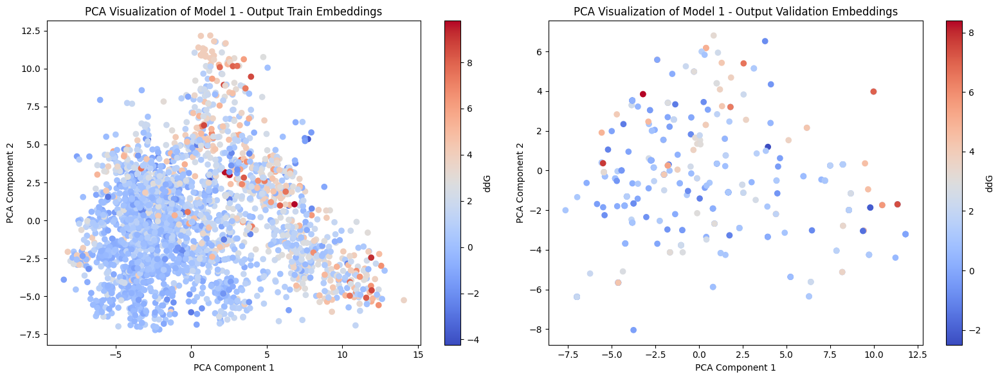

In [392]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(model1_best_train_embeddings_df['thermompnn_embedding'].tolist())
train_ddG_values = model1_best_train_embeddings_df['ddG'].values
val_embeddings = np.array(model1_best_val_embeddings_df['thermompnn_embedding'].tolist())
val_ddG_values = model1_best_val_embeddings_df['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 1 - Output Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 1 - Output Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

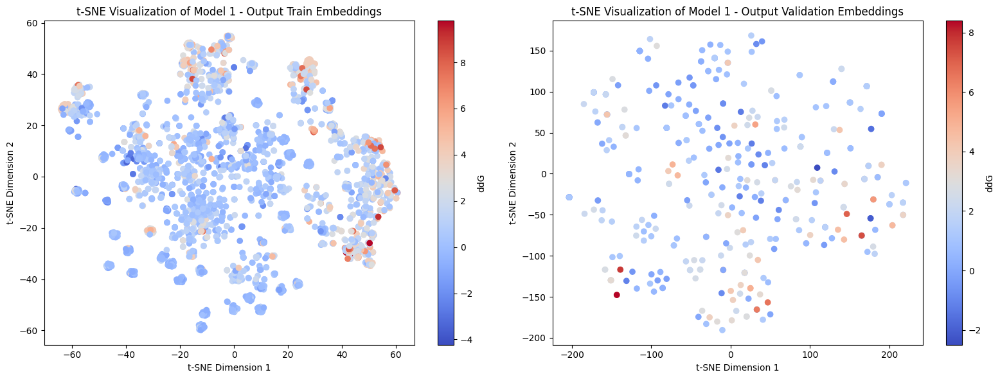

In [393]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(model1_best_train_embeddings_df['thermompnn_embedding'].tolist())
train_ddG_values = model1_best_train_embeddings_df['ddG'].values
val_embeddings = np.array(model1_best_val_embeddings_df['thermompnn_embedding'].tolist())
val_ddG_values = model1_best_val_embeddings_df['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 1 - Output Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 1 - Output Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [394]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define a function to train and evaluate the random forest classifier
def train_and_evaluate_random_forest(train_embeddings, train_ddG_values, val_embeddings, val_ddG_values):
    # Convert ddG values to binary labels (e.g., 0 for ddG < 0 and 1 for ddG >= 0)
    train_labels = (train_ddG_values >= 0).astype(int)
    val_labels = (val_ddG_values >= 0).astype(int)
    
    # Create a random forest classifier
    rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)
    
    # Train the random forest classifier
    rf_classifier.fit(train_embeddings, train_labels)
    
    # Make predictions on the validation set
    val_predictions = rf_classifier.predict(val_embeddings)
    
    # Evaluate the classifier
    accuracy = accuracy_score(val_labels, val_predictions)
    precision = precision_score(val_labels, val_predictions)
    recall = recall_score(val_labels, val_predictions)
    f1 = f1_score(val_labels, val_predictions)
    
    return accuracy, precision, recall, f1

# Train and evaluate the random forest classifier for PCA embeddings
print("Random Forest Classifier - PCA Embeddings")
pca_accuracy, pca_precision, pca_recall, pca_f1 = train_and_evaluate_random_forest(
    train_embeddings_pca, train_ddG_values, val_embeddings_pca, val_ddG_values)
print(f"Accuracy: {pca_accuracy:.4f}")
print(f"Precision: {pca_precision:.4f}")
print(f"Recall: {pca_recall:.4f}")
print(f"F1-score: {pca_f1:.4f}")
print()

# Train and evaluate the random forest classifier for t-SNE embeddings
print("Random Forest Classifier - t-SNE Embeddings")
tsne_accuracy, tsne_precision, tsne_recall, tsne_f1 = train_and_evaluate_random_forest(
    train_embeddings_tsne, train_ddG_values, val_embeddings_tsne, val_ddG_values)
print(f"Accuracy: {tsne_accuracy:.4f}")
print(f"Precision: {tsne_precision:.4f}")
print(f"Recall: {tsne_recall:.4f}")
print(f"F1-score: {tsne_f1:.4f}")

Random Forest Classifier - PCA Embeddings
Accuracy: 0.7965
Precision: 0.8761
Recall: 0.8889
F1-score: 0.8824

Random Forest Classifier - t-SNE Embeddings
Accuracy: 0.6558
Precision: 0.8522
Recall: 0.7251
F1-score: 0.7836


MODEL 2

In [20]:
ESM_train_embeddings_df = pd.read_pickle('embeddings_model2/ESM_train_embeddings.pkl')
ESM_val_embeddings_df = pd.read_pickle('embeddings_model2/ESM_val_embeddings.pkl')

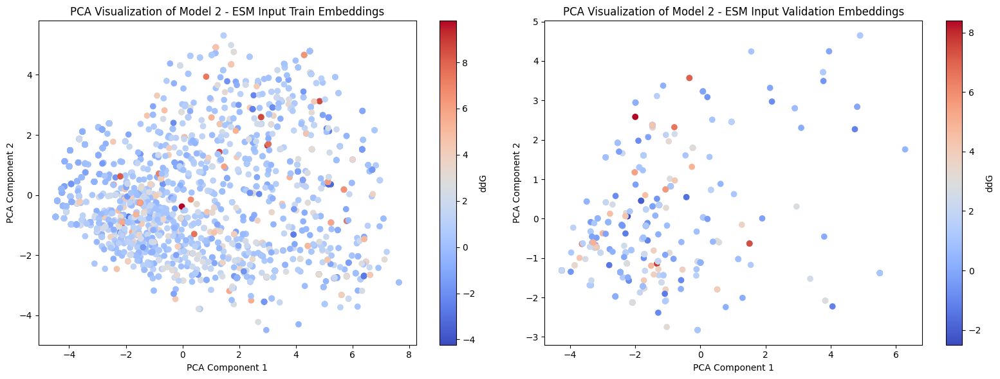

In [23]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(ESM_train_embeddings_df['ESM_embedding'].tolist())
train_ddG_values = ESM_train_embeddings_df['ddG'].values
val_embeddings = np.array(ESM_val_embeddings_df['ESM_embedding'].tolist())
val_ddG_values = ESM_val_embeddings_df['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 2 - ESM Input Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 2 - ESM Input Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

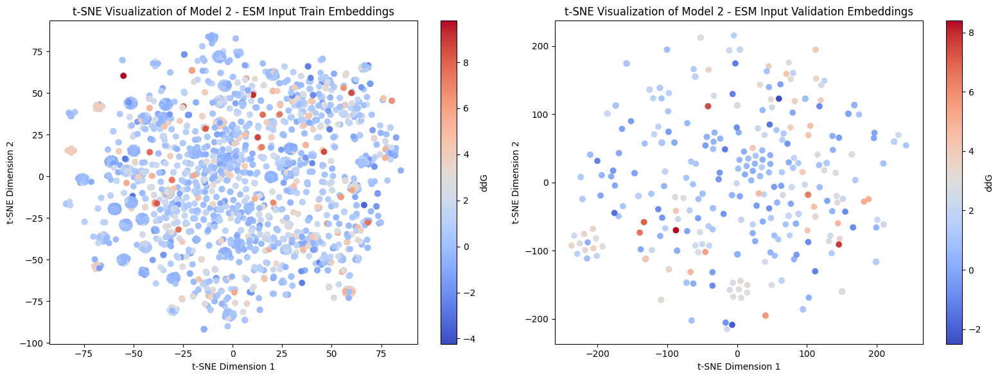

In [24]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(ESM_train_embeddings_df['ESM_embedding'].tolist())
train_ddG_values = ESM_train_embeddings_df['ddG'].values
val_embeddings = np.array(ESM_val_embeddings_df['ESM_embedding'].tolist())
val_ddG_values = ESM_val_embeddings_df['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 2 - ESM Input Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 2 - ESM Input Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [28]:
epoch_number = 49

In [29]:
model1_best_train_embeddings_df = pd.read_pickle(f'embeddings_model1/train_embeddings_epoch_{epoch_number}.pkl')
model1_best_val_embeddings_df = pd.read_pickle(f'embeddings_model1/val_embeddings_epoch_{epoch_number}.pkl')

print("Train Embeddings Data Shape:", model1_best_train_embeddings_df.shape)
print("Val Embeddings Data Shape:", model1_best_val_embeddings_df.shape)

Train Embeddings Data Shape: (2645, 6)
Val Embeddings Data Shape: (398, 6)


In [30]:
model1_best_train_embeddings_df.columns

Index(['pdb_id', 'position', 'wildtype', 'mutation', 'ddG',
       'thermompnn_embedding'],
      dtype='object')

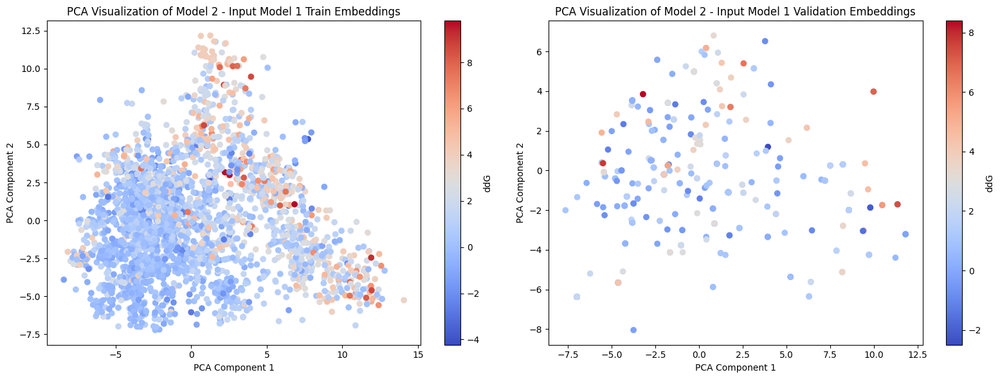

In [33]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(model1_best_train_embeddings_df['thermompnn_embedding'].tolist())
train_ddG_values = model1_best_train_embeddings_df['ddG'].values
val_embeddings = np.array(model1_best_val_embeddings_df['thermompnn_embedding'].tolist())
val_ddG_values = model1_best_val_embeddings_df['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 2 - Input Model 1 Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 2 - Input Model 1 Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

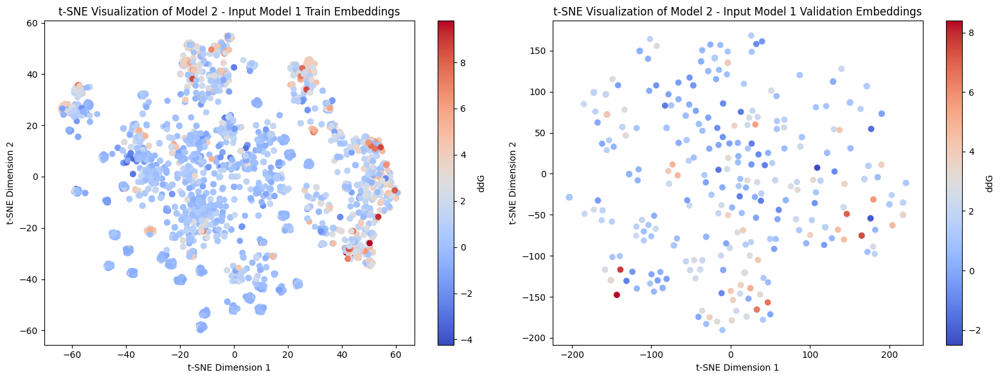

In [34]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(model1_best_train_embeddings_df['thermompnn_embedding'].tolist())
train_ddG_values = model1_best_train_embeddings_df['ddG'].values
val_embeddings = np.array(model1_best_val_embeddings_df['thermompnn_embedding'].tolist())
val_ddG_values = model1_best_val_embeddings_df['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 2 - Input Model 1 Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 2 - Input Model 1 Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [68]:
# Merge train_embeddings_df and ESM_embeddings_df based on matching columns
merged_df_train = pd.merge(model1_best_train_embeddings_df, ESM_train_embeddings_df, on=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG'], how='left')

# Concatenate the embeddings
merged_df_train['combined_embedding'] = merged_df_train.apply(lambda row: np.concatenate((row['thermompnn_embedding'], row['ESM_embedding'])), axis=1)

# Drop the individual embedding columns
merged_df_train = merged_df_train.drop(['thermompnn_embedding', 'ESM_embedding'], axis=1)

# Merge train_embeddings_df and ESM_embeddings_df based on matching columns
merged_df_val = pd.merge(model1_best_val_embeddings_df, ESM_val_embeddings_df, on=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG'], how='left')

# Concatenate the embeddings
merged_df_val['combined_embedding'] = merged_df_val.apply(lambda row: np.concatenate((row['thermompnn_embedding'], row['ESM_embedding'])), axis=1)

# Drop the individual embedding columns
merged_df_val = merged_df_val.drop(['thermompnn_embedding', 'ESM_embedding'], axis=1)

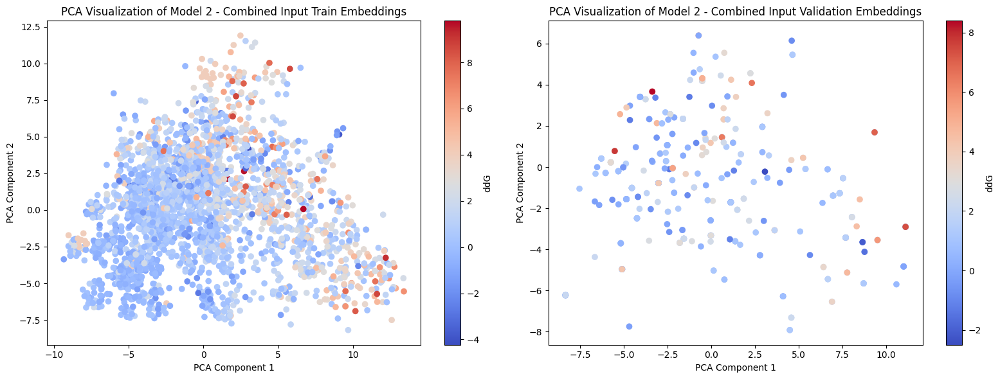

In [36]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(merged_df_train['combined_embedding'].tolist())
train_ddG_values = merged_df_train['ddG'].values
val_embeddings = np.array(merged_df_val['combined_embedding'].tolist())
val_ddG_values = merged_df_val['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 2 - Combined Input Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 2 - Combined Input Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

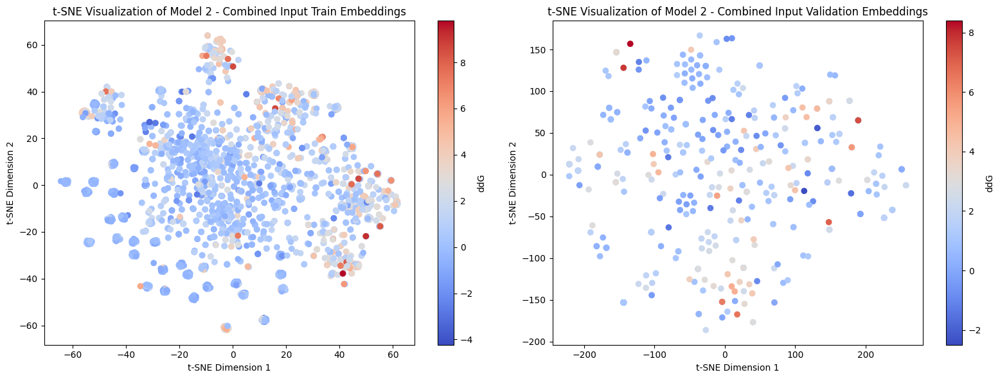

In [37]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(merged_df_train['combined_embedding'].tolist())
train_ddG_values = merged_df_train['ddG'].values
val_embeddings = np.array(merged_df_val['combined_embedding'].tolist())
val_ddG_values = merged_df_val['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 2 - Combined Input Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 2 - Combined Input Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [191]:
# read train_embeddings_data.csv and val_embeddings_data.csv
train_combined_embeddings_output_df = pd.read_pickle('embeddings_model2/train_data_model2.pkl')
val_combined_embeddings_output_df = pd.read_pickle('embeddings_model2/val_data_model2.pkl')

print("Train Embeddings Data Shape:", train_combined_embeddings_output_df.shape)
print("Val Embeddings Data Shape:", val_combined_embeddings_output_df.shape)

Train Embeddings Data Shape: (2645, 6)
Val Embeddings Data Shape: (398, 6)


In [192]:
train_combined_embeddings_output_df.columns

Index(['pdb_id', 'position', 'wildtype', 'mutation', 'ddG',
       'trained_embedding'],
      dtype='object')

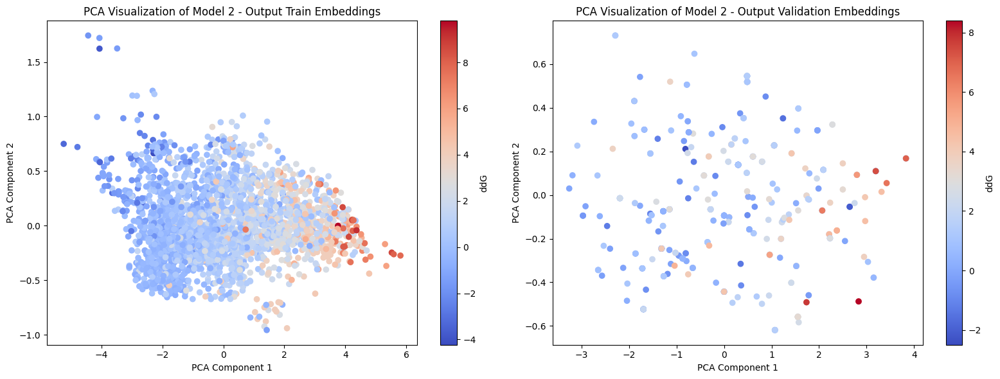

In [193]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train_combined_embeddings_output_df['trained_embedding'].tolist())
train_ddG_values = train_combined_embeddings_output_df['ddG'].values
val_embeddings = np.array(val_combined_embeddings_output_df['trained_embedding'].tolist())
val_ddG_values = val_combined_embeddings_output_df['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 2 - Output Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 2 - Output Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

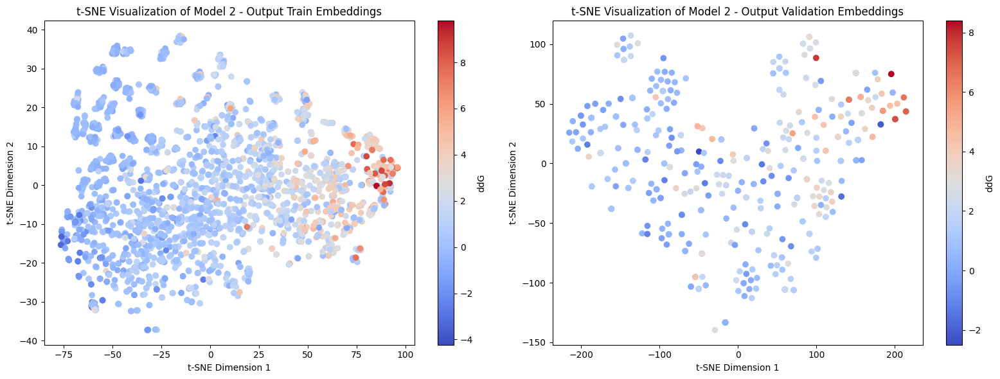

In [196]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train_combined_embeddings_output_df['trained_embedding'].tolist())
train_ddG_values = train_combined_embeddings_output_df['ddG'].values
val_embeddings = np.array(val_combined_embeddings_output_df['trained_embedding'].tolist())
val_ddG_values = val_combined_embeddings_output_df['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 2 - Output Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 2 - Output Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

MODEL 3

In [395]:
train_lin_input_embeddings_df = pd.read_pickle('embeddings_model1/train_lin_input_embeddings.pkl')
val_lin_input_embeddings_df = pd.read_pickle('embeddings_model1/val_lin_input_embeddings.pkl')

print("Train Lin Input Embeddings Data Shape:", train_lin_input_embeddings_df.shape)
print("Val Lin Input Embeddings Data Shape:", val_lin_input_embeddings_df.shape)

Train Lin Input Embeddings Data Shape: (2645, 6)
Val Lin Input Embeddings Data Shape: (398, 6)


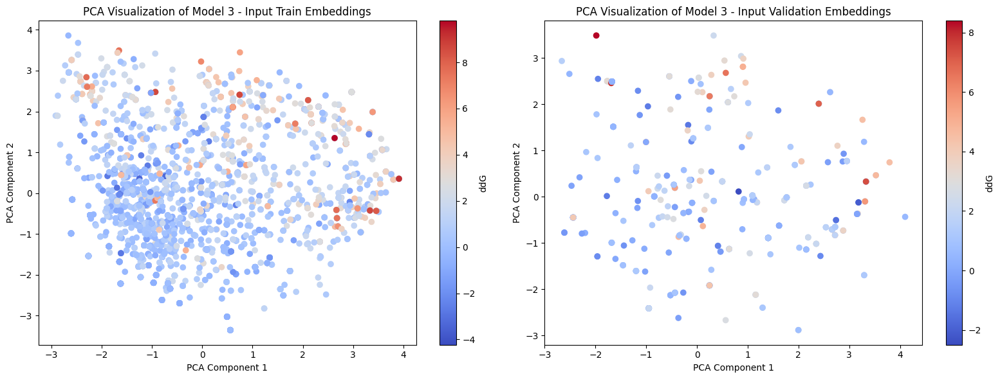

In [396]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train_lin_input_embeddings_df['lin_input_embedding'].tolist())
train_ddG_values = train_lin_input_embeddings_df['ddG'].values
val_embeddings = np.array(val_lin_input_embeddings_df['lin_input_embedding'].tolist())
val_ddG_values = val_lin_input_embeddings_df['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 3 - Input Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 3 - Input Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

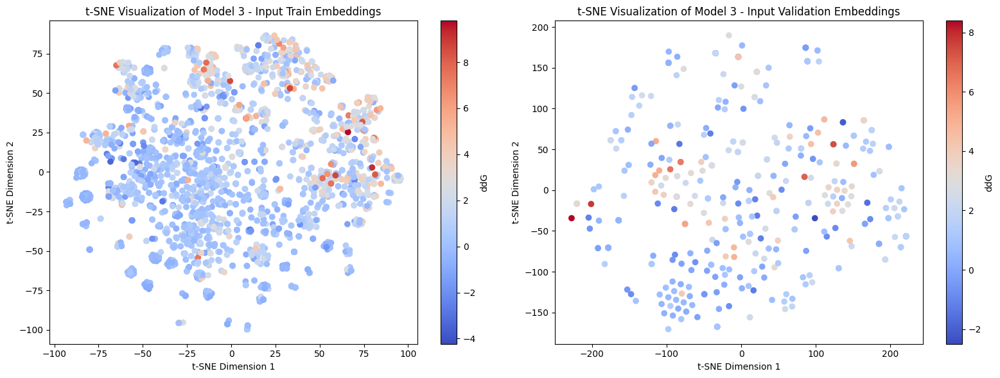

In [397]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train_lin_input_embeddings_df['lin_input_embedding'].tolist())
train_ddG_values = train_lin_input_embeddings_df['ddG'].values
val_embeddings = np.array(val_lin_input_embeddings_df['lin_input_embedding'].tolist())
val_ddG_values = val_lin_input_embeddings_df['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 3 - Input Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 3 - Input Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [398]:
ESM_train_embeddings_df = pd.read_pickle('embeddings_model3/ESM_train_embeddings.pkl')
ESM_val_embeddings_df = pd.read_pickle('embeddings_model3/ESM_val_embeddings.pkl')

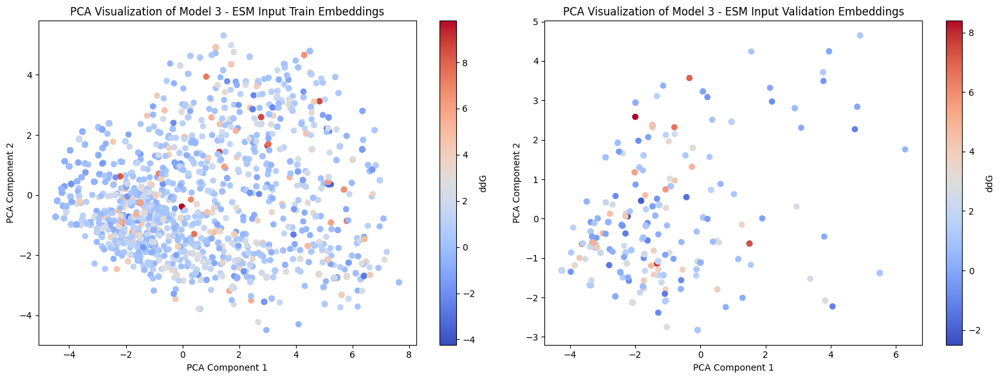

In [399]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(ESM_train_embeddings_df['ESM_embedding'].tolist())
train_ddG_values = ESM_train_embeddings_df['ddG'].values
val_embeddings = np.array(ESM_val_embeddings_df['ESM_embedding'].tolist())
val_ddG_values = ESM_val_embeddings_df['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 3 - ESM Input Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 3 - ESM Input Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

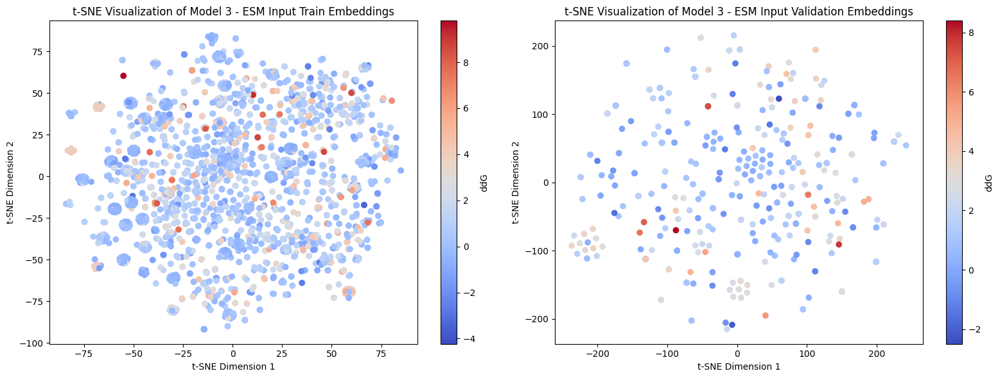

In [400]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(ESM_train_embeddings_df['ESM_embedding'].tolist())
train_ddG_values = ESM_train_embeddings_df['ddG'].values
val_embeddings = np.array(ESM_val_embeddings_df['ESM_embedding'].tolist())
val_ddG_values = ESM_val_embeddings_df['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 3 - ESM Input Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 3 - ESM Input Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [401]:
# read train_embeddings_data.csv and val_embeddings_data.csv
train__combined_embeddings_df = pd.read_pickle('embeddings_model3/train_combined_embeddings.pkl')
val_combined_embeddings_df = pd.read_pickle('embeddings_model3/val_combined_embeddings.pkl')

print("Train Embeddings Data Shape:", train__combined_embeddings_df.shape)
print("Val Embeddings Data Shape:", val_combined_embeddings_df.shape)

Train Embeddings Data Shape: (2645, 6)
Val Embeddings Data Shape: (398, 6)


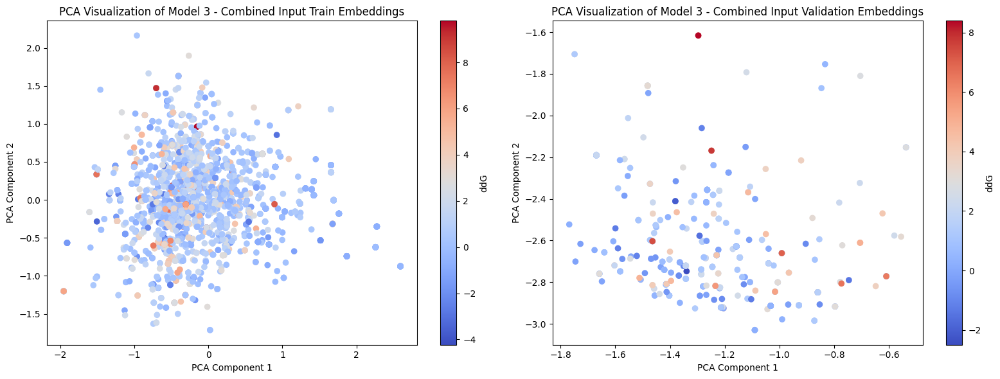

In [402]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train__combined_embeddings_df['combined_embedding'].tolist())
train_ddG_values = train__combined_embeddings_df['ddG'].values
val_embeddings = np.array(val_combined_embeddings_df['combined_embedding'].tolist())
val_ddG_values = val_combined_embeddings_df['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 3 - Combined Input Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 3 - Combined Input Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

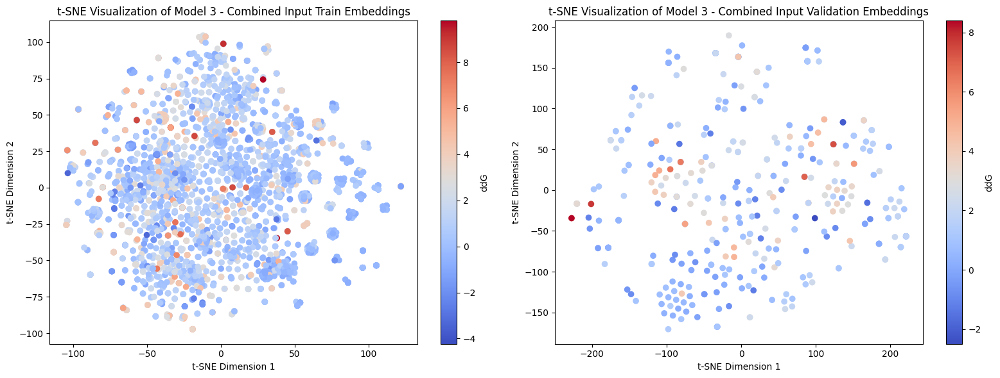

In [403]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train__combined_embeddings_df['combined_embedding'].tolist())
train_ddG_values = train__combined_embeddings_df['ddG'].values
val_embeddings = np.array(val_combined_embeddings_df['combined_embedding'].tolist())
val_ddG_values = val_combined_embeddings_df['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 3 - Combined Input Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 3 - Combined Input Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [404]:
epoch_number = 34
model3_best_train_embeddings_df = pd.read_pickle(f'embeddings_model3/train_embeddings_epoch_{epoch_number}.pkl')
model3_best_val_embeddings_df = pd.read_pickle(f'embeddings_model3/val_embeddings_epoch_{epoch_number}.pkl')

print("Train Embeddings Data Shape:", model3_best_train_embeddings_df.shape)
print("Val Embeddings Data Shape:", model3_best_val_embeddings_df.shape)

Train Embeddings Data Shape: (2645, 6)
Val Embeddings Data Shape: (398, 6)


In [405]:
model3_best_train_embeddings_df.columns

Index(['pdb_id', 'position', 'wildtype', 'mutation', 'ddG',
       'thermompnn_embedding'],
      dtype='object')

c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\wandb\sdk\wandb_run.py:2165: UserWarning: Run (s2wmubq8) is finished. The call to `_console_raw_callback` will be ignored. Please make sure that you are using an active run.
  lambda data: self._console_raw_callback("stdout", data),
c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\wandb\sdk\wandb_run.py:2165: UserWarning: Run (dhifmu7j) is finished. The call to `_console_raw_callback` will be ignored. Please make sure that you are using an active run.
  lambda data: self._console_raw_callback("stdout", data),
c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\wandb\sdk\wandb_run.py:2165: UserWarning: Run (e9m2q5k8) is finished. The call to `_console_raw_callback` will be ignored. Please make sure that you are using an active run.
  lambda data: self._console_raw_callback("stdout", data),
c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\wandb\sdk\wandb_run.py:2165: UserWarning: Run (itjlsp

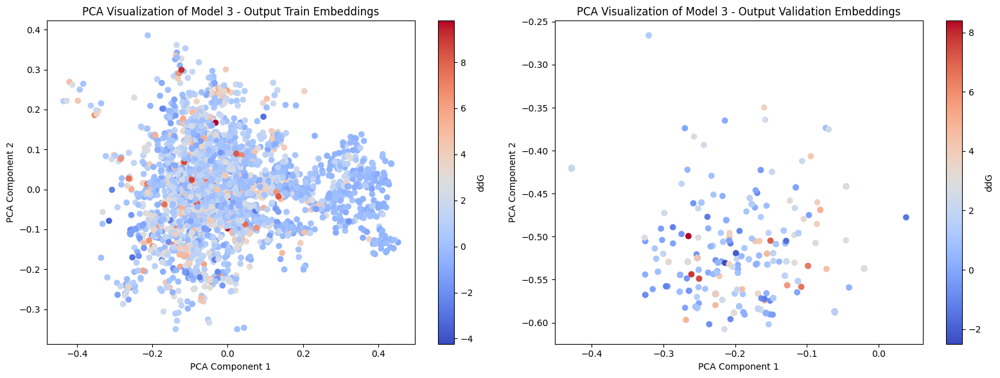

In [406]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(model3_best_train_embeddings_df['thermompnn_embedding'].tolist())
train_ddG_values = model3_best_train_embeddings_df['ddG'].values
val_embeddings = np.array(model3_best_val_embeddings_df['thermompnn_embedding'].tolist())
val_ddG_values = model3_best_val_embeddings_df['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 3 - Output Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 3 - Output Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

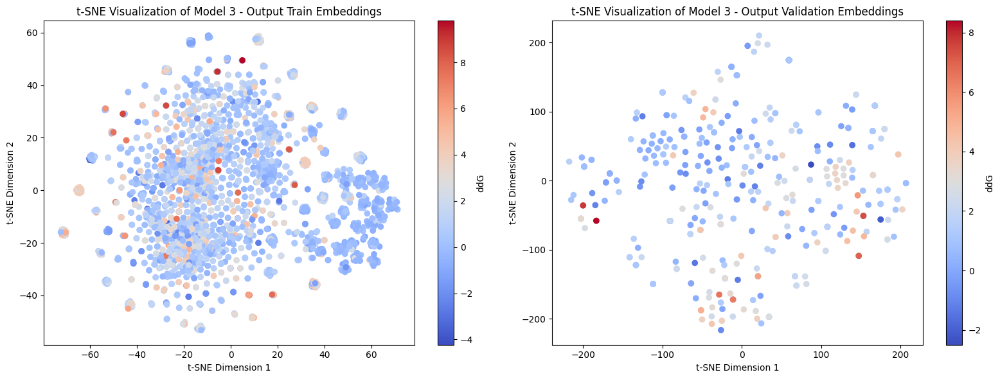

In [407]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(model3_best_train_embeddings_df['thermompnn_embedding'].tolist())
train_ddG_values = model3_best_train_embeddings_df['ddG'].values
val_embeddings = np.array(model3_best_val_embeddings_df['thermompnn_embedding'].tolist())
val_ddG_values = model3_best_val_embeddings_df['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 3 - Output Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 3 - Output Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [409]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error

# Define a function to train and evaluate the random forest regressor
def train_and_evaluate_random_forest(train_embeddings, train_ddG_values, val_embeddings, val_ddG_values):
    # Create a random forest regressor
    rf_regressor = RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42)
    
    # Train the random forest regressor
    rf_regressor.fit(train_embeddings, train_ddG_values)
    
    # Make predictions on the validation set
    val_predictions = rf_regressor.predict(val_embeddings)
    
    # Evaluate the regressor
    r2 = r2_score(val_ddG_values, val_predictions)
    mse = mean_squared_error(val_ddG_values, val_predictions)
    rmse = mean_squared_error(val_ddG_values, val_predictions, squared=False)
    
    return r2, mse, rmse

# Train and evaluate the random forest regressor for PCA embeddings
print("Random Forest Regressor - PCA Embeddings")
pca_r2, pca_mse, pca_rmse = train_and_evaluate_random_forest(
    train_embeddings_pca, train_ddG_values, val_embeddings_pca, val_ddG_values)
print(f"R-squared: {pca_r2:.4f}")
print(f"MSE: {pca_mse:.4f}")
print(f"RMSE: {pca_rmse:.4f}")
print()

# Train and evaluate the random forest regressor for t-SNE embeddings
print("Random Forest Regressor - t-SNE Embeddings")
tsne_r2, tsne_mse, tsne_rmse = train_and_evaluate_random_forest(
    train_embeddings_tsne, train_ddG_values, val_embeddings_tsne, val_ddG_values)
print(f"R-squared: {tsne_r2:.4f}")
print(f"MSE: {tsne_mse:.4f}")
print(f"RMSE: {tsne_rmse:.4f}")

Random Forest Regressor - PCA Embeddings
R-squared: -0.0554
MSE: 2.7011
RMSE: 1.6435

Random Forest Regressor - t-SNE Embeddings
R-squared: -0.4852
MSE: 3.8011
RMSE: 1.9496


c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [408]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define a function to train and evaluate the random forest classifier
def train_and_evaluate_random_forest(train_embeddings, train_ddG_values, val_embeddings, val_ddG_values):
    # Convert ddG values to binary labels (e.g., 0 for ddG < 0 and 1 for ddG >= 0)
    train_labels = (train_ddG_values >= 0).astype(int)
    val_labels = (val_ddG_values >= 0).astype(int)
    
    # Create a random forest classifier
    rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)
    
    # Train the random forest classifier
    rf_classifier.fit(train_embeddings, train_labels)
    
    # Make predictions on the validation set
    val_predictions = rf_classifier.predict(val_embeddings)
    
    # Evaluate the classifier
    accuracy = accuracy_score(val_labels, val_predictions)
    precision = precision_score(val_labels, val_predictions)
    recall = recall_score(val_labels, val_predictions)
    f1 = f1_score(val_labels, val_predictions)
    
    return accuracy, precision, recall, f1

# Train and evaluate the random forest classifier for PCA embeddings
print("Random Forest Classifier - PCA Embeddings")
pca_accuracy, pca_precision, pca_recall, pca_f1 = train_and_evaluate_random_forest(
    train_embeddings_pca, train_ddG_values, val_embeddings_pca, val_ddG_values)
print(f"Accuracy: {pca_accuracy:.4f}")
print(f"Precision: {pca_precision:.4f}")
print(f"Recall: {pca_recall:.4f}")
print(f"F1-score: {pca_f1:.4f}")
print()

# Train and evaluate the random forest classifier for t-SNE embeddings
print("Random Forest Classifier - t-SNE Embeddings")
tsne_accuracy, tsne_precision, tsne_recall, tsne_f1 = train_and_evaluate_random_forest(
    train_embeddings_tsne, train_ddG_values, val_embeddings_tsne, val_ddG_values)
print(f"Accuracy: {tsne_accuracy:.4f}")
print(f"Precision: {tsne_precision:.4f}")
print(f"Recall: {tsne_recall:.4f}")
print(f"F1-score: {tsne_f1:.4f}")

Random Forest Classifier - PCA Embeddings
Accuracy: 0.8593
Precision: 0.8593
Recall: 1.0000
F1-score: 0.9243

Random Forest Classifier - t-SNE Embeddings
Accuracy: 0.6106
Precision: 0.8425
Recall: 0.6725
F1-score: 0.7480


MODEL 4

In [106]:
# read train_embeddings_data.csv and val_embeddings_data.csv
train_kaggle_embeddings = pd.read_pickle('embeddings_model4/train_data_model4.pkl')
val_kaggle_embeddings = pd.read_pickle('embeddings_model4/val_data_model4.pkl')

print("Train Embeddings Data Shape:", train_kaggle_embeddings.shape)
print("Val Embeddings Data Shape:", val_kaggle_embeddings.shape)

Train Embeddings Data Shape: (2645, 6)
Val Embeddings Data Shape: (398, 6)


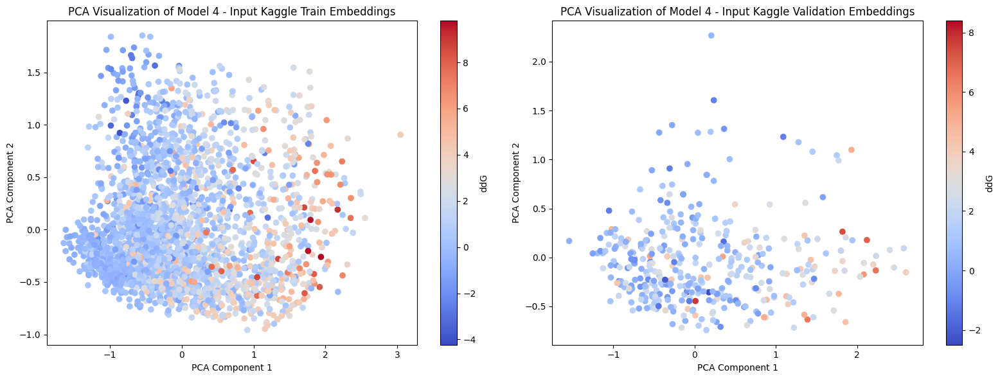

In [107]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train_kaggle_embeddings['trained_embedding'].tolist())
train_ddG_values = train_kaggle_embeddings['ddG'].values
val_embeddings = np.array(val_kaggle_embeddings['trained_embedding'].tolist())
val_ddG_values = val_kaggle_embeddings['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 4 - Input Kaggle Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 4 - Input Kaggle Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

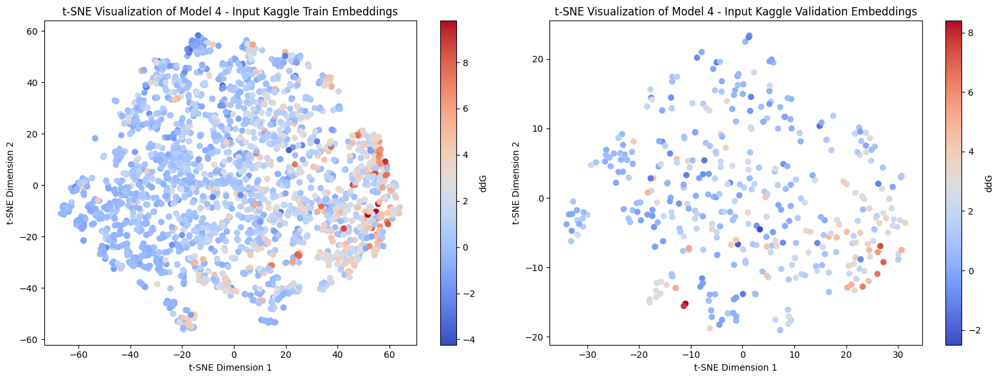

In [109]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train_kaggle_embeddings['trained_embedding'].tolist())
train_ddG_values = train_kaggle_embeddings['ddG'].values
val_embeddings = np.array(val_kaggle_embeddings['trained_embedding'].tolist())
val_ddG_values = val_kaggle_embeddings['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 4 - Input Kaggle Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 4 - Input Kaggle Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [110]:
# Load the embeddings for the best-performing epoch
epoch_number = 49
thermompnn_train_embeddings_df = pd.read_pickle(f'embeddings_model1/train_embeddings_epoch_{epoch_number}.pkl')
thermompnn_val_embeddings_df = pd.read_pickle(f'embeddings_model1/val_embeddings_epoch_{epoch_number}.pkl')
print("Train Embeddings Data Shape:", thermompnn_train_embeddings_df.shape)
print("Val Embeddings Data Shape:", thermompnn_val_embeddings_df.shape)

Train Embeddings Data Shape: (2645, 6)
Val Embeddings Data Shape: (398, 6)


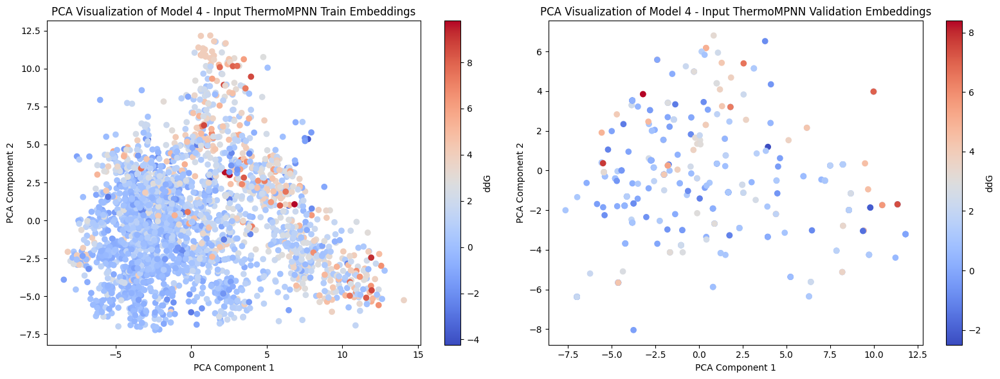

In [112]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(model1_best_train_embeddings_df['thermompnn_embedding'].tolist())
train_ddG_values = model1_best_train_embeddings_df['ddG'].values
val_embeddings = np.array(model1_best_val_embeddings_df['thermompnn_embedding'].tolist())
val_ddG_values = model1_best_val_embeddings_df['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 4 - Input ThermoMPNN Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 4 - Input ThermoMPNN Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

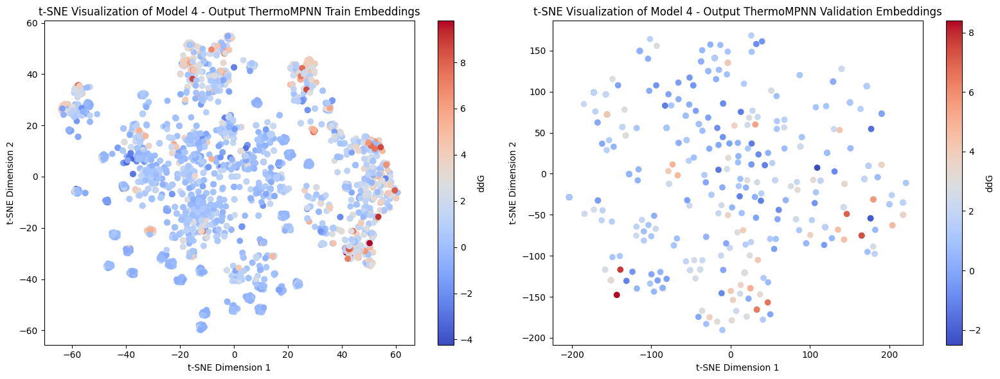

In [113]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(model1_best_train_embeddings_df['thermompnn_embedding'].tolist())
train_ddG_values = model1_best_train_embeddings_df['ddG'].values
val_embeddings = np.array(model1_best_val_embeddings_df['thermompnn_embedding'].tolist())
val_ddG_values = model1_best_val_embeddings_df['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 4 - Output ThermoMPNN Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 4 - Output ThermoMPNN Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [117]:
# Merge train_embeddings_df and ESM_embeddings_df based on matching columns
merged_df_train = pd.merge(model1_best_train_embeddings_df, train_kaggle_embeddings, on=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG'], how='left')

# Concatenate the embeddings
merged_df_train['combined_embedding'] = merged_df_train.apply(lambda row: np.concatenate((row['thermompnn_embedding'], row['trained_embedding'])), axis=1)

# Drop the individual embedding columns
merged_df_train = merged_df_train.drop(['thermompnn_embedding', 'trained_embedding'], axis=1)

# Merge train_embeddings_df and ESM_embeddings_df based on matching columns
merged_df_val = pd.merge(model1_best_val_embeddings_df, val_kaggle_embeddings, on=['pdb_id', 'position', 'wildtype', 'mutation', 'ddG'], how='left')

# Concatenate the embeddings
merged_df_val['combined_embedding'] = merged_df_val.apply(lambda row: np.concatenate((row['thermompnn_embedding'], row['trained_embedding'])), axis=1)

# Drop the individual embedding columns
merged_df_val = merged_df_val.drop(['thermompnn_embedding', 'trained_embedding'], axis=1)

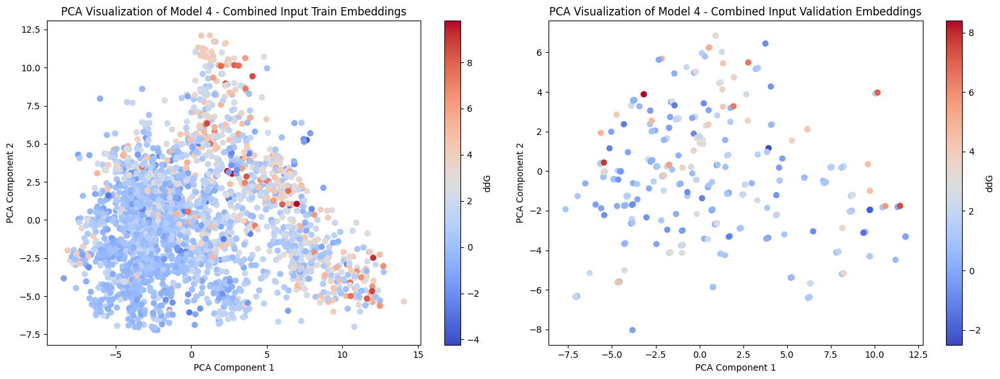

In [120]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(merged_df_train['combined_embedding'].tolist())
train_ddG_values = merged_df_train['ddG'].values
val_embeddings = np.array(merged_df_val['combined_embedding'].tolist())
val_ddG_values = merged_df_val['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 4 - Combined Input Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 4 - Combined Input Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

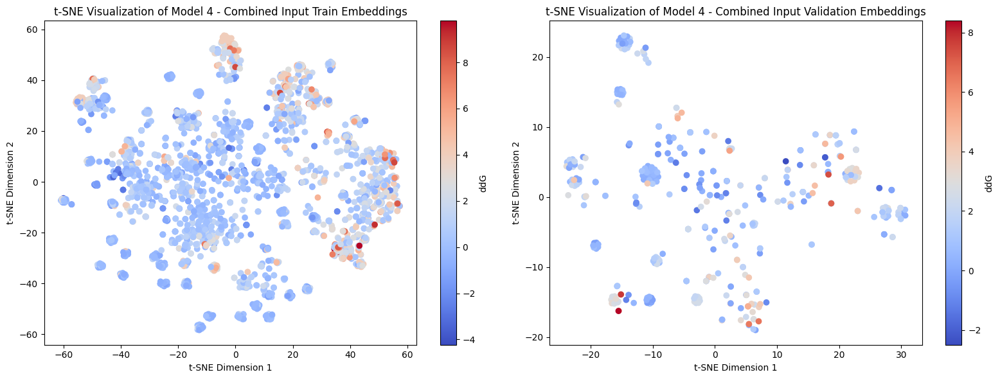

In [121]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(merged_df_train['combined_embedding'].tolist())
train_ddG_values = merged_df_train['ddG'].values
val_embeddings = np.array(merged_df_val['combined_embedding'].tolist())
val_ddG_values = merged_df_val['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 4 - Combined Input Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 4 - Combined Input Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [177]:
# read train_embeddings_data.csv and val_embeddings_data.csv
train_combined_embeddings_final = pd.read_pickle('embeddings_model4/train_data_model4_COMBINED.pkl')
val_combined_embeddings_final = pd.read_pickle('embeddings_model4/val_data_model4_COMBINED.pkl')

print("Train Embeddings Data Shape:", train_kaggle_embeddings.shape)
print("Val Embeddings Data Shape:", val_kaggle_embeddings.shape)

Train Embeddings Data Shape: (2645, 6)
Val Embeddings Data Shape: (398, 6)


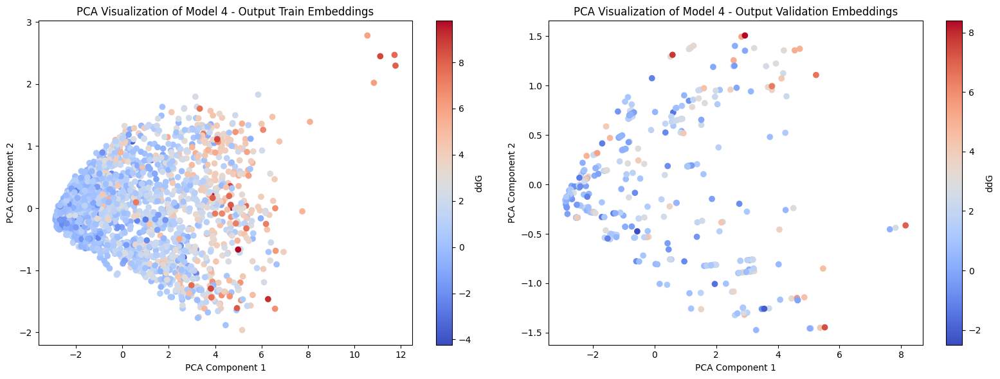

In [180]:
# Extract the linear input embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train_combined_embeddings_final['trained_embedding'].tolist())
train_ddG_values = train_combined_embeddings_final['ddG'].values
val_embeddings = np.array(val_combined_embeddings_final['trained_embedding'].tolist())
val_ddG_values = val_combined_embeddings_final['ddG'].values

# Apply PCA to reduce the dimensionality of the embeddings
pca = PCA(n_components=2)
train_embeddings_pca = pca.fit_transform(train_embeddings)
val_embeddings_pca = pca.transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_pca[:, 0], train_embeddings_pca[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('PCA Visualization of Model 4 - Output Train Embeddings')
ax1.set_xlabel('PCA Component 1')
ax1.set_ylabel('PCA Component 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_pca[:, 0], val_embeddings_pca[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('PCA Visualization of Model 4 - Output Validation Embeddings')
ax2.set_xlabel('PCA Component 1')
ax2.set_ylabel('PCA Component 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

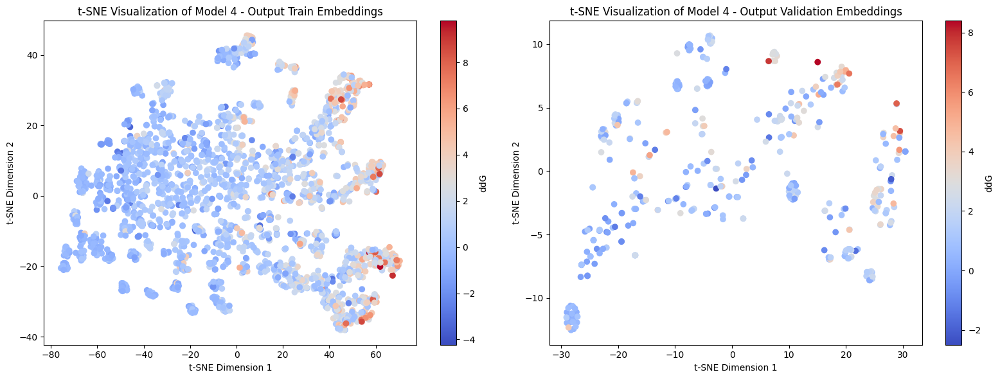

In [181]:
# Extract the combined embeddings and ddG values for train and validation data separately
train_embeddings = np.array(train_combined_embeddings_final['trained_embedding'].tolist())
train_ddG_values = train_combined_embeddings_final['ddG'].values
val_embeddings = np.array(val_combined_embeddings_final['trained_embedding'].tolist())
val_ddG_values = val_combined_embeddings_final['ddG'].values

# Apply t-SNE to reduce the dimensionality of the embeddings
tsne = TSNE(n_components=2, random_state=42)
train_embeddings_tsne = tsne.fit_transform(train_embeddings)
val_embeddings_tsne = tsne.fit_transform(val_embeddings)

# Create separate plots for train and validation data
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot train embeddings
sc1 = ax1.scatter(train_embeddings_tsne[:, 0], train_embeddings_tsne[:, 1], c=train_ddG_values, cmap='coolwarm')
ax1.set_title('t-SNE Visualization of Model 4 - Output Train Embeddings')
ax1.set_xlabel('t-SNE Dimension 1')
ax1.set_ylabel('t-SNE Dimension 2')
cbar1 = fig.colorbar(sc1, ax=ax1, label='ddG')

# Plot validation embeddings
sc2 = ax2.scatter(val_embeddings_tsne[:, 0], val_embeddings_tsne[:, 1], c=val_ddG_values, cmap='coolwarm')
ax2.set_title('t-SNE Visualization of Model 4 - Output Validation Embeddings')
ax2.set_xlabel('t-SNE Dimension 1')
ax2.set_ylabel('t-SNE Dimension 2')
cbar2 = fig.colorbar(sc2, ax=ax2, label='ddG')

plt.tight_layout()
plt.show()

In [183]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error

# Define a function to train and evaluate the random forest regressor
def train_and_evaluate_random_forest(train_embeddings, train_ddG_values, val_embeddings, val_ddG_values):
    # Create a random forest regressor
    rf_regressor = RandomForestRegressor(n_estimators=100, max_depth=5, random_state=42)
    
    # Train the random forest regressor
    rf_regressor.fit(train_embeddings, train_ddG_values)
    
    # Make predictions on the validation set
    val_predictions = rf_regressor.predict(val_embeddings)
    
    # Evaluate the regressor
    r2 = r2_score(val_ddG_values, val_predictions)
    mse = mean_squared_error(val_ddG_values, val_predictions)
    rmse = mean_squared_error(val_ddG_values, val_predictions, squared=False)
    
    return r2, mse, rmse

# Train and evaluate the random forest regressor for PCA embeddings
print("Random Forest Regressor - PCA Embeddings")
pca_r2, pca_mse, pca_rmse = train_and_evaluate_random_forest(
    train_embeddings_pca, train_ddG_values, val_embeddings_pca, val_ddG_values)
print(f"R-squared: {pca_r2:.4f}")
print(f"MSE: {pca_mse:.4f}")
print(f"RMSE: {pca_rmse:.4f}")
print()

# Train and evaluate the random forest regressor for t-SNE embeddings
print("Random Forest Regressor - t-SNE Embeddings")
tsne_r2, tsne_mse, tsne_rmse = train_and_evaluate_random_forest(
    train_embeddings_tsne, train_ddG_values, val_embeddings_tsne, val_ddG_values)
print(f"R-squared: {tsne_r2:.4f}")
print(f"MSE: {tsne_mse:.4f}")
print(f"RMSE: {tsne_rmse:.4f}")

Random Forest Regressor - PCA Embeddings
R-squared: -0.0289
MSE: 2.6332
RMSE: 1.6227

Random Forest Regressor - t-SNE Embeddings


c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
c:\Users\karishma\anaconda3\envs\thermoMPNN\lib\site-packages\sklearn\metrics\_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


R-squared: -0.1812
MSE: 3.0231
RMSE: 1.7387


In [386]:
# Define a function to train and evaluate the random forest classifier
def train_and_evaluate_random_forest(train_embeddings, train_ddG_values, val_embeddings, val_ddG_values):
    # Convert ddG values to binary labels (e.g., 0 for ddG < 0 and 1 for ddG >= 0)
    train_labels = (train_ddG_values >= 0).astype(int)
    val_labels = (val_ddG_values >= 0).astype(int)
    
    # Create a random forest classifier
    rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=5, random_state=42)
    
    # Train the random forest classifier
    rf_classifier.fit(train_embeddings, train_labels)
    
    # Make predictions on the validation set
    val_predictions = rf_classifier.predict(val_embeddings)
    
    # Evaluate the classifier
    accuracy = accuracy_score(val_labels, val_predictions)
    precision = precision_score(val_labels, val_predictions)
    recall = recall_score(val_labels, val_predictions)
    f1 = f1_score(val_labels, val_predictions)
    
    return accuracy, precision, recall, f1

# Train and evaluate the random forest classifier for PCA embeddings
print("Random Forest Classifier - PCA Embeddings")
pca_accuracy, pca_precision, pca_recall, pca_f1 = train_and_evaluate_random_forest(
    train_embeddings_pca, train_ddG_values, val_embeddings_pca, val_ddG_values)
print(f"Accuracy: {pca_accuracy:.4f}")
print(f"Precision: {pca_precision:.4f}")
print(f"Recall: {pca_recall:.4f}")
print(f"F1-score: {pca_f1:.4f}")
print()

# Train and evaluate the random forest classifier for t-SNE embeddings
print("Random Forest Classifier - t-SNE Embeddings")
tsne_accuracy, tsne_precision, tsne_recall, tsne_f1 = train_and_evaluate_random_forest(
    train_embeddings_tsne, train_ddG_values, val_embeddings_tsne, val_ddG_values)
print(f"Accuracy: {tsne_accuracy:.4f}")
print(f"Precision: {tsne_precision:.4f}")
print(f"Recall: {tsne_recall:.4f}")
print(f"F1-score: {tsne_f1:.4f}")

Random Forest Classifier - PCA Embeddings
Accuracy: 0.7789
Precision: 0.8825
Recall: 0.8567
F1-score: 0.8694

Random Forest Classifier - t-SNE Embeddings
Accuracy: 0.6181
Precision: 0.9060
Recall: 0.6199
F1-score: 0.7361
